<a href="https://colab.research.google.com/github/andersonsam/cnn_lstm_era_hindcast/blob/main/removed_from_main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Removed

In [ ]:
def make_heat_linear(model, x_test, y_test, style_dict, days, iters_one_pass, stationInds, verbose, tol):

  """
  Makes heat map from linear ANN model.

  model: 
      .h5 keras model (linear ANN)
  x_test:
      tf tensor; test set of ERA data, input to model (shape = Ntest x 365 x height x width x channels --> each observation then flattened w/i the function before being passed through the model)
  y_test:
      tf tensor; test set of streamflow data, target output of model (shape = Ntest x Nstations)
  style_dict:
      dictionary: {'style' : 'RISE' or 'gauss',
                   'params' : [h,w,p_1] or sigma}
          where [h,w,p_1] are the height/width/probability of perturbation of low-res mask (for RISE algorithm); sigma is the gaussian RMS width
  days:
      range of days in test set to perturb (e.g. days = range(0,365) will perturb the first 365 days in the test set)
  iters_one_pass:
      number of iterations to do at one time
  stationInds:
      indices of stations corresponding to the output neurons of the keras model
  verbose:
      0: print nothing
      1: print every 50th day
  tol:
      relative error threshold (when to stop pertubing model)
  """

  #initialize heat map as 3D numpy array: lat x lon x station
  heat_mean = np.zeros((np.size(x_test[0,0,:,:,0]), len(stationInds)))

  n_channels = np.shape(x_test)[-1] #number of channels of input video
  H = np.shape(x_test)[2] #height of input video, in pixels (latitude)
  W = np.shape(x_test)[3] #width of input video, in pixels (longitude)

  heat_prev = np.zeros((H*W,len(stationInds))) #initially, the previous heat map is 0's (for first pass)
  heat_curr = np.zeros((H*W,len(stationInds))) #also initialize the current heat map as 0's (will fill once calculated at end of first pass)
  kk = 0
  err = tol+1 #just to enter while loop
  while err > tol:
    
    # print(kk)
    #loop through specified days to generate mean sensitivity
    for day in days: #for each day that we will perturb

      #state progress
      if verbose:
        if np.mod(day,50)==0:
          print(' Day ' + str(day) + '/' + str(len(days))) 

      #number of iterations of perturbations for one forward pass through model
      iters = iters_one_pass 

      #define perturbation: rectangular as from RISE, or gaussian 
      if style_dict['style'] == 'RISE':
    
        h = style_dict['params'][0]
        w = style_dict['params'][1]
        p_1 = style_dict['params'][2]

        x_int = np.linspace(0,W,w) #low-res x indices
        y_int = np.linspace(0,H,h) #low-res y indices

        xnew = np.arange(W)
        ynew = np.arange(H) 

        perturb_small = np.random.choice([0,1],size = (iters,1,h,w), p = [1-p_1,p_1]) #binary perturbation on coarse grid
        perturb = np.half([interpolate.interp2d(x_int,y_int,perturb_small[iter][0])(xnew,ynew) for iter in range(iters)]) #perturbation is interpolated to finer grid

      elif style_dict['style'] == 'gauss':

        sigma = style_dict['params']

        x_int = np.arange(W)
        y_int = np.arange(H)
        x_mesh, y_mesh = np.meshgrid(x_int, y_int)

        #define gaussian perturbation for each iteration being passed
        perturb = np.half([np.exp( - ( (x_mesh - np.random.randint(0,W))**2 + (y_mesh - np.random.randint(0,H))**2 ) / (2*sigma**2) ) for iter in range(iters)])

      #copy/expand dimensions of the perturbation to be added to weather video
      perturb_2D = np.copy(perturb) #the 2D perturbation for each iteration of this pass
      perturb = tf.repeat(tf.expand_dims(tf.convert_to_tensor(perturb),3),nchannels, axis = 3) #expand along channels in one image
      perturb = tf.repeat(tf.expand_dims(tf.convert_to_tensor(perturb),1),365, axis = 1) #expand along images in one video

      xday = x_test[day] #current day in test set
      xday_iters = [xday for val in range(iters)] #repeat for each iteration (e.g. make copy for each perturbation)

      factor = np.random.choice([-1,1],p = [0.5,0.5]).astype('float16') #whether to add or subtract perturbation from input video, 50-50 chance of each
      perturb = factor*perturb

      x1 = perturb
      x2 = tf.convert_to_tensor(xday_iters)
      xday_iters_perturb = tf.math.add(x1,x2)

      x_all = tf.squeeze(tf.concat((tf.expand_dims(xday, axis = 0),xday_iters_perturb), axis = 0)) #'all' refers to original (xday) and perturbed (xday_iters_perturb)
      x_all_ds = tf.data.Dataset.from_tensor_slices(x_all).batch(batch_size = 64)
      y_all = model.predict(x_all_ds)

      yday = y_all[0] #first element is unperturbed model prediction
      yday_perturb = y_all[1:] #all others are perturbed model predictions for each iteration of perturbation

      for station in range(np.shape(y_all)[1]): #for each station, calculate sensitivity heat map of sensitivity from sensitivty = |deltaQ| * perturbation

        yday_station = yday[station] #original unperturbed model prediction
        yday_station_perturb = yday_perturb[:,station]

        ydiffs = np.abs(np.reshape(yday_station - yday_station_perturb[:iters],(-1,1))) #magnitude difference between perturbed and unperturbed streamflow
        delta = np.ones((len(ydiffs),H,W)) * ydiffs[:,None] #get dimensions to match so delta can be multiplied by perturbation

        heat_iters = np.asarray(delta[:iters]) * np.asarray(perturb_2D)
        heat = np.mean(heat_iters[:iters], axis=0) 

        heat_mean[:,station] += heat.flatten() 

      del heat, heat_iters, delta, ydiffs, x_all, xday_iters #delete for memory

    n_iters = iters_one_pass*(kk+1)
    heat_curr = np.copy(heat_mean) / n_iters
    err = np.mean(np.abs(heat_curr - heat_prev)) / np.mean(heat_prev)

    heat_prev = np.copy(heat_curr)

    kk += 1

  heat_mean = heat_mean /(kk * len(days))

  return heat_mean

In [ ]:
rgbas = [[241, 135, 1,256],
      [205, 223, 160,256],
      [159, 222, 249,256],
      [233, 134, 207,256],
      [21, 96, 121,256],
      [100, 23, 35,256]]
rgbas_array = np.asarray(rgbas)/256

In [ ]:
#visualize clustering results (spatial + temporal patterns), elevation, and climate

saveIt = 0

fs = 12 #fontsize

abc = ['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)']

nrows = 5
ncols = 4

fig = plt.figure(figsize = (8,6))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

##### top left side: spatial map of stations, coloured by cluster to which they belong

ax0 = fig.add_subplot(gs[:3,:2])

plot_prov_ax(prov=prov, ax = ax0)
ax0.scatter(stationLon[stationInds], stationLat[stationInds], c = cStations, s = 50, linewidth = 1, edgeColor = 'k', zOrder = 3)
ax0.tick_params(labelsize = fs-6)
ax0.set_title('Clusters in Space', fontsize = fs)
ax0.set_xlim((extentERA[0], extentERA[1]))
ax0.set_ylim((extentERA[2], extentERA[3]))
ax0.text(x = -0.1, y = 1.03, s = abc[0], transform = ax0.transAxes, fontsize = fs)

for basin in stationBasins:
  if basin is not None:
    x,y = basin.exterior.xy
    ax0.plot(x, y, color = 'gray', linewidth = 0.75)

##### top right side: subplots of seasonal streamflow of each cluster 

subplot_rows = [0,0,1,1,2,2]
subplot_cols = [2,3,2,3,2,3]

cluster_order = [4,5,0,2,3,1]

for kk, cluster in enumerate(cluster_order):

  ax = fig.add_subplot(gs[subplot_rows[kk], subplot_cols[kk]])
  ax.set_xticks(first_days_of_month[::2])
  ax.set_xlim((0,364))
  ax.set_ylim(bottom = np.min(cluster_patterns)-0.1, top = np.max(cluster_patterns)+0.3)
  ax.set_xticklabels(months_str[::2], rotation = 45)

  if kk<4:
    ax.set_xticklabels([])

  if np.mod(kk,2)==0:
    ax.set_yticklabels([])
  else:
    ax.tick_params(labelleft = False, labelright = True, left = False, right = True)

  if kk == 3:
    ax.set_ylabel('Normalized Streamflow')
    ax.yaxis.set_label_position("right")

  cluster_inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  var = np.median(cluster_input[cluster_inds,:365], axis = 0)
  # var = cluster_patterns[cluster,:365]
  q25 = np.percentile(cluster_input[cluster_inds,:365], q = 2.5, axis = 0)
  q75 = np.percentile(cluster_input[cluster_inds,:365], q = 97.5, axis = 0)

  ax.fill_between(x = np.arange(365), y1 = q25, y2 = q75, color = rgbs_array[cluster], alpha = 0.5)
  ax.plot(var, color = rgbs_array[cluster], linewidth = 2)
  ax.tick_params(labelsize = fs-2)
  ax.set_title(cluster_names[cluster], fontsize = fs)
  ax.grid(True, alpha = 0.25)

  ax.text(x = -0.15, y = 1.05, s = abc[kk+1], transform = ax.transAxes, fontsize = fs)

##### bottom: elevation and climate subplots

ax_DEM = fig.add_subplot(gs[-2:,0])
ax_Tmax = fig.add_subplot(gs[-2:,1])
ax_Tmin = fig.add_subplot(gs[-2:,2])
ax_P = fig.add_subplot(gs[-2:,3])

#DEM subplot
extentDEM = [minlon, maxlon, minlat, maxlat]
im_DEM = ax_DEM.imshow(dem, vmin = 0, aspect = 'auto', cmap = 'terrain', extent = extentDEM)
ax_DEM.tick_params(right = False, left = True, labelright = False, labelleft = True)
cb = plt.colorbar(im_DEM, ax = ax_DEM, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Elevation [m]', transform = cb.ax.transAxes)
ax_DEM.text(x = -0.15, y = 0.95, s = abc[7], transform = ax_DEM.transAxes, fontsize = fs)

#max temp subplot
im_Tmax = ax_Tmax.imshow(Tmax_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA)
ax_Tmax.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmax, ax = ax_Tmax, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{max}$ [$^\circ C$]', transform = cb.ax.transAxes)
ax_Tmax.text(x = -0.15, y = 0.95, s = abc[8], transform = ax_Tmax.transAxes, fontsize = fs)

#min temp subplot
im_Tmin = ax_Tmin.imshow(Tmin_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA)
ax_Tmin.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmin, ax = ax_Tmin, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{min}$ [$^\circ C$]', transform = cb.ax.transAxes)
ax_Tmin.text(x = -0.15, y = 0.95, s = abc[9], transform = ax_Tmin.transAxes, fontsize = fs)

#mean annual precip subplot
im_P = ax_P.imshow(Ptotal*6, aspect = 'auto', cmap = 'RdBu', extent = extentERA)
ax_P.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_P, ax = ax_P, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Annual $P$ [m]', transform = cb.ax.transAxes)
ax_P.text(x = -0.15, y = 0.95, s = abc[10], transform = ax_P.transAxes, fontsize = fs)

#add provincial borders
plot_prov_ax(prov=prov, ax = ax_DEM)
plot_prov_ax(prov=prov, ax = ax_Tmax)
plot_prov_ax(prov=prov, ax = ax_Tmin)
plot_prov_ax(prov=prov, ax = ax_P)

#set extent
ax_DEM.set_xlim(left = extentERA[0], right = extentERA[1])
ax_DEM.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmax.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmax.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmin.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmin.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_P.set_xlim(left = extentERA[0], right = extentERA[1])
ax_P.set_ylim(bottom = extentERA[2], top = extentERA[3])

plt.tight_layout(h_pad = -0.5)

#edit ticklabels
axes = [ax0, ax_DEM, ax_Tmax, ax_Tmin, ax_P]
for ax in axes:
  xtls = [str(int(item.get_text()[1:])) + '$^\circ$ W' for item in ax.get_xticklabels()]
  ax.set_xticklabels(xtls)
  ytls = [item.get_text() + '$^\circ$ N' for item in ax.get_yticklabels()]
  ax.set_yticklabels(ytls)

if saveIt:
  plt.savefig('cluster_patterns_climate.png', bbox_inches = 'tight', dpi = 300)

plt.show()

In [ ]:
#visualize clustering results (spatial + temporal patterns), elevation, and climate

saveIt = 0

fs = 12 #fontsize

abc = ['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)']

nrows = 5
ncols = 4

fig = plt.figure(figsize = (8,6))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

##### top left side: spatial map of stations, coloured by cluster to which they belong

ax0 = fig.add_subplot(gs[:3,:2])

plot_prov_ax(prov=prov, ax = ax0)
ax0.scatter(stationLon[stationInds], stationLat[stationInds], c = cStations, s = 50, linewidth = 1, edgeColor = 'k', zOrder = 3)
ax0.tick_params(labelsize = fs-6)
ax0.set_title('Clusters in Space', fontsize = fs)
ax0.set_xlim((extentERA[0], extentERA[1]))
ax0.set_ylim((extentERA[2], extentERA[3]))
ax0.text(x = -0.1, y = 1.03, s = abc[0], transform = ax0.transAxes, fontsize = fs)

for basin in stationBasins:
  if basin is not None:
    x,y = basin.exterior.xy
    ax0.plot(x, y, color = 'gray', linewidth = 0.75)

##### top right side: subplots of seasonal streamflow of each cluster 

subplot_rows = [0,0,1,1,2,2]
subplot_cols = [2,3,2,3,2,3]

cluster_order = [4,5,0,2,3,1]

for kk, cluster in enumerate(cluster_order):

  ax = fig.add_subplot(gs[subplot_rows[kk], subplot_cols[kk]])
  ax.set_xticks(first_days_of_month[::2])
  ax.set_xlim((0,364))
  ax.set_ylim(bottom = np.min(cluster_patterns)-0.1, top = np.max(cluster_patterns)+0.3)
  ax.set_xticklabels(months_str[::2], rotation = 45)

  if kk<4:
    ax.set_xticklabels([])

  if np.mod(kk,2)==0:
    ax.set_yticklabels([])
  else:
    ax.tick_params(labelleft = False, labelright = True, left = False, right = True)

  if kk == 3:
    ax.set_ylabel('Normalized Streamflow')
    ax.yaxis.set_label_position("right")

  cluster_inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  var = np.median(cluster_input[cluster_inds,:365], axis = 0)
  # var = cluster_patterns[cluster,:365]
  q25 = np.percentile(cluster_input[cluster_inds,:365], q = 2.5, axis = 0)
  q75 = np.percentile(cluster_input[cluster_inds,:365], q = 97.5, axis = 0)

  ax.fill_between(x = np.arange(365), y1 = q25, y2 = q75, color = rgbs_array[cluster], alpha = 0.5)
  ax.plot(var, color = rgbs_array[cluster], linewidth = 2)
  ax.tick_params(labelsize = fs-2)
  ax.set_title(cluster_names[cluster], fontsize = fs)
  ax.grid(True, alpha = 0.25)

  ax.text(x = -0.15, y = 1.05, s = abc[kk+1], transform = ax.transAxes, fontsize = fs)

##### bottom: elevation and climate subplots

ax_DEM = fig.add_subplot(gs[-2:,0])
ax_Tmax = fig.add_subplot(gs[-2:,1])
ax_Tmin = fig.add_subplot(gs[-2:,2])
ax_P = fig.add_subplot(gs[-2:,3])

#DEM subplot
extentDEM = [minlon, maxlon, minlat, maxlat]
im_DEM = ax_DEM.imshow(dem, vmin = 0, aspect = 'auto', cmap = 'terrain', extent = extentDEM)
ax_DEM.tick_params(right = False, left = True, labelright = False, labelleft = True)
cb = plt.colorbar(im_DEM, ax = ax_DEM, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Elevation [m]', transform = cb.ax.transAxes)
ax_DEM.text(x = -0.15, y = 0.95, s = abc[7], transform = ax_DEM.transAxes, fontsize = fs)

#max temp subplot
im_Tmax = ax_Tmax.imshow(Tmax_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA)
ax_Tmax.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmax, ax = ax_Tmax, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{max}$ [$^\circ C$]', transform = cb.ax.transAxes)
ax_Tmax.text(x = -0.15, y = 0.95, s = abc[8], transform = ax_Tmax.transAxes, fontsize = fs)

#min temp subplot
im_Tmin = ax_Tmin.imshow(Tmin_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA)
ax_Tmin.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmin, ax = ax_Tmin, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{min}$ [$^\circ C$]', transform = cb.ax.transAxes)
ax_Tmin.text(x = -0.15, y = 0.95, s = abc[9], transform = ax_Tmin.transAxes, fontsize = fs)

#mean annual precip subplot
im_P = ax_P.imshow(Ptotal*6, aspect = 'auto', cmap = 'RdBu', extent = extentERA)
ax_P.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_P, ax = ax_P, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Annual $P$ [m]', transform = cb.ax.transAxes)
ax_P.text(x = -0.15, y = 0.95, s = abc[10], transform = ax_P.transAxes, fontsize = fs)

#add provincial borders
plot_prov_ax(prov=prov, ax = ax_DEM)
plot_prov_ax(prov=prov, ax = ax_Tmax)
plot_prov_ax(prov=prov, ax = ax_Tmin)
plot_prov_ax(prov=prov, ax = ax_P)

#set extent
ax_DEM.set_xlim(left = extentERA[0], right = extentERA[1])
ax_DEM.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmax.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmax.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmin.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmin.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_P.set_xlim(left = extentERA[0], right = extentERA[1])
ax_P.set_ylim(bottom = extentERA[2], top = extentERA[3])

plt.tight_layout(h_pad = -0.5)

#edit ticklabels
axes = [ax0, ax_DEM, ax_Tmax, ax_Tmin, ax_P]
for ax in axes:
  xtls = [str(int(item.get_text()[1:])) + '$^\circ$ W' for item in ax.get_xticklabels()]
  ax.set_xticklabels(xtls)
  ytls = [item.get_text() + '$^\circ$ N' for item in ax.get_yticklabels()]
  ax.set_yticklabels(ytls)

if saveIt:
  plt.savefig('cluster_patterns_climate.png', bbox_inches = 'tight', dpi = 300)

plt.show()

In [ ]:
#AGU POSTER

saveIt = 0

fs = 20 #fontsize

abc = ['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)']

nrows = 2
ncols = 4

fig = plt.figure(figsize = (8,8))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

##### top left side: spatial map of stations, coloured by cluster to which they belong

ax0 = fig.add_subplot(gs[:1,:2])

### INSET
rgb_bb = np.array([46, 134, 171]) / 255
canada_east = -108
canada_west = -142
canada_north = 60
canada_south = 46
ax_inset = plt.axes([0,0,1,1], aspect = 'auto')
ip = InsetPosition(ax0, [0.,0.,0.35,0.35])
ax_inset.set_axes_locator(ip)
plot_prov_ax(prov = 'all', ax = ax_inset, linewidth = 0.3)

#bounding box
x = [-133,-133,-110,-110,-133]
y = [48,56,56,48,48]
ax_inset.plot(x,y, color = rgb_bb, linewidth = 4)
ax0.plot(x,y, color = rgb_bb, linewidth = 4)
ax_inset.tick_params(bottom = False, left = False, labelbottom = False, labelleft = False)
###

plot_prov_ax(prov=prov, ax = ax0)
ax0.scatter(stationLon[stationInds], stationLat[stationInds], c = cStations_regimes, s = 50, linewidth = 1, edgeColor = 'k', zOrder = 3)
ax0.tick_params(labelsize = fs-6)
ax0.set_title('Study Region', fontsize = fs)
ax0.set_xlim((extentERA[0]-4.5, extentERA[1]+1))
ax0.set_ylim((extentERA[2]-1, extentERA[3]+1))
# ax0.text(x = -0.1, y = 1.03, s = abc[0], transform = ax0.transAxes, fontsize = fs)

for basin in stationBasins:
  if basin is not None:
    x,y = basin.exterior.xy
    ax0.plot(x, y, color = 'gray', linewidth = 0.75)

##### top right side: subplots of seasonal streamflow of each cluster 

subplot_rows = [0,1,2]
subplot_cols = [3,3,3]

cluster_order = [0,1,2]
ax = fig.add_subplot(gs[:1,2:])
# ax.text(x = -0.15, y = 1.05, s = abc[1], transform = ax.transAxes, fontsize = fs)
for kk, cluster in enumerate(cluster_order):

  ax.set_xticks(first_days_of_month[::2])
  ax.set_xlim((0,364))
  ax.set_ylim(bottom = np.min(cluster_patterns)-0.1, top = np.max(cluster_patterns)+0.1)
  ax.set_xticklabels(months_str[::2], rotation = 45)

  if kk < 2:
    ax.set_xticklabels([])

  ax.tick_params(labelleft = False, labelright = True, left = False, right = True)

  if kk == 1:
    ax.set_ylabel('Normalized Streamflow', fontsize = fs)
    ax.yaxis.set_label_position("right")

  cluster_inds = np.squeeze(np.argwhere(regime_classes == cluster))

  var = np.mean(cluster_input[cluster_inds,:365], axis = 0)
  std = np.std(cluster_input[cluster_inds,:365], axis = 0)

  # ax.fill_between(x = range(365), y1 = var + std, y2 = var - std, alpha = 0.2, color = rgb_regimes[cluster,:])
  ax.plot(var, color = rgb_regimes[cluster], linewidth = 2, label = regime_class_names[cluster])

ax.tick_params(labelsize = fs-6)
ax.set_title('Streamflow Regime', fontsize = fs)
ax.grid(True, alpha = 0.25)
ax.legend(fontsize = fs - 4)

##### bottom: elevation and climate subplots

ax_DEM = fig.add_subplot(gs[-1,0])
ax_Tmax = fig.add_subplot(gs[-1,1])
ax_Tmin = fig.add_subplot(gs[-1,2])
ax_P = fig.add_subplot(gs[-1,3])

#DEM subplot
extentDEM = np.array([minlon, maxlon, minlat, maxlat])
im_DEM = ax_DEM.imshow(dem, vmin = 0, aspect = 'auto', cmap = 'terrain', extent = extentDEM)
ax_DEM.tick_params(right = False, left = True, labelright = False, labelleft = True)
cb = plt.colorbar(im_DEM, ax = ax_DEM, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Elevation [m]', transform = cb.ax.transAxes, fontsize = fs - 6)
# ax_DEM.text(x = -0.15, y = 0.95, s = abc[2], transform = ax_DEM.transAxes, fontsize = fs)

#max temp subplot
im_Tmax = ax_Tmax.imshow(Tmax_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentDEM)
ax_Tmax.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmax, ax = ax_Tmax, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{max}$ [$^\circ C$]', transform = cb.ax.transAxes, fontsize = fs - 6)
# ax_Tmax.text(x = -0.15, y = 0.95, s = abc[3], transform = ax_Tmax.transAxes, fontsize = fs)

#min temp subplot
im_Tmin = ax_Tmin.imshow(Tmin_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentDEM)
ax_Tmin.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmin, ax = ax_Tmin, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{min}$ [$^\circ C$]', transform = cb.ax.transAxes, fontsize = fs - 6)
# ax_Tmin.text(x = -0.15, y = 0.95, s = abc[4], transform = ax_Tmin.transAxes, fontsize = fs)

#mean annual precip subplot
im_P = ax_P.imshow(Ptotal*6, aspect = 'auto', cmap = 'RdBu', extent = extentDEM)
ax_P.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_P, ax = ax_P, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Annual $P$ [m]', transform = cb.ax.transAxes, fontsize = fs - 6)
cb.ax.tick_params(labelsize = fs - 8)
# ax_P.text(x = -0.15, y = 0.95, s = abc[5], transform = ax_P.transAxes, fontsize = fs)

#add provincial borders
plot_prov_ax(prov=prov, ax = ax_DEM)
plot_prov_ax(prov=prov, ax = ax_Tmax)
plot_prov_ax(prov=prov, ax = ax_Tmin)
plot_prov_ax(prov=prov, ax = ax_P)

#set extent
ax_DEM.set_xlim(left = extentERA[0], right = extentERA[1])
ax_DEM.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmax.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmax.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmin.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmin.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_P.set_xlim(left = extentERA[0], right = extentERA[1])
ax_P.set_ylim(bottom = extentERA[2], top = extentERA[3])

plt.tight_layout()#h_pad = -0.5)

# #edit ticklabels
# axes = [ax0, ax_DEM, ax_Tmax, ax_Tmin, ax_P]
# for ax in axes:
#   xtls = [str(int(item.get_text()[1:])) + '$^\circ$ W' for item in ax.get_xticklabels()]
#   ax.set_xticklabels(xtls)
#   ytls = [item.get_text() + '$^\circ$ N' for item in ax.get_yticklabels()]
#   ax.set_yticklabels(ytls)

plt.tight_layout(w_pad = -1.25, h_pad = 0.25)

if saveIt:
  plt.savefig('cluster_patterns_climate_AGU.png', bbox_inches = 'tight', dpi = 600)

plt.show()

In [ ]:
#visualize clustering results (spatial + temporal patterns), elevation, and climate

#colours of each station
cStations_glacier = np.empty((len(stationInds), 3))
for kk in range(len(stationInds)):
  cStations_glacier[kk,:] = rgbs_glacier[seasonal_clustering_labels_glacier[kk],:]
# cStations /= 256

saveIt = 0

fs = 12 #fontsize

abc = ['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)']

nrows = 4
ncols = 5

fig = plt.figure(figsize = (10,8))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

# ##### top left side: spatial map of stations, coloured by cluster to which they belong

ax0 = fig.add_subplot(gs[:3,1:4])

### INSET
rgb_bb = np.array([46, 134, 171]) / 255
canada_east = -108
canada_west = -142
canada_north = 60
canada_south = 46
ax_inset = plt.axes([0,0,1,1], aspect = 'auto')
ip = InsetPosition(ax0, [0.025,0.025,0.3,0.3])
ax_inset.set_axes_locator(ip)
plot_prov_ax(prov = 'all', ax = ax_inset, linewidth = 0.3)

#bounding box
x = [-133,-133,-110,-110,-133]
y = [48,56,56,48,48]
ax_inset.plot(x,y, color = rgb_bb, linewidth = 3)
ax0.plot(x,y, color = rgb_bb, linewidth = 3)
ax_inset.tick_params(bottom = False, left = False, labelbottom = False, labelleft = False)
###

plot_prov_ax(prov=prov, ax = ax0)
ax0.scatter(stationLon[stationInds], stationLat[stationInds], c = cStations_glacier, s = 75, linewidth = 1, edgeColor = 'k', zOrder = 3)#, alpha = 0.8)
ax0.tick_params(labelsize = fs-2)
ax0.set_title('Clusters in Space', fontsize = fs)
ax0.set_xlim((extentERA[0]-4, extentERA[1]+1))
ax0.set_ylim((extentERA[2]-0.25, extentERA[3]+0.))
ax0.text(x = -0.05, y = 1.015, s = abc[0], transform = ax0.transAxes, fontsize = fs)

for basin in stationBasins:
  if basin is not None:
    x,y = basin.exterior.xy
    ax0.plot(x, y, color = 'gray', linewidth = 0.75)

##### top right side: subplots of seasonal streamflow of each cluster 

subplot_rows = [0,1,2,3,3,3,3]
subplot_cols = [0,0,0,0,1,2,3]

# cluster_order = [4,5,0,2,3,1]
cluster_order = [0,1,2,3,4,5,6]
cluster_order = [5,0,1,4,2,3,6]

for kk, cluster in enumerate(cluster_order):

  ax = fig.add_subplot(gs[subplot_rows[kk], subplot_cols[kk]])
  ax.set_xticks(first_days_of_month[::2])
  ax.set_xlim((0,364))
  # ax.set_ylim(bottom = np.min(cluster_patterns)-0.1, top = np.max(cluster_patterns)+0.3)
  ax.set_xticklabels(months_str[::2], rotation = 45)

  if kk<3:
    ax.set_xticklabels([])

  if kk <= 3:
    ax.set_ylabel('Normalized Streamflow')
    # ax.yaxis.set_label_position("right")

  cluster_inds = np.squeeze(np.argwhere(seasonal_clustering_labels_glacier == cluster))
  var = np.median(cluster_input[cluster_inds,:365], axis = 0)
  # var = cluster_patterns[cluster,:365]
  q25 = np.percentile(cluster_input[cluster_inds,:365], q = 10, axis = 0)
  q75 = np.percentile(cluster_input[cluster_inds,:365], q = 90, axis = 0)

  ax.fill_between(x = np.arange(365), y1 = q25, y2 = q75, color = rgbs_glacier[cluster,:], alpha = 0.5)
  ax.plot(var, color = rgbs_glacier[cluster,:], linewidth = 2)
  ax.tick_params(labelsize = fs-2)
  ax.set_title(cluster_names_glacier[cluster], fontsize = fs)
  ax.grid(True, alpha = 0.25)

  ax.text(x = -0.15, y = 1.05, s = abc[kk+1], transform = ax.transAxes, fontsize = fs)

##### bottom: elevation and climate subplots

ax_DEM = fig.add_subplot(gs[-1,-1])
ax_Tmax = fig.add_subplot(gs[0,-1])
ax_Tmin = fig.add_subplot(gs[1,-1])
ax_P = fig.add_subplot(gs[2,-1])

#DEM subplot
extentDEM = [minlon, maxlon, minlat, maxlat]
im_DEM = ax_DEM.imshow(dem, vmin = 0, aspect = 'auto', cmap = 'terrain', extent = extentDEM)
ax_DEM.set_title('Elevation')
ax_DEM.tick_params(right = False, left = True, labelright = False, labelleft = True)
cb = plt.colorbar(im_DEM, ax = ax_DEM)#, orientation = 'horizontal')
cb.set_label('Elevation [m]')
ax_DEM.text(x = -0.15, y = 1.05, s = abc[8], transform = ax_DEM.transAxes, fontsize = fs)

#max temp subplot
im_Tmax = ax_Tmax.imshow(Tmax_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA)
ax_Tmax.set_title('Mean $T_{max}$')
ax_Tmax.tick_params(right = False, left = True, labelright = False, labelleft = True, labelbottom = False)
cb = plt.colorbar(im_Tmax, ax = ax_Tmax)#, orientation = 'horizontal')
cb.set_label('Mean $T_{max}$ [$^\circ C$]')
ax_Tmax.text(x = -0.15, y = 1.05, s = abc[11], transform = ax_Tmax.transAxes, fontsize = fs)

#min temp subplot
im_Tmin = ax_Tmin.imshow(Tmin_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA)
ax_Tmin.set_title('Mean $T_{min}$')
ax_Tmin.tick_params(right = False, left = True, labelright = False, labelleft = True, labelbottom = False)
cb = plt.colorbar(im_Tmin, ax = ax_Tmin)#, orientation = 'horizontal')
cb.set_label('Mean $T_{min}$ [$^\circ C$]')
ax_Tmin.text(x = -0.15, y = 1.05, s = abc[10], transform = ax_Tmin.transAxes, fontsize = fs)

#mean annual precip subplot
im_P = ax_P.imshow(Ptotal*6, aspect = 'auto', cmap = 'RdBu', extent = extentERA)
ax_P.set_title('Annual $P$')
ax_P.tick_params(right = False, left = True, labelright = False, labelleft = True, labelbottom = False)
cb = plt.colorbar(im_P, ax = ax_P)#, orientation = 'horizontal')
cb.set_label('Annual $P$ [m]')
ax_P.text(x = -0.15, y = 1.05, s = abc[9], transform = ax_P.transAxes, fontsize = fs)

#add provincial borders
plot_prov_ax(prov=prov, ax = ax_DEM)
plot_prov_ax(prov=prov, ax = ax_Tmax)
plot_prov_ax(prov=prov, ax = ax_Tmin)
plot_prov_ax(prov=prov, ax = ax_P)

#set extent
ax_DEM.set_xlim(left = extentERA[0], right = extentERA[1])
ax_DEM.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmax.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmax.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmin.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmin.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_P.set_xlim(left = extentERA[0], right = extentERA[1])
ax_P.set_ylim(bottom = extentERA[2], top = extentERA[3])

# plt.tight_layout()

plt.tight_layout()#h_pad = -0.1)

#edit ticklabels
axes = [ax0, ax_DEM, ax_Tmax, ax_Tmin, ax_P]
for kk, ax in enumerate(axes):

  #xticks
  if kk == 0:
    xtls = [str(int(item.get_text()[1::])) + '$^\circ$W' for item in ax.get_xticklabels()]
  else:
    ax.set_xticks([-130,-110])
    ax.set_xticklabels([-130,-110])
    xtls = [str(int(item.get_text()[1::])) + '$^\circ$W' for item in ax.get_xticklabels()]
  ax.set_xticklabels(xtls)

  #yticks
  if kk == 0:
    ytls = [item.get_text() + '$^\circ$N' for item in ax.get_yticklabels()]
  else:
    ax.set_yticks([50,55])
    ax.set_yticklabels([50,55])
    ytls = [item.get_text() + '$^\circ$N' for item in ax.get_yticklabels()]
  ax.set_yticklabels(ytls)

if saveIt:
  plt.savefig('cluster_patterns_climate_new.png', bbox_inches = 'tight', dpi = 300)

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


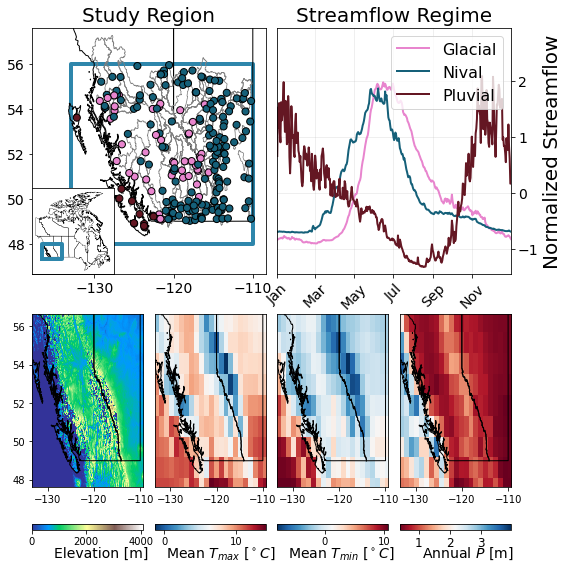

In [ ]:
#AGU POSTER

saveIt = 0

fs = 20 #fontsize

abc = ['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)']

nrows = 2
ncols = 4

fig = plt.figure(figsize = (8,8))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

##### top left side: spatial map of stations, coloured by cluster to which they belong

ax0 = fig.add_subplot(gs[:1,:2])

### INSET
rgb_bb = np.array([46, 134, 171]) / 255
canada_east = -108
canada_west = -142
canada_north = 60
canada_south = 46
ax_inset = plt.axes([0,0,1,1], aspect = 'auto')
ip = InsetPosition(ax0, [0.,0.,0.35,0.35])
ax_inset.set_axes_locator(ip)
plot_prov_ax(prov = 'all', ax = ax_inset, linewidth = 0.3)

#bounding box
x = [-133,-133,-110,-110,-133]
y = [48,56,56,48,48]
ax_inset.plot(x,y, color = rgb_bb, linewidth = 4)
ax0.plot(x,y, color = rgb_bb, linewidth = 4)
ax_inset.tick_params(bottom = False, left = False, labelbottom = False, labelleft = False)
###

plot_prov_ax(prov=prov, ax = ax0)
ax0.scatter(stationLon[stationInds], stationLat[stationInds], c = cStations_regimes, s = 50, linewidth = 1, edgeColor = 'k', zOrder = 3)
ax0.tick_params(labelsize = fs-6)
ax0.set_title('Study Region', fontsize = fs)
ax0.set_xlim((extentERA[0]-4.5, extentERA[1]+1))
ax0.set_ylim((extentERA[2]-1, extentERA[3]+1))
# ax0.text(x = -0.1, y = 1.03, s = abc[0], transform = ax0.transAxes, fontsize = fs)

for basin in stationBasins:
  if basin is not None:
    x,y = basin.exterior.xy
    ax0.plot(x, y, color = 'gray', linewidth = 0.75)

##### top right side: subplots of seasonal streamflow of each cluster 

subplot_rows = [0,1,2]
subplot_cols = [3,3,3]

cluster_order = [0,1,2]
ax = fig.add_subplot(gs[:1,2:])
# ax.text(x = -0.15, y = 1.05, s = abc[1], transform = ax.transAxes, fontsize = fs)
for kk, cluster in enumerate(cluster_order):

  ax.set_xticks(first_days_of_month[::2])
  ax.set_xlim((0,364))
  ax.set_ylim(bottom = np.min(cluster_patterns)-0.1, top = np.max(cluster_patterns)+0.1)
  ax.set_xticklabels(months_str[::2], rotation = 45)

  if kk < 2:
    ax.set_xticklabels([])

  ax.tick_params(labelleft = False, labelright = True, left = False, right = True)

  if kk == 1:
    ax.set_ylabel('Normalized Streamflow', fontsize = fs)
    ax.yaxis.set_label_position("right")

  cluster_inds = np.squeeze(np.argwhere(regime_classes == cluster))

  var = np.mean(cluster_input[cluster_inds,:365], axis = 0)
  std = np.std(cluster_input[cluster_inds,:365], axis = 0)

  # ax.fill_between(x = range(365), y1 = var + std, y2 = var - std, alpha = 0.2, color = rgb_regimes[cluster,:])
  ax.plot(var, color = rgb_regimes[cluster], linewidth = 2, label = regime_class_names[cluster])

ax.tick_params(labelsize = fs-6)
ax.set_title('Streamflow Regime', fontsize = fs)
ax.grid(True, alpha = 0.25)
ax.legend(fontsize = fs - 4)

##### bottom: elevation and climate subplots

ax_DEM = fig.add_subplot(gs[-1,0])
ax_Tmax = fig.add_subplot(gs[-1,1])
ax_Tmin = fig.add_subplot(gs[-1,2])
ax_P = fig.add_subplot(gs[-1,3])

#DEM subplot
extentDEM = np.array([minlon, maxlon, minlat, maxlat])
im_DEM = ax_DEM.imshow(dem, vmin = 0, aspect = 'auto', cmap = 'terrain', extent = extentDEM)
ax_DEM.tick_params(right = False, left = True, labelright = False, labelleft = True)
cb = plt.colorbar(im_DEM, ax = ax_DEM, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Elevation [m]', transform = cb.ax.transAxes, fontsize = fs - 6)
# ax_DEM.text(x = -0.15, y = 0.95, s = abc[2], transform = ax_DEM.transAxes, fontsize = fs)

#max temp subplot
im_Tmax = ax_Tmax.imshow(Tmax_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentDEM)
ax_Tmax.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmax, ax = ax_Tmax, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{max}$ [$^\circ C$]', transform = cb.ax.transAxes, fontsize = fs - 6)
# ax_Tmax.text(x = -0.15, y = 0.95, s = abc[3], transform = ax_Tmax.transAxes, fontsize = fs)

#min temp subplot
im_Tmin = ax_Tmin.imshow(Tmin_mean - 273, aspect = 'auto', cmap = 'RdBu_r', extent = extentDEM)
ax_Tmin.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_Tmin, ax = ax_Tmin, orientation = 'horizontal')
cb.ax.text(x = 0.1, y = -5, s = 'Mean $T_{min}$ [$^\circ C$]', transform = cb.ax.transAxes, fontsize = fs - 6)
# ax_Tmin.text(x = -0.15, y = 0.95, s = abc[4], transform = ax_Tmin.transAxes, fontsize = fs)

#mean annual precip subplot
im_P = ax_P.imshow(Ptotal*6, aspect = 'auto', cmap = 'RdBu', extent = extentDEM)
ax_P.tick_params(right = False, left = False, labelright = False, labelleft = False)
cb = plt.colorbar(im_P, ax = ax_P, orientation = 'horizontal')
cb.ax.text(x = 0.2, y = -5, s = 'Annual $P$ [m]', transform = cb.ax.transAxes, fontsize = fs - 6)
cb.ax.tick_params(labelsize = fs - 8)
# ax_P.text(x = -0.15, y = 0.95, s = abc[5], transform = ax_P.transAxes, fontsize = fs)

#add provincial borders
plot_prov_ax(prov=prov, ax = ax_DEM)
plot_prov_ax(prov=prov, ax = ax_Tmax)
plot_prov_ax(prov=prov, ax = ax_Tmin)
plot_prov_ax(prov=prov, ax = ax_P)

#set extent
ax_DEM.set_xlim(left = extentERA[0], right = extentERA[1])
ax_DEM.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmax.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmax.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_Tmin.set_xlim(left = extentERA[0], right = extentERA[1])
ax_Tmin.set_ylim(bottom = extentERA[2], top = extentERA[3])
ax_P.set_xlim(left = extentERA[0], right = extentERA[1])
ax_P.set_ylim(bottom = extentERA[2], top = extentERA[3])

plt.tight_layout()#h_pad = -0.5)

# #edit ticklabels
# axes = [ax0, ax_DEM, ax_Tmax, ax_Tmin, ax_P]
# for ax in axes:
#   xtls = [str(int(item.get_text()[1:])) + '$^\circ$ W' for item in ax.get_xticklabels()]
#   ax.set_xticklabels(xtls)
#   ytls = [item.get_text() + '$^\circ$ N' for item in ax.get_yticklabels()]
#   ax.set_yticklabels(ytls)

plt.tight_layout(w_pad = -1.25, h_pad = 0.25)

if saveIt:
  plt.savefig('cluster_patterns_climate_AGU.png', bbox_inches = 'tight', dpi = 600)

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


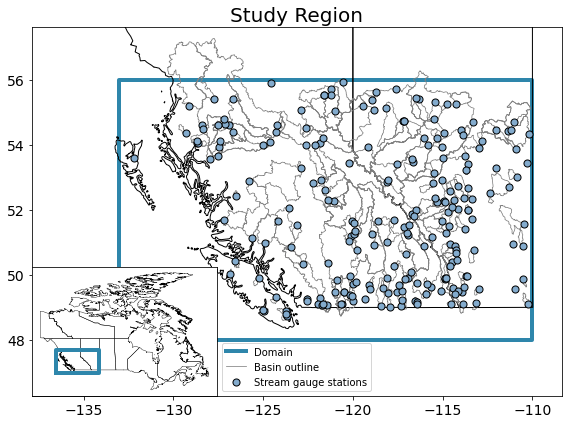

In [ ]:
#AGU ELIGHTNING POSTER

saveIt = 0

rgb_stations = np.array([132, 172, 206])/256

fs = 20 #fontsize

nrows = 1
ncols = 1

fig = plt.figure(figsize = (8,6))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

##### top left side: spatial map of stations, coloured by cluster to which they belong

ax0 = fig.add_subplot(gs[:1,:1])

### INSET
rgb_bb = np.array([46, 134, 171]) / 255
canada_east = -108
canada_west = -142
canada_north = 60
canada_south = 46
ax_inset = plt.axes([0,0,1,1], aspect = 'auto')
ip = InsetPosition(ax0, [0.,0.,0.35,0.35])
ax_inset.set_axes_locator(ip)
plot_prov_ax(prov = 'all', ax = ax_inset, linewidth = 0.4)

#bounding box
x = [-133,-133,-110,-110,-133]
y = [48,56,56,48,48]
ax_inset.plot(x,y, color = rgb_bb, linewidth = 4)
ax0.plot(x,y, color = rgb_bb, linewidth = 4, label = 'Domain')
ax_inset.tick_params(bottom = False, left = False, labelbottom = False, labelleft = False)
###

plot_prov_ax(prov=prov, ax = ax0)
ax0.scatter(stationLon[stationInds], stationLat[stationInds], s = 50, linewidth = 1, edgeColor = 'k', zOrder = 3, facecolor = rgb_stations, label = 'Stream gauge stations')#, c = cStations_regimes)
ax0.tick_params(labelsize = fs-6)
ax0.set_title('Study Region', fontsize = fs)
ax0.set_xlim((extentERA[0]-4.5, extentERA[1]+1))
ax0.set_ylim((extentERA[2]-1.35, extentERA[3]+1))
# ax0.text(x = -0.1, y = 1.03, s = abc[0], transform = ax0.transAxes, fontsize = fs)

for ind_basin, basin in enumerate(stationBasins):
  if basin is not None:
    x,y = basin.exterior.xy
    if ind_basin == 1:
      ax0.plot(x, y, color = 'gray', linewidth = 0.75, label = 'Basin outline')
    else:
      ax0.plot(x, y, color = 'gray', linewidth = 0.75)

ax0.legend(loc = 'lower center')

plt.tight_layout()

if saveIt:
  plt.savefig('study_region_AGU_elightning.png', bbox_inches = 'tight', dpi = 600)

plt.show()

# REMOVED: Test: Same input everywhere

In [ ]:
#load all models for easier use later on
Nruns = 10
models = [[None for cluster in range(n_clusters_seasonal)] for run in range(Nruns)] 
for run in range(Nruns):
  for cluster in range(n_clusters_seasonal):
    filename_model = 'model_fine_' + str(run) + '_cluster_' + str(cluster) + '.h5'
    models[run][cluster] = tf.keras.models.load_model(dir_models + '/' + filename_model)

In [ ]:
x_test = np.array(x_test)
np.shape(x_test)

(1826, 365, 12, 32, 3)

In [ ]:
row_ind = 6
col_ind = 27

Nlat = 12#np.shape(Tmax)[1]
Nlon = 32#np.shape(Tmax)[2]

x_test_same_everywhere = np.zeros(np.shape(x_test), dtype = np.float16)
test_pixel = x_test[:,:,row_ind,col_ind,:]

for row in range(Nlat):
  for col in range(Nlon):
    x_test_same_everywhere[:,:,row,col,:] = test_pixel



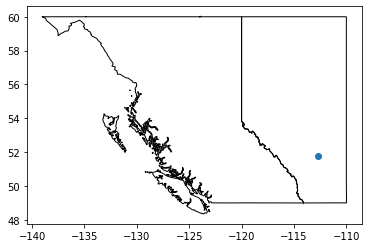

In [ ]:
fig,ax = plt.subplots()
plot_prov_ax(prov,ax)
ax.scatter(eraLon[col_ind],eraLat[row_ind])

In [ ]:
x_test_same_everywhere = tf.convert_to_tensor(x_test_same_everywhere)

In [ ]:
Nstations = len(stationInds)
y_same_runs = np.zeros((Ntest,Nstations,Nruns))

for kk, model in enumerate(models):

  for cluster in range(n_clusters_seasonal):

    inds = np.argwhere(seasonal_clustering.labels_ == cluster).squeeze()
    y_same_runs[:,inds,kk] = model[cluster].predict(x_test_same_everywhere)

y_same = np.mean(y_same_runs, axis = -1)

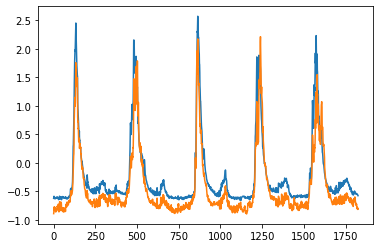

In [ ]:
plt.plot(y_same[:,0])
plt.plot(y_same[:,76])

In [ ]:
y_same_clusters = np.zeros((Ntest,n_clusters_seasonal))

for cluster in range(n_clusters_seasonal):

  inds = np.argwhere(seasonal_clustering.labels_ == cluster).squeeze()
  y_same_clusters[:,cluster] = np.mean(y_same[:,inds], axis = -1)

y = np.zeros((365,6))
for cluster in range(n_clusters_seasonal):
  a = np.mean(np.reshape(y_same_clusters[:-1,cluster],(5,-1)), axis = 0)
  y[:,cluster] = a

In [ ]:
a = np.mean(np.reshape(y_same_clusters[:-1,1],(5,-1)), axis = 0)
np.shape(a)

(365,)

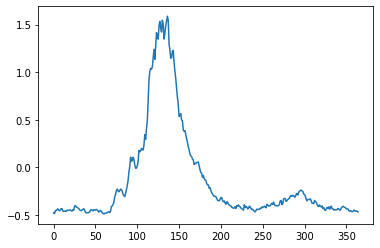

In [ ]:
plt.plot(a)

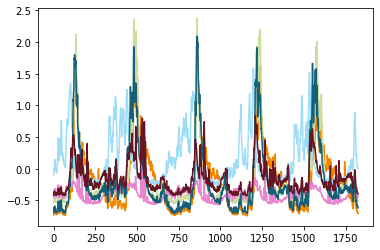

In [ ]:
for cluster in range(n_clusters_seasonal):
  plt.plot(y_same_clusters[:,cluster], color = rgbs_array[cluster,:])

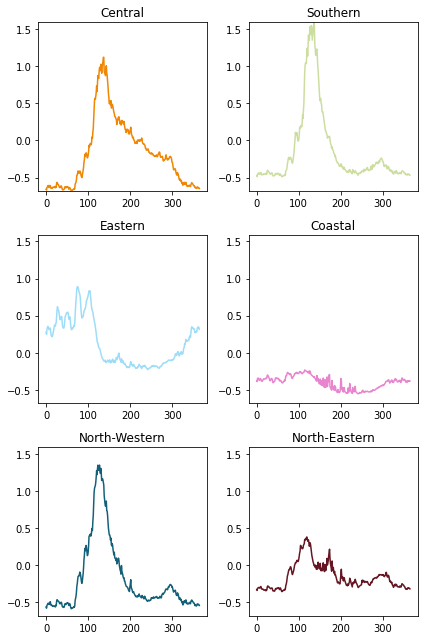

In [ ]:
fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (6,9))

for cluster, ax in enumerate(axes.flatten()):
  ax.plot(y[:,cluster], color = rgbas_array[cluster,:])
  ax.set_title(cluster_names[cluster])

  ax.set_ylim(bottom = np.min(y), top = np.max(y))

plt.tight_layout()

# Extra: from heat maps through time

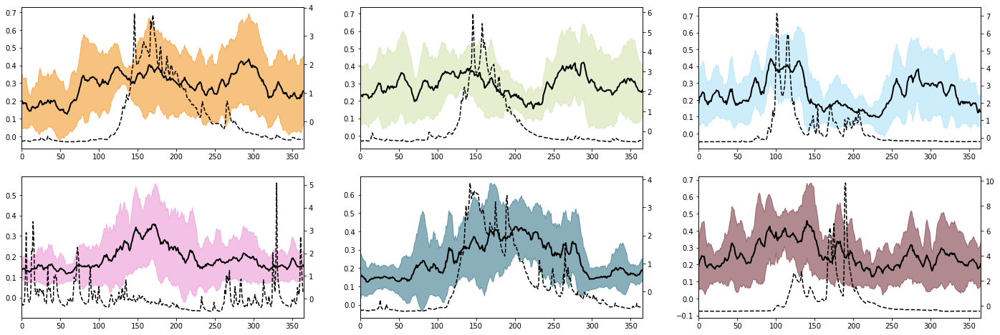

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = A_daily_cluster_mean[:,cluster] + 2*A_daily_cluster_std[:,cluster]
  y2 = A_daily_cluster_mean[:,cluster] - 2*A_daily_cluster_std[:,cluster]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(A_daily_cluster_mean[:,cluster], 'k', linewidth = 2)
  ax.set_xlim(right = 365, left = 0)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

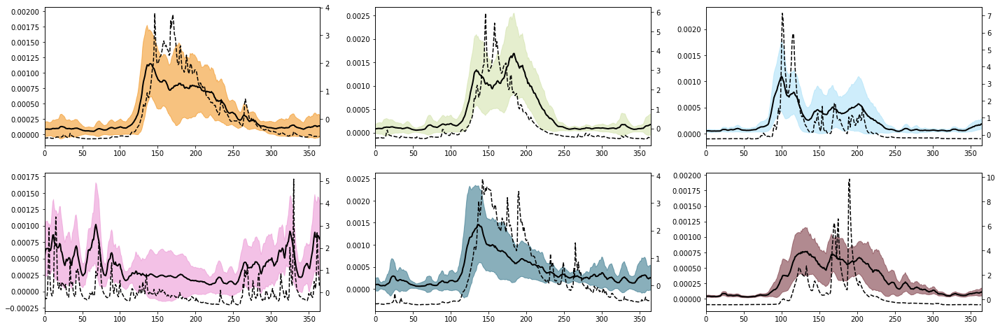

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = S_daily_cluster_mean[:,cluster] + 2*S_daily_cluster_std[:,cluster]
  y2 = S_daily_cluster_mean[:,cluster] - 2*S_daily_cluster_std[:,cluster]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(S_daily_cluster_mean[:,cluster], 'k', linewidth = 2)
  ax.set_xlim(right = 365, left = 0)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

In [ ]:
saveIt = 0

cluster_seasonal = 4

fig, ax = plt.subplots(figsize = (6,4))

inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

ymax = np.max(flow_clusters[cluster_seasonal,:])
ymin = np.min(flow_clusters[cluster_seasonal,:])
xmin = 0
xmax = Ndays-2*wedge
extent = [xmin, xmax, ymin, ymax]
ax.imshow(np.expand_dims(labels, axis=0), extent = extent, aspect = 'auto', alpha = 0.4, cmap = 'Blues_r')
ax.plot(flow_clusters[cluster_seasonal,:], color = 'k')
# ax.plot(flow_cluster_predict, 'k--')
ax.set_xlim(left = 0, right = 365)
ax.set_ylim(bottom = ymin, top = ymax)
ax.set_xlabel('Day of Year', fontsize = fs-4)
ax.set_ylabel('Normalized Streamflow', fontsize = fs-4)
ax.set_title('Flow in North-east region', fontsize = fs)
ax.tick_params(labelsize = fs-4)

if saveIt: 
  plt.savefig('sensitivity_flow_time.png', bbox_inches = 'tight', dpi = 300)

In [ ]:
#calculate for fine-tuned ensemble mean heat map
data = heat_mean_active
data_mean = data.mean(axis=0)
data_std = data.std(axis=0)
data_norm = np.asarray([(data[:,kk] - data_mean[kk]) / data_std[kk] for kk in range(len(stationInds))]).T

In [ ]:
#initialize
heat_in_clusters_active = [None] * n_clusters_seasonal
heat_out_clusters_active = [None] * n_clusters_seasonal
heat_in_clusters_dormant = [None] * n_clusters_seasonal
heat_out_clusters_dormant = [None] * n_clusters_seasonal
inside_all_stations = [None] * len(stationInds)
outside_all_stations = [None] * len(stationInds)
radius = 1.

x = eraLon #rename for readability when making xx and xxv
y = eraLat
xx,yy = np.meshgrid(x,y)
xxv = xx.reshape(-1) #vector (array) where paired elements in xxv and yyv correspond to one pixel in heat map sensitivity space
yyv = yy.reshape(-1)

points = list(zip(xx.flatten(),yy.flatten())) #will loop through each point to see if sensitivity there is in/near or out/far from basins

#loop through each station and determine in/out points/sensitivity
for station in range(len(stationInds)):

  basin = stationBasins[station]
    
  #determine basin outlines  
  if basin is not None: #if basin polygon(s) exist -- some small basins do not have polygons from this source (see elif)
    
    xb,yb = basin.exterior.xy #lon/lat (x/y) points of watershed/basin boundary

  elif basin is None: #if basin shapefile is missing, use stream gauge location w/ radius buffer to estimate in/near pixels (these are small basins)

    xb = stationLon[stationInds][station] #basin outline taken to be single point at stream gauge
    yb = stationLat[stationInds][station]
    
  #create binary in/near (True) vs out/far (False)
  inside = np.zeros(np.size(Tmax[0])) #initialize inside/outside array
  for ii, point in enumerate(points): #for each point/pixel in ERA5 space
    d = np.sqrt((point[0] - xb)**2 + (point[1] - yb)**2) #distance from point in ERA5 to all points around basin
    if np.min(d) <= radius: #if the nearest basin edge to current point in ERA5 is less than prescribed allowable radius
      inside[ii] = True #then this point in ERA5 is considered 'inside' (or near) this basin

  inside_this_station = np.squeeze(np.argwhere(inside==True)) #array of indices which are inside this station's basin
  outside_this_station = np.squeeze(np.argwhere(inside==False)) #array of indices which are outside this station's basin

  inside_all_stations[station] = inside_this_station #list of arrays of indices which are inside/near each stations' basin
  outside_all_stations[station] = outside_this_station #list of arrays of indices which are outside/far each stations' basin

#find unique pixels in each clusters' set of basins; some basins in same cluster can share pixels, but here we want unique indices for visualization
unique_in_clusters = [None] * n_clusters_seasonal
unique_out_clusters = [None] * n_clusters_seasonal

for cluster in range(n_clusters_seasonal): #for each cluster

  unique_in_this_cluster = [] #initialize
  stations_this_cluster = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster

  for station in stations_this_cluster: #for each station
    for ind in inside_all_stations[station]: #for each index within/near this stations' basin
      unique_in_this_cluster.append(ind) #append the index
  unique_in_clusters[cluster] = list(set(unique_in_this_cluster)) #since some stations in the same cluster have the same index, take only unique indices

#find the sensitivity ('heat') of inside/near and outisde/far of all stations belonging to each cluster
for cluster in range(n_clusters_seasonal):

  binary_in = np.zeros(Npx)
  binary_in[unique_in_clusters[cluster]] = 1
  unique_out_clusters[cluster] = np.squeeze(np.argwhere(binary_in == 0))

  #initialize
  heat_in_this_cluster = []
  heat_out_this_cluster = []
  
  for ind in unique_in_clusters[cluster]:
    heat_in_this_cluster.append(heat_mean_active[cluster,ind])
  for ind in unique_out_clusters[cluster]:
    heat_out_this_cluster.append(heat_mean_active[cluster,ind])

  heat_in_clusters_active[cluster] = heat_in_this_cluster
  heat_out_clusters_active[cluster] = heat_out_this_cluster

  #initialize
  heat_in_this_cluster = []
  heat_out_this_cluster = []
  
  for ind in unique_in_clusters[cluster]:
    heat_in_this_cluster.append(heat_mean_dormant[cluster,ind])
  for ind in unique_out_clusters[cluster]:
    heat_out_this_cluster.append(heat_mean_dormant[cluster,ind])

  heat_in_clusters_dormant[cluster] = heat_in_this_cluster
  heat_out_clusters_dormant[cluster] = heat_out_this_cluster

#now, calculate Kolmogorov-Smirnov D-Statistic as evaluated between inside/outside heat distributions for each cluster
ks_active = np.empty(n_clusters_seasonal)
ks_dormant = np.empty(n_clusters_seasonal)
p = np.empty(n_clusters_seasonal)
for cluster in range(n_clusters_seasonal):
  ks_active[cluster],p[cluster] = ks_2samp(heat_in_clusters_active[cluster], heat_out_clusters_active[cluster])
  ks_dormant[cluster],p[cluster] = ks_2samp(heat_in_clusters_dormant[cluster], heat_out_clusters_dormant[cluster])


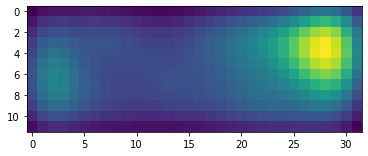

In [ ]:
plt.imshow(heat_mean_active[2].reshape(Nlat,Nlon))

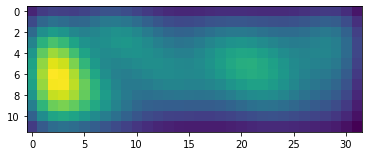

In [ ]:
plt.imshow(heat_mean_dormant[2].reshape(Nlat,Nlon))

In [ ]:
ks_active, ks_dormant

(array([0.75634   , 0.67654321, 0.78814741, 0.75032375, 0.30632651,
        0.63380952]),
 array([0.64738116, 0.28580247, 0.23484678, 0.72934473, 0.39930848,
        0.27952381]))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


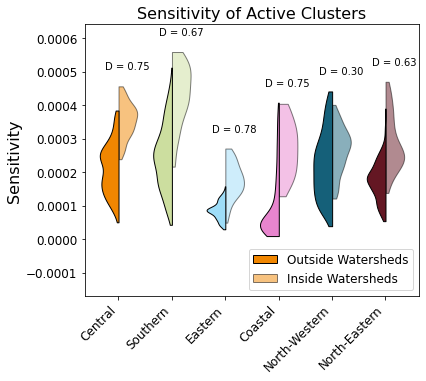

In [ ]:
#inside/outside sensitivity distributions w/ D -- fine ensemble
#help from: https://stackoverflow.com/questions/29776114/half-violin-plot

saveIt = 0

fs = 16

fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

parts_in = ax.violinplot(dataset = heat_in_clusters_active, showextrema = False, widths = 0.7, positions = range(6))
parts_out = ax.violinplot(dataset = heat_out_clusters_active, showextrema = False, widths = 0.7, positions = range(6))

for cluster in range(n_clusters_seasonal):

  part_in = parts_in['bodies'][cluster]
  part_out = parts_out['bodies'][cluster]

  part_out.set_facecolor(rgbas_array[cluster])
  part_out.set_edgecolor('k')
  part_out.set_alpha(1)

  part_in.set_facecolor(rgbas_array[cluster])
  part_in.set_edgecolor('k')
  part_in.set_alpha(0.5)

  m = np.mean(part_out.get_paths()[0].vertices[:, 0])
  part_out.get_paths()[0].vertices[:, 0] = np.clip(part_out.get_paths()[0].vertices[:, 0], -np.inf, m)

  m = np.mean(part_in.get_paths()[0].vertices[:, 0])
  part_in.get_paths()[0].vertices[:, 0] = np.clip(part_in.get_paths()[0].vertices[:, 0], m, np.inf)

  textx = cluster - 0.25
  texty = np.max([part_in.get_paths()[0].vertices[:, 1], part_out.get_paths()[0].vertices[:, 1]]) + 0.00005
  ax.text(x = textx, y = texty, s = 'D = ' + str(ks_active[cluster])[:4])

ax.set_ylabel('Sensitivity', fontsize = fs)
ax.set_title('Sensitivity of Active Clusters', fontsize = fs)
ax.set_xticklabels([''] + cluster_names, rotation = 45, ha = 'right')
ax.tick_params(labelsize = fs-4)

ymin = np.min(np.min(np.asarray(heat_out_clusters_active))) - 0.0002
ymax = np.max(np.max(np.asarray(heat_out_clusters_active))) + 0.0002

ax.set_ylim((ymin,ymax))
ax.legend([parts_out['bodies'][0], parts_in['bodies'][0]], ['Outside Watersheds', 'Inside Watersheds'], fontsize = fs-4, loc = 'lower right')

if saveIt:
  plt.savefig('heat_in_out_dist_active.png', bbox_inches = 'tight', dpi = 300)

plt.show()

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


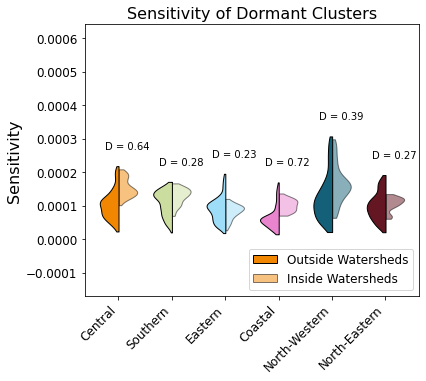

In [ ]:
#inside/outside sensitivity distributions w/ D -- fine ensemble
#help from: https://stackoverflow.com/questions/29776114/half-violin-plot

saveIt = 0

fs = 16

fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

parts_in = ax.violinplot(dataset = heat_in_clusters_dormant, showextrema = False, widths = 0.7, positions = range(6))
parts_out = ax.violinplot(dataset = heat_out_clusters_dormant, showextrema = False, widths = 0.7, positions = range(6))

for cluster in range(n_clusters_seasonal):

  part_in = parts_in['bodies'][cluster]
  part_out = parts_out['bodies'][cluster]

  part_out.set_facecolor(rgbas_array[cluster])
  part_out.set_edgecolor('k')
  part_out.set_alpha(1)

  part_in.set_facecolor(rgbas_array[cluster])
  part_in.set_edgecolor('k')
  part_in.set_alpha(0.5)

  m = np.mean(part_out.get_paths()[0].vertices[:, 0])
  part_out.get_paths()[0].vertices[:, 0] = np.clip(part_out.get_paths()[0].vertices[:, 0], -np.inf, m)

  m = np.mean(part_in.get_paths()[0].vertices[:, 0])
  part_in.get_paths()[0].vertices[:, 0] = np.clip(part_in.get_paths()[0].vertices[:, 0], m, np.inf)

  textx = cluster - 0.25
  texty = np.max([part_in.get_paths()[0].vertices[:, 1], part_out.get_paths()[0].vertices[:, 1]]) + 0.00005
  ax.text(x = textx, y = texty, s = 'D = ' + str(ks_dormant[cluster])[:4])

ax.set_ylabel('Sensitivity', fontsize = fs)
ax.set_title('Sensitivity of Dormant Clusters', fontsize = fs)
ax.set_xticklabels([''] + cluster_names, rotation = 45, ha = 'right')
ax.tick_params(labelsize = fs-4)

ymin = np.min(np.min(np.asarray(heat_out_clusters_active))) - 0.0002
ymax = np.max(np.max(np.asarray(heat_out_clusters_active))) + 0.0002

ax.set_ylim((ymin,ymax))
ax.legend([parts_out['bodies'][0], parts_in['bodies'][0]], ['Outside Watersheds', 'Inside Watersheds'], fontsize = fs-4, loc = 'lower right')

if saveIt:
  plt.savefig('heat_in_out_dist_dormant.png', bbox_inches = 'tight', dpi = 300)

plt.show()

In [ ]:
#want figure of boxplots for: active/dormant flow, sensitive area, max sensitivity

cluster_seasonal = 0



In [ ]:
cluster_seasonal = 0


x = np.hstack([['Flow' for kk in range(Ndays-2*wedge)], 
               ['Area' for kk in range(Ndays-2*wedge)], 
               ['Sensitivity' for kk in range(Ndays-2*wedge)]])

v1 = (flow_clusters[cluster_seasonal,:] - np.mean(flow_clusters[cluster_seasonal,:])) / np.std(flow_clusters[cluster_seasonal,:])
v2 = (A_daily_cluster_mean[:,cluster_seasonal] - np.mean(A_daily_cluster_mean[:,cluster_seasonal])) / np.std(A_daily_cluster_mean[:,cluster_seasonal])
v3 = (S_daily_cluster_mean[:,cluster_seasonal] - np.mean(S_daily_cluster_mean[:,cluster_seasonal])) / np.std(S_daily_cluster_mean[:,cluster_seasonal])

y = np.hstack([v1, v2, v3])
hue = np.tile(labels_binary[cluster_seasonal,:],3)

sns.boxplot(x,y,hue)

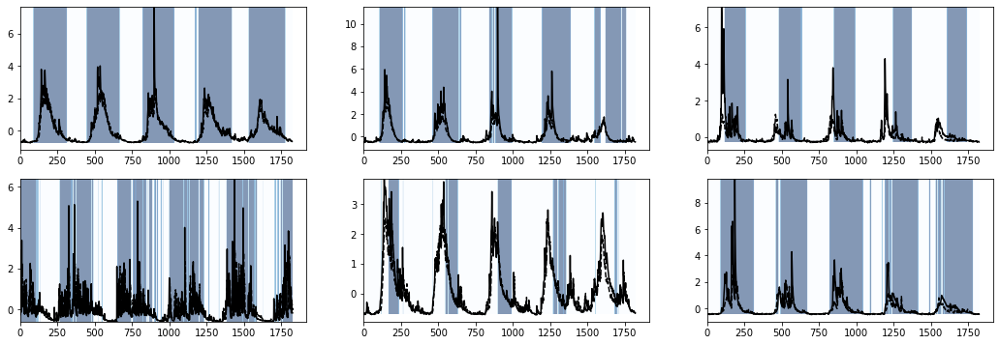

In [ ]:
nrows = 2
ncols = 3

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (6*ncols, 3*nrows))

for cluster_seasonal, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  flow_cluster_predict = np.mean(y_test_predict[:Ndays,inds], axis = -1)
  ymax = np.max(flow_clusters[cluster_seasonal,:])
  ymin = np.min(flow_clusters[cluster_seasonal,:])
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  ax.imshow(np.expand_dims(labels_binary[cluster_seasonal,:], axis=0), extent = extent, aspect = 'auto', alpha = 0.5, cmap = 'Blues')
  ax.plot(flow_clusters[cluster_seasonal,:], color = 'k')
  ax.plot(flow_cluster_predict, 'k--')

# Extra: from heat maps by channel

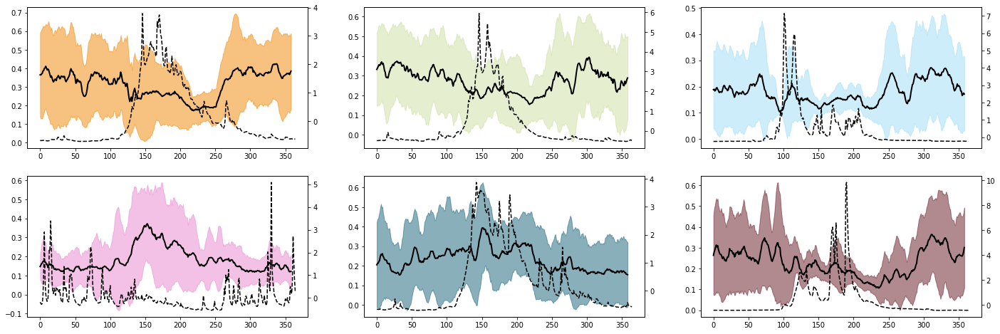

In [ ]:
channel = 1

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = A_daily_cluster_mean[:,cluster,channel] + 2*A_daily_cluster_std[:,cluster,channel]
  y2 = A_daily_cluster_mean[:,cluster,channel] - 2*A_daily_cluster_std[:,cluster,channel]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(A_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

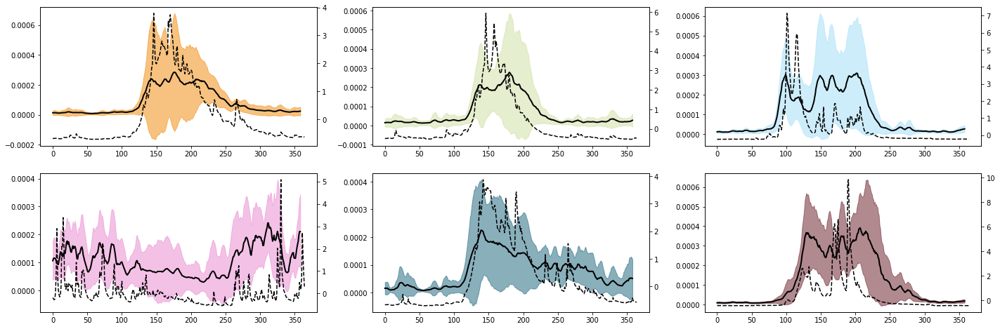

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = S_daily_cluster_mean[:,cluster,channel] + 2*S_daily_cluster_std[:,cluster,channel]
  y2 = S_daily_cluster_mean[:,cluster,channel] - 2*S_daily_cluster_std[:,cluster,channel]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(S_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

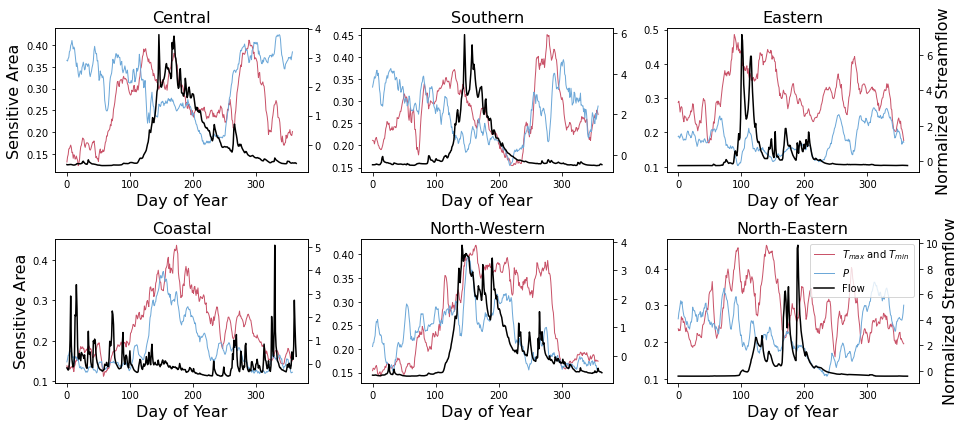

In [ ]:
#time series of sensitive area, all channels 

c_channels = np.array([[204, 0, 41],
                       [246, 162, 201],
                       [116, 92, 151]]) / 256

c_channels = np.array([[202, 83, 105],
                       [10, 157, 174]]) / 256

c_channels = np.array([[202, 83, 105],
                       [109, 169, 217]]) / 256

channel_names = ['$T_{max}$ and $T_{min}$', '$P$']

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4.5*ncols, 3*nrows))

for cluster, ax in enumerate(axes.flatten()):

  for channel in range(Nchannels):
    inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
    y1 = A_daily_cluster_mean[:,cluster,channel] + 2*A_daily_cluster_std[:,cluster,channel]
    y2 = A_daily_cluster_mean[:,cluster,channel] - 2*A_daily_cluster_std[:,cluster,channel]
    x = np.arange(len(y1))
    ax.plot(A_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 1, color = c_channels[channel,:], label = channel_names[channel])

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k', label = 'Flow')

  #axis labels etc
  ax.set_xlabel('Day of Year', fontsize = fs)
  if np.mod(cluster,3)==0:
    ax.set_ylabel('Sensitive Area', fontsize = fs)
  if np.mod(cluster+1,3)==0:  
    ax2.set_ylabel('Normalized Streamflow', fontsize = fs)
  ax.set_title(cluster_names[cluster], fontsize = fs)

#one legend with labels from both ax and ax2
h, l = ax.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
labels = l+l2
handles = h+h2
ax.legend(handles, labels)

plt.tight_layout()

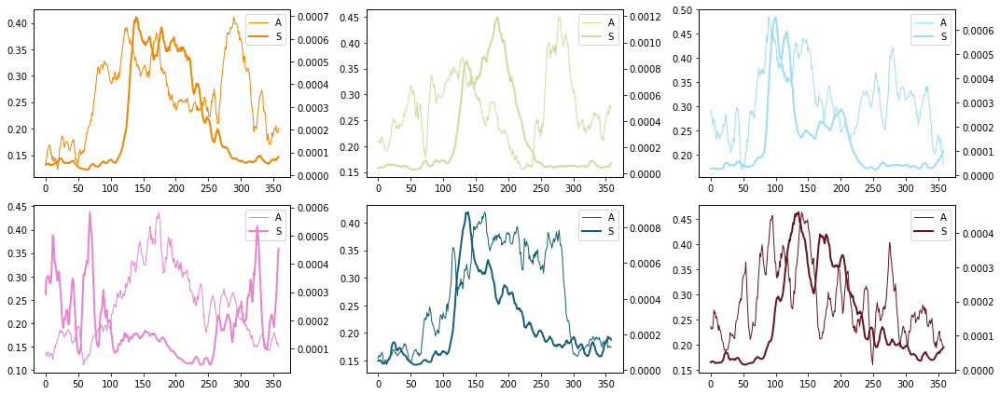

In [ ]:
channel = 0

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (5*ncols, 3*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(A_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 1, label = 'A')#, linestyle = '--')
  ax2 = ax.twinx()
  ax2.plot(S_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 2, label = 'S')

  #one legend with labels from both ax and ax2
  h, l = ax.get_legend_handles_labels()
  h2, l2 = ax2.get_legend_handles_labels()
  labels = l+l2
  handles = h+h2
  ax.legend(handles, labels)

plt.tight_layout()

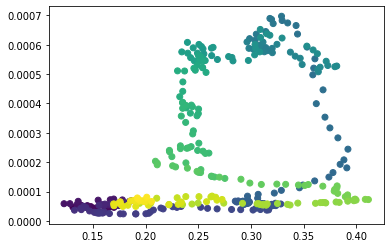

In [ ]:
cluster = 0
channel =  0

plt.scatter(A_daily_cluster_mean[:,cluster,channel], S_daily_cluster_mean[:,cluster,channel], c = range(Ndays-window+1))

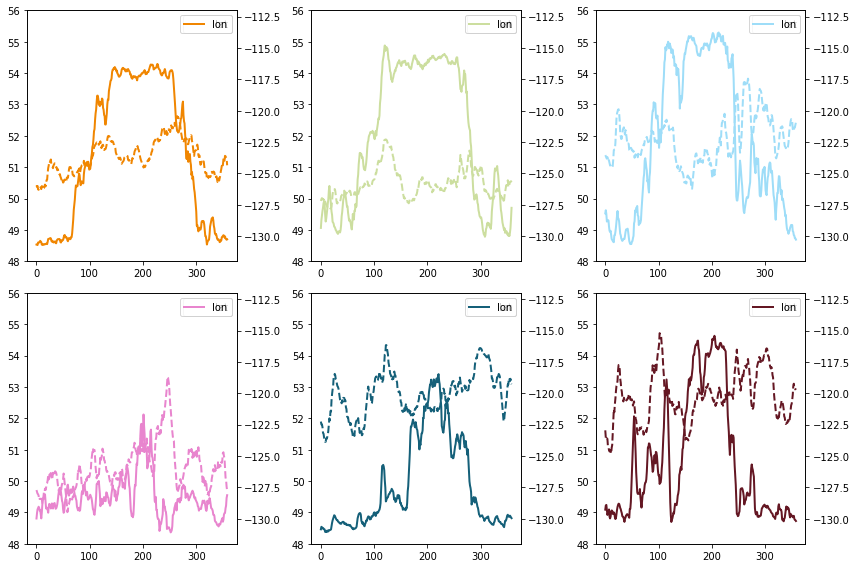

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(lat_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 2, label = 'lat', linestyle = '--')
  ax2 = ax.twinx()
  ax2.plot(lon_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 2, label = 'lon')
  ax.legend()
  ax2.legend()

  ax.set_ylim((48,56))
  ax2.set_ylim((-132, -112))

plt.tight_layout()

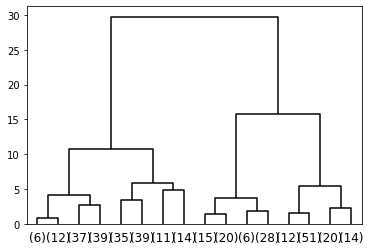

In [ ]:
cluster_seasonal = 2
channel = 1

cluster_input = np.vstack([lat_daily_cluster_mean[:,cluster_seasonal,channel], lon_daily_cluster_mean[:,cluster_seasonal,channel]]).T
cluster_input = (cluster_input - np.mean(cluster_input, axis = 0)) / np.std(cluster_input, axis = 0)

# setting distance_threshold=0 ensures we compute the full tree
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(cluster_input)

# plot the top levels of the dendrogram
d = plot_dendrogram(model, truncate_mode='level', p=3, color_threshold = 0, above_threshold_color = 'k')

In [ ]:
n_clusters = 2
model = AgglomerativeClustering(n_clusters = n_clusters).fit(cluster_input)
labels = model.labels_

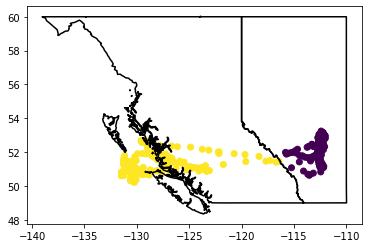

In [ ]:
fig, ax = plt.subplots()
plot_prov_ax(prov, ax)
ax.scatter(lon_daily_cluster_mean[:,cluster_seasonal,channel], lat_daily_cluster_mean[:,cluster_seasonal,channel], c = labels)

In [ ]:
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
heat_mean_channels_cluster = np.mean(heat_mean_channels[:,inds,channel], axis = 1).reshape(Ndays,Npx)

cluster_heat = np.zeros((n_clusters, Npx))
for cluster in range(n_clusters):
  days = np.squeeze(np.argwhere(labels==cluster))
  cluster_heat[cluster,:] = np.mean(heat_mean_channels_cluster[days,:], axis = 0)


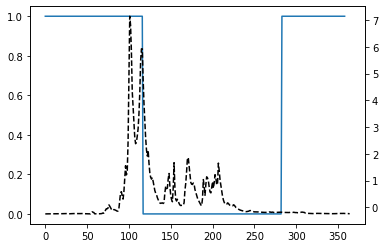

In [ ]:
fig, ax = plt.subplots()
ax.plot(labels)
flow = np.mean(np.array(y_test)[:Ndays,inds], axis = -1)
ax2 = ax.twinx()
ax2.plot(flow,'k--')

Text(0.5, 1.0, 'Active Cluster: 0')

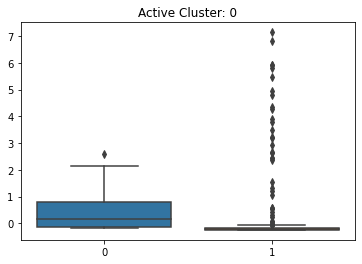

In [ ]:
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
flow = np.mean(np.array(y_test)[wedge:Ndays-wedge,inds], axis = -1)
flow_cluster_mean = np.zeros(n_clusters)
for cluster in range(n_clusters):
  inds = np.squeeze(np.argwhere(labels == cluster))
  flow_cluster_mean[cluster] = np.mean(flow[inds])
sns.boxplot(x = labels, y = flow)
plt.title('Active Cluster: ' + str(np.argmax(flow_cluster_mean)))

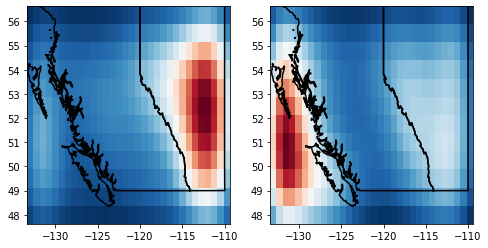

In [ ]:
nrows = 1
ncols = n_clusters

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  vmax = np.max(cluster_heat[cluster])
  vmin = np.min(cluster_heat[cluster])
  # vmax = np.max(cluster_heat)
  # vmin = np.min(cluster_heat)
  ax.imshow(cluster_heat[cluster,:].reshape(Nlat,Nlon), aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax, cmap = 'RdBu_r')
  ax.set_xlim(left = extentERA[0], right = extentERA[1])
  ax.set_ylim(bottom = extentERA[2], top = extentERA[3])
  plot_prov_ax(prov, ax)

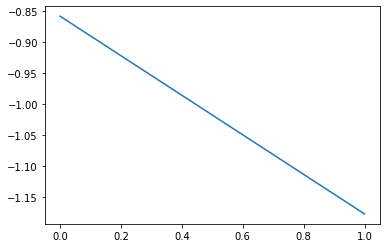

In [ ]:
plt.plot(cluster_input[0,:])

In [ ]:
#loop through all seasonal clusters, then cluster heat maps, then characterize active 

channel_set = 0

n_clusters_heat_all = [2,2,2,3,3,2]
n_clusters_heat_all = [2,2,2,2,2,2]
# n_clusters_heat_all = [3,3,3,3,3,3]

heat_all = np.zeros((n_clusters_seasonal, np.max(n_clusters_heat_all), Npx))
labels_all = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
heat_mean_active = np.zeros((n_clusters_seasonal, Npx))
heat_mean_dormant = np.zeros((n_clusters_seasonal, Npx))
labels_binary = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
flow_clusters = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))

for cluster_seasonal, n_clusters_heat in enumerate(n_clusters_heat_all):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

  # #cluster input: latitude/longitude of sensitivity maximum
  # var = lat_daily_cluster_mean[:, cluster_seasonal, channel_set]
  # latnorm = (var - np.mean(var)) / np.std(var)
  # var = lon_daily_cluster_mean[:, cluster_seasonal, channel_set]
  # lonnorm = (var - np.mean(var)) / np.std(var)
  # cluster_input = np.vstack([latnorm, lonnorm]).T

  #input: normalized heat maps
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(-1,Npx)
  var = np.double(heat_mean_fine_cluster)
  heat_mean_fine_cluster_norm = (heat_mean_fine_cluster - np.expand_dims(np.mean(var, axis = -1), axis = -1)) / np.expand_dims(np.std(var, axis = -1), axis = -1)
  cluster_input = heat_mean_fine_cluster_norm

  #cluster by heat maximum location
  model = AgglomerativeClustering(n_clusters = n_clusters_heat).fit(cluster_input)
  labels = model.labels_
  labels_all[cluster_seasonal] = np.copy(labels)

  #calculate mean flow of each location cluster
  flow = np.mean(np.array(y_test)[wedge:Ndays-wedge,inds], axis = -1)
  flow_cluster_mean = np.zeros(n_clusters_heat)
  for cluster_heat in range(n_clusters_heat):
    inds_labels = np.squeeze(np.argwhere(labels == cluster_heat))
    flow_cluster_mean[cluster_heat] = np.mean(flow[inds_labels])
  ind_heat_active = np.argmax(flow_cluster_mean) #index of the heat map / location cluster with the highest average flow
  ind_heat_dormant = np.squeeze(np.argwhere(np.arange(n_clusters_heat) != ind_heat_active))

  #sort labels from low to high flow
  sorted = np.argsort(flow_cluster_mean)
  labels_sorted = np.zeros(np.shape(labels))
  for kk in range(n_clusters_heat):
    labels_sorted[labels==sorted[kk]] = kk 
  labels_all[cluster_seasonal,:] = labels_sorted
  labels = labels_sorted

  #calculate average heat map of each location cluster
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays,Npx)
  cluster_heat = np.zeros((n_clusters_heat, Npx))
  for cluster in range(n_clusters_heat):
    days = np.squeeze(np.argwhere(labels==cluster))
    cluster_heat[cluster,:] = np.mean(heat_mean_fine_cluster[days,:], axis = 0)
    heat_all[cluster_seasonal, cluster,:] = np.copy(cluster_heat[cluster,:])

  heat_mean_active[cluster_seasonal,:] = cluster_heat[ind_heat_active,:]
  if np.size(ind_heat_dormant)>1:
    heat_mean_dormant[cluster_seasonal,:] = np.mean(cluster_heat[ind_heat_dormant,:], axis = 0)
  else:
    heat_mean_dormant[cluster_seasonal,:] = cluster_heat[ind_heat_dormant,:]

  labels_binary[cluster_seasonal, labels == ind_heat_active] = 1 #1: active, 0: dormant
  flow_clusters[cluster_seasonal, :] = flow

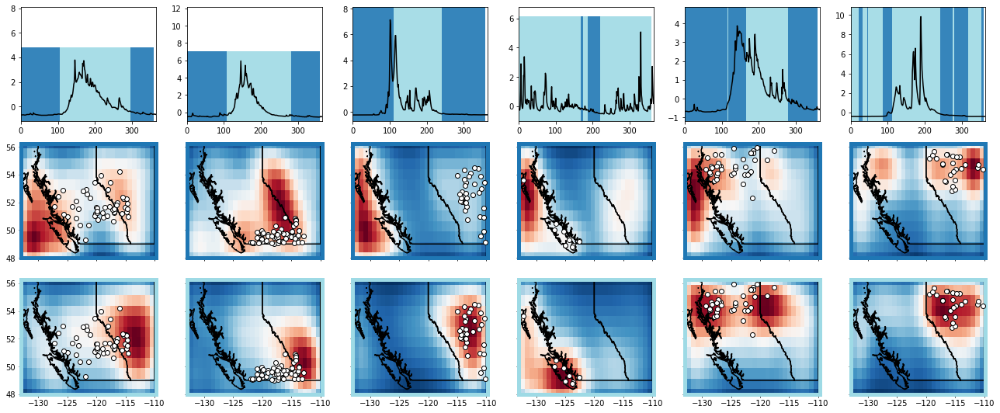

In [ ]:
#figure: row 1: cluster labels through time + flow, other rows: heat clusters; columns are streamflow clusters 

n_clusters_heat_all  

nrows = np.max(n_clusters_heat_all)+1
ncols = n_clusters_seasonal

year = 0

#make discrete colourmap for label imshow
# cmap = colors.ListedColormap(['white', 'red'])
cmap = cm.get_cmap('tab20')
bounds = np.arange(-0.5, np.max(n_clusters_heat_all))
norm = colors.BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster_seasonal in range(n_clusters_seasonal):

  #label
  # ax_label = axes[0,cluster_seasonal].twinx()
  ymax = np.max(flow_clusters[cluster_seasonal,:])+1.0
  ymin = np.min(flow_clusters[cluster_seasonal,:])-0.5
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  axes[0,cluster_seasonal].imshow(np.expand_dims(labels_all[cluster_seasonal,:], axis=0), extent = extent, 
                  aspect = 'auto', alpha = .9, cmap = cmap, norm = norm, zorder = -1)
  axes[0,cluster_seasonal].tick_params(labelright = False, right = False)

  #flow
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  axes[0,cluster_seasonal].plot(np.mean(np.array(y_test)[:,inds], axis = -1), 'k', zorder = 2)
  axes[0,cluster_seasonal].set_xlim(left = year*365, right = (year+1)*365)

  for cluster_heat in range(n_clusters_heat_all[cluster_seasonal]):

    axes[cluster_heat+1,cluster_seasonal].imshow(heat_all[cluster_seasonal, cluster_heat,:].reshape(Nlat,Nlon), cmap = 'RdBu_r', aspect = 'auto', extent = extentERA)
    plot_prov_ax(prov, axes[cluster_heat+1,cluster_seasonal])
    axes[cluster_heat+1,cluster_seasonal].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)
    axes[cluster_heat+1,cluster_seasonal].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[cluster_heat+1,cluster_seasonal].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))
    plt.setp(axes[cluster_heat+1,cluster_seasonal].spines.values(), color = cmap(norm(cluster_heat)), linewidth = 5)

    if cluster_heat < n_clusters_heat_all[cluster_seasonal]-1:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelbottom = False)
  
    if cluster_seasonal > 0:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelleft = False)

plt.tight_layout()

# Heat map through time: Track weather

In [ ]:
def segments_fit(X, Y, count):

  # this function from: https://gist.github.com/ruoyu0088/70effade57483355bbd18b31dc370f2a

  xmin = X.min()
  xmax = X.max()

  seg = np.full(count - 1, (xmax - xmin) / count)

  px_init = np.r_[np.r_[xmin, seg].cumsum(), xmax] #initial node guesses -- evenly spaced along x-axis
  py_init = np.array([Y[np.abs(X - x) < (xmax - xmin) * 0.01].mean() for x in px_init]) #inital node guesses -- mean Y of the segments

  def func(p):
      #returns pair of x-y nodes at divisions between linear functions
      seg = p[:count - 1]
      py = p[count - 1:]
      px = np.r_[np.r_[xmin, seg].cumsum(), xmax]
      return px, py

  def err(p):
      #MSE between actual Y and modelled Y based on current node divisions
      px, py = func(p)
      Y2 = np.interp(X, px, py)
      return np.mean((Y - Y2)**2)

  #now, minimize the error by fitting the best nodes in the piecewise functions
  r = optimize.minimize(err, x0=np.r_[seg, py_init], method='Nelder-Mead')

  return func(r.x)

In [ ]:
#goal: when the model transitions from looking along the coast to looking at the prairies -- what is it tracking?  
#What is the weather in the sensitive area

#piecewise fit help from: https://gist.github.com/ruoyu0088/70effade57483355bbd18b31dc370f2a
#stackoverflow: https://stackoverflow.com/questions/29382903/how-to-apply-piecewise-linear-fit-in-python

cluster = 1
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
heat_mean_fine_cluster = np.double(np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays, Npx))
flow = np.mean(np.array(y_test)[:,inds],axis = -1)

d = np.sqrt(lat_daily_cluster_mean[:,cluster]**2 + lon_daily_cluster_mean[:,cluster]**2)

X = np.arange(Ntest-2*wedge)
Y = d#[:365]
Y = lon_daily_cluster_mean[:,cluster]#[:365,cluster]
count = 21
px, py = segments_fit(X, Y, count)

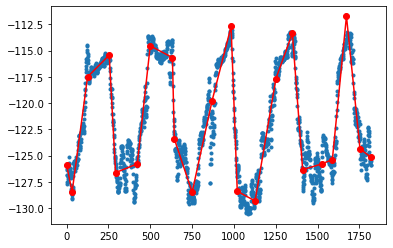

In [ ]:
plt.plot(X, Y, ".")
plt.plot(px, py, "-or")

In [ ]:
#now, calculate temperature and precip within sensitive area during the transition days

Nyears_test = 5

days_transition = np.arange(int(px[1]), int(px[2]))
days_transition = np.concatenate([np.arange(int(px[4*kk+1]), int(px[4*kk+2])) for kk in range(Nyears_test)])
# days_transition = np.concatenate([np.arange(int(px[4*kk+3]), int(px[4*kk+4])) for kk in range(Nyears_test)])
Ntransition = len(days_transition)
heat_transition = heat_mean_fine_cluster[days_transition,:]

Tmax_test = Tmax[-Ntest:]
Tmin_test = Tmin[-Ntest:]
P_test = P[-Ntest:]

Tmax_transition = np.zeros(Ntransition)
Tmin_transition = np.zeros(Ntransition)
P_transition = np.zeros(Ntransition)

for kk, day in enumerate(days_transition):
  hh = (np.max(heat_transition[kk]) - np.min(heat_transition[kk])) * 0.75
  Tmax_transition[kk] = np.mean(Tmax_test[day].flatten()[heat_transition[kk,:] > hh])
  Tmin_transition[kk] = np.mean(Tmin_test[day].flatten()[heat_transition[kk,:] > hh])
  P_transition[kk] = np.mean(P_test[day].flatten()[heat_transition[kk,:] > hh])

window = 15
Tmax_transition_smooth = pd.Series(Tmax_transition).rolling(window = window, min_periods = 1).mean()
Tmin_transition_smooth = pd.Series(Tmin_transition).rolling(window = window, min_periods = 1).mean()

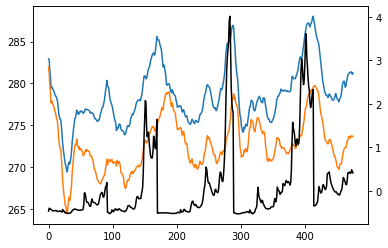

In [ ]:
fig, ax = plt.subplots()
ax.plot(Tmax_transition_smooth)
ax.plot(Tmin_transition_smooth)
# ax.set_xlim(left = 0, right = 180)

# ax2 = ax.twinx()
# ax2.plot(lon_daily_cluster_mean[days_transition,cluster],'k--')

ax3 = ax.twinx()
ax3.plot(flow[days_transition], 'k')

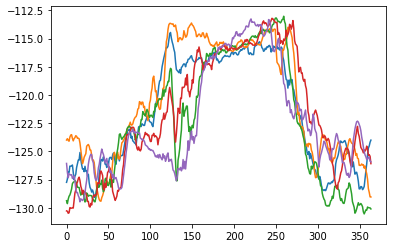

In [ ]:
cluster = 1
plt.plot(lon_daily_cluster_mean[:,cluster].reshape(5,-1).T)
plt.show()

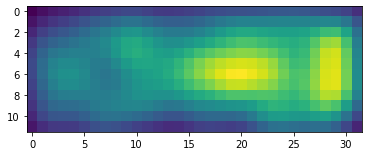

In [ ]:
plt.imshow(heat_transition[40,:].reshape(Nlat,Nlon))

In [ ]:
#now, calculate temperature and precip within sensitive area during all days

cluster = 0
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
heat_mean_fine_cluster = np.double(np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays, Npx))
flow = np.mean(np.array(y_test)[:,inds],axis = -1)

d = np.sqrt(lat_daily_cluster_mean[:,cluster]**2 + lon_daily_cluster_mean[:,cluster]**2)

# X = np.arange(365)
# Y = d[:365]
# Y = lon_daily_cluster_mean[:365,cluster]
N = Ntest - 2*wedge
X = np.arange(N)
Y = d
Y = lon_daily_cluster_mean[:,cluster]
count = 21
px, py = segments_fit(X, Y, count)
px = np.array([int(x) for x in px])

Tmax_test = Tmax[-Ntest:]
Tmin_test = Tmin[-Ntest:]
P_test = P[-Ntest:]

Tmax_sensitive = np.zeros(Ndays)
Tmin_sensitive = np.zeros(Ndays)
P_sensitive = np.zeros(Ndays)

for day in range(Ntest):
  hh = (np.max(heat_mean_fine_cluster[day]) - np.min(heat_mean_fine_cluster[day])) * 0.75
  Tmax_sensitive[day] = np.mean(Tmax_test[day].flatten()[heat_mean_fine_cluster[day,:] > hh])
  Tmin_sensitive[day] = np.mean(Tmin_test[day].flatten()[heat_mean_fine_cluster[day,:] > hh])
  P_sensitive[day] = np.mean(P_test[day].flatten()[heat_mean_fine_cluster[day,:] > hh])

window = 15
Tmax_sensitive_smooth = pd.Series(Tmax_sensitive).rolling(window = window, min_periods = 1).mean()
Tmin_sensitive_smooth = pd.Series(Tmin_sensitive).rolling(window = window, min_periods = 1).mean()

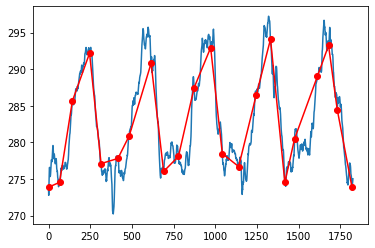

In [ ]:
fig, ax = plt.subplots()

var = Tmax_sensitive_smooth
# var = Tmin_sensitive_smooth
ax.plot(var)
ax.plot(px, var[px], "-or")


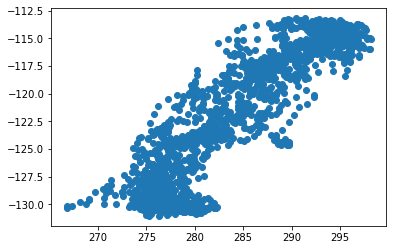

In [ ]:
plt.scatter(Tmax_sensitive_smooth[wedge:-wedge], lon_daily_cluster_mean[:,cluster])

In [ ]:
#hypothesis: the model focuses on the coast in winter because it's around 0 degrees and it knows 0 degrees is an important feature to track
#visualize: where the model is focusing (outline) overtop of temperature

day = 110
cluster = 0
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
heat_mean_fine_cluster = np.double(np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays, Npx))
flow = np.mean(np.array(y_test)[:,inds],axis = -1)

hh = (np.max(heat_mean_fine_cluster[day]) - np.min(heat_mean_fine_cluster[day])) * 0.75
plane_mid = hh*np.ones((Nlat,Nlon))

f = heat_mean_fine_cluster[day].reshape(Nlat,Nlon)
g = plane_mid

lonn, latt = np.meshgrid(eraLon,eraLat)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning: The following kwargs were not used by contour: 'zdir'
  # Remove the CWD from sys.path while we load stuff.


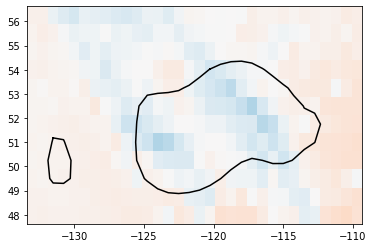

In [ ]:
fig, ax = plt.subplots()

var = Tmax_test[day] - 273
vmax = np.max(np.abs(Tmax_test[:365]-273))
vmin = -vmax
vmax = np.max(Tmax_test[:365]-273)
vmin = np.min(Tmax_test[:365]-273)
ax.imshow(var, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA, vmin = vmin, vmax = vmax)

contour = ax.contour(lonn,latt,f-g, zdir = 'z', levels = [0], alpha = 0)
lines = []
for line in contour.collections[0].get_paths():
  lines.append(line.vertices)
for line in lines:
  ax.plot(line[:,0], line[:,1],'k')

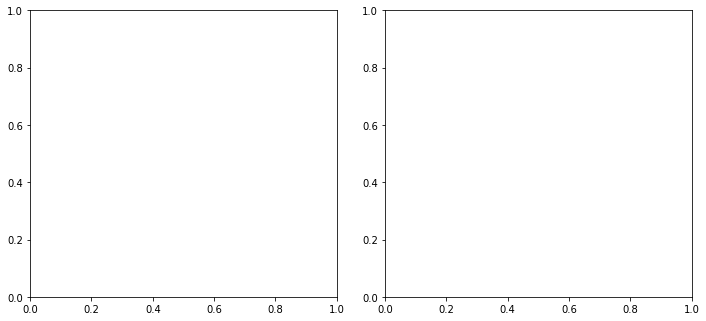

In [ ]:
#make gif of where the model is looking

filenames = []
prov = ['AB','BC']

# Set up the axes with gridspec
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(5*ncols, 5*nrows))
# # map_ax = axes[0]
# # ax = axes[1]
# fig = plt.figure(figsize=(2*ncols, 5*nrows))
# grid = plt.GridSpec(nrows, ncols, hspace=0.2, wspace=0.3)
# map_ax = fig.add_subplot(grid[:, :3])
# ax = fig.add_subplot(grid[:,3:])

for day in range(1):#Ndays):

  hh = (np.max(heat_mean_fine_cluster[day]) - np.min(heat_mean_fine_cluster[day])) * 0.75
  plane_mid = hh*np.ones((Nlat,Nlon))

  f = heat_mean_fine_cluster[day].reshape(Nlat,Nlon)
  g = plane_mid

  var = Tmax_test[day] - 273
  vmax = np.max(np.abs(Tmax_test[:365]-273))
  vmin = -vmax
  vmax = np.max(Tmax_test[:365]-273)
  vmin = np.min(Tmax_test[:365]-273)
  axes[0].imshow(var, aspect = 'auto', cmap = 'RdBu_r', extent = extentERA, vmin = vmin, vmax = vmax)
  axes[0].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', s = 100, zorder = 5)
  axes[0].set_xlim(left = extentERA[0], right = extentERA[1])
  axes[0].set_ylim(bottom = extentERA[2], top = extentERA[3])
  axes[0].set_title('Sensitivity', fontsize = fs)
  axes[0].set_xlabel('Longitude', fontsize = fs-4)
  axes[0].set_ylabel('Latitude', fontsize = fs-4)
  axes[0].tick_params(labelsize = fs-6)

  plot_prov_ax(prov, axes[0])

  contour = ax.contour(lonn,latt,f-g, levels = [0], alpha = 0)
  lines = []
  for line in contour.collections[0].get_paths():
    lines.append(line.vertices)
  for line in lines:
    axes[0].plot(line[:,0], line[:,1],'k')

  axes[1].plot(flow, 'k')
  axes[1].set_xlabel('Day of Year', fontsize = fs-4)
  axes[1].set_ylabel('Normalized Streamflow', fontsize = fs-4)
  axes[1].set_title('Streamflow', fontsize = fs)
  xx = day
  yy = flow[xx]
  axes[1].scatter(xx, yy, s = 75, edgecolor = 'k', zorder = 3)
  axes[1].tick_params(labelsize = fs-6)
  axes[1].set_xlim((-20,385))
  axes[1].set_ylim((np.min(flow)-0.5,np.max(flow)+0.5))

  plt.tight_layout()

  filename = 'Day_' + str(day) + '_contour.png'
  # filenames.append(filename)
  pauses = 1

  for i in range(pauses): #make each frame last longer
    filenames.append(filename)

  # plt.tight_layout()
  plt.savefig(filename, bbox_inches = 'tight')
  axes[0].clear()
  axes[1].clear()

In [ ]:
#save as a gif
import imageio
with imageio.get_writer('heat_vision_contour_cluster_' + str(cluster_seasonal) + '.gif', mode = 'I') as writer:
  for kk, filename in enumerate(filenames):
    if np.mod(kk, 4) == 1:
      image = imageio.imread(filename)
      writer.append_data(image)

# Heat maps through time: Melting Mask

In [ ]:
def mask_bar(H,W,width,orientation,centre):

    mask = np.zeros((H,W))

    if orientation == 'vertical':
        offset_left = int(np.floor(width/2))
        offset_right = width - offset_left
        mask[:, centre - offset_left : centre + offset_right] = 1

    if orientation == 'horizontal':
        offset_left = int(np.floor(width/2))
        offset_right = width - offset_left
        mask[centre - offset_left : centre + offset_right,:] = 1

    return mask

def mask_circle(H,W,r,centre):

    x = np.arange(W)
    y = np.arange(H)
    xx,yy = np.meshgrid(x,y)
    d = np.sqrt( (xx - centre[1])**2 + (yy - centre[0])**2 )

    mask = np.zeros((H,W))
    mask[d<=r] = 1
    
    return mask

In [ ]:
H = 12
W = 32
width = 4
orientation = 'horizontal'
orientation = 'vertical'
centre = 27
mask = mask_bar(H,W,width,orientation,centre)

# r = 3
# centre = [5,5]
# mask = mask_circle(H,W,r,centre)

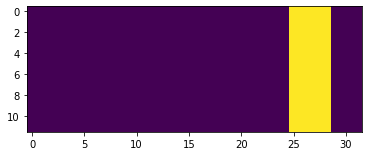

In [ ]:
plt.imshow(mask)

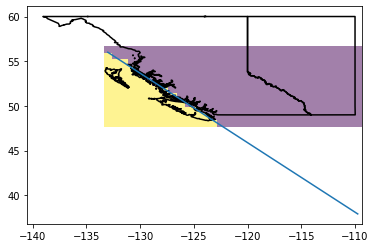

In [ ]:
a = -7/9
b = 56 - a * (-133)
y = a*eraLon + b

mask_ocean = np.zeros((H,W))
for kk, lon in enumerate(eraLon):
  for jj, lat in enumerate(eraLat):
    yy = a*lon + b
    if lat < yy:
      mask_ocean[jj,kk] = 1

fig, ax = plt.subplots()
plot_prov_ax(prov = prov, ax = ax)
ax.imshow(mask_ocean, alpha = 0.5, aspect = 'auto', extent = extentERA)
ax.plot(eraLon, y)

In [ ]:

Tmax_0_norm = (273.15 - Tmaxmean_train) / Tmaxstd_train
Tmin_0_norm = (273.15 - Tminmean_train) / Tminstd_train

Tmax_5_norm = (273.15 + 5 - Tmaxmean_train) / Tmaxstd_train
Tmin_5_norm = (273.15 + 5 - Tminmean_train) / Tminstd_train

Tmax_10_norm = (273.15 + 10 - Tmaxmean_train) / Tmaxstd_train
Tmin_10_norm = (273.15 + 10 - Tminmean_train) / Tminstd_train

Tmax_m5_norm = (273.15 - 5 - Tmaxmean_train) / Tmaxstd_train
Tmin_m5_norm = (273.15 - 5 - Tminmean_train) / Tminstd_train

Tmax_m10_norm = (273.15 - 10 - Tmaxmean_train) / Tmaxstd_train
Tmin_m10_norm = (273.15 - 10 - Tminmean_train) / Tminstd_train

Ndays_antecedent = 3

DJF_inds_test = np.squeeze(
    np.argwhere(
        (eraMonths[testInds] == 12) |
        (eraMonths[testInds] ==  1) |
        (eraMonths[testInds] ==  2)
    )
)

In [ ]:
load_heat = 0
load_heat_runs = 0

#set of random seeds to use for reproducability
seeds = [00, 11, 22, 33, 44, 55, 66, 77, 88, 99]
Nmodels = 1

#parameters for heat maps
sigma = 1.5 #radius of perturbation
style_dict = {'style' : 'gauss', #style of perturbation: gaussian (not RISE/rectangular)
              'params' : sigma}
days_heat = np.arange(Ntest) #days in test set to perturb
days_heat = np.arange(365)
iters_total = 200 #total iterations of perturbation
iters_one_pass = 20 #number of iterations to pass through model at one time (too high --> RAM issues)
tol = 1e0#5e-1

Nlat = 12#np.shape(Tmax)[1]
Nlon = 32#np.shape(Tmax)[2]
Npx = Nlat*Nlon
Ndays = len(days_heat)
Nstations = len(stationInds)

heat_fine = np.zeros((Npx*Ndays-1, Nstations, Nmodels), dtype = np.float16)
heat_fine = np.zeros((Npx*Ndays, Nstations, Nmodels), dtype = np.float16)

if not load_heat:

  #for each random seed (one seed = one bulk / set of fine-tuned models; 10 seeds --> 10 model ensemble)
  for ii, s in enumerate(seeds[:Nmodels]):

  ##### FINE-TUNING

    print('Model ' + str(ii+1))

    #prep fine-tune target output
    y_test_predict_fine_all = np.empty_like(y_test)

    #for each streamflow cluster, make/train/save fine-tuned model/output/heatmaps  

    for cluster in range(n_clusters_seasonal):

      print(' Cluster ' + str(cluster+1) + ' / ' + str(n_clusters_seasonal))

      #load model 
      model_name = 'model_fine_' + str(ii) + '_cluster_' + str(cluster) + '.h5'
      model_fine = tf.keras.models.load_model(dir_models + '/' + model_name)

      stations_fine = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster
      N_stations = len(stations_fine) #number of stations in this cluster
      
      #create target datasets (note: x is the same, y is different (same spatial input, different station targets))
      y_test_fine_current = tf.convert_to_tensor(y_test.numpy()[:,stations_fine])

      #for each day to perturb
      # print(' Making heat maps')
      for day in range(Ndays):

        #generate fine-tuned heat maps
        # print('   Day: ' + str(day+1) + ' / ' + str(Ndays))

        x_day = np.array(x_test[day])#, dtype = 'double')
        # if np.sum(DJF_inds_test == day) == 1:
          # #make melting areas be at freezing

          # x_day[:Ndays_antecedent,:,:12,0][x_day[:Ndays_antecedent,:,:12,0]>Tmax_m10_norm] = Tmax_m10_norm
          # x_day[:Ndays_antecedent,:,:12,1][x_day[:Ndays_antecedent,:,:12,1]>Tmin_m10_norm] = Tmin_m10_norm
          # x_day[:Ndays_antecedent,:,:12,2] = -1

          # x_day[:Ndays_antecedent,:,:,0][:,mask_ocean==1] = Tmax_m10_norm
          # x_day[:Ndays_antecedent,:,:,1][:,mask_ocean==1] = Tmin_m10_norm
          # x_day[:Ndays_antecedent,:,:,2][:,mask_ocean==1] = -1

          # x_day[:30,:,:,0][:,mask_ocean==1] *= 2
          # x_day[:30,:,:,1][:,mask_ocean==1] *= 2

        for dd in range(365):
          x_day[dd,:,:,1] = np.fliplr(x_day[dd,:,:,1])
          x_day[dd,:,:,1] = np.fliplr(x_day[dd,:,:,1])

        # x_day[:Ndays_antecedent,:,:,0][:,mask==1] = Tmax_10_norm
        # x_day[:Ndays_antecedent,:,:,1][:,mask==1] = Tmin_10_norm
        x_day = tf.convert_to_tensor(x_day)

        heat_mean_cluster = make_heat(
            model = model_fine, 
            x_test = tf.expand_dims(x_day, axis = 0), 
            y_test = tf.expand_dims(y_test[day], axis = 0), 
            style_dict = style_dict, 
            days = np.array([0]), 
            iters_total = iters_total, 
            iters_one_pass = iters_one_pass, 
            stationInds = stations_fine,
            verbose = 0,
            tol = tol
            )
        
        for zz,station in enumerate(stations_fine): #reorganize heatmaps into array that matches the bulk heatmap order (e.g. heat_mean_fine[:,0] and heat_mean_bulk[:,0] are the same station)
          heat_fine[Npx*day:Npx*(day+1),station,ii] = heat_mean_cluster[:,zz]

    #save fine-tuned heatmaps
    fileName = 'heat_mean_fine_series_meltmask_' + str(ii) + '.csv'
    np.savetxt(dir_heat + '/' + fileName, heat_fine[:,:,ii], delimiter = ',')

  heat_mean_fine = np.mean(heat_fine, axis = -1)

else:

  if not load_heat_runs:
    filename = 'heat_mean_fine_series_meltmask.csv'
    heat_mean_fine = pd.read_csv(dir_heat + '/' + filename, header = None).values

if load_heat_runs:

  for ii in range(1):
    print(ii)
    filename = 'heat_mean_fine_series_meltmask_' + str(ii) + '.csv'
    # heat_fine[:,:,ii] = pd.read_csv(dir_heat + '/series/' + filename, header = None).values[:Ndays*Npx,:]
    heat_fine[:,:,ii] = pd.read_csv(dir_heat + '/' + filename, header = None).values[:Ndays*Npx,:]
  heat_mean_fine = np.mean(heat_fine, axis = -1)

Model 1
 Cluster 1 / 6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:289: RuntimeWarning: divide by zero encountered in double_scalars


 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6


In [ ]:
#calculate sensitive area A, max sensitivity S, and location (lat/lon) of maximum sensitivity

lonn, latt = np.meshgrid(eraLon,eraLat)
lat_flat = latt.flatten()
lon_flat = lonn.flatten()

#for each station
A_daily = np.zeros((Ndays, Nstations))
S_daily = np.zeros((Ndays, Nstations))
lat_daily  = np.zeros((Ndays, Nstations))
lon_daily  = np.zeros((Ndays, Nstations))
for day in range(Ndays):
  for station in range(Nstations):
    heat = heat_mean_fine[Npx*day:Npx*(day+1), station]
    A_daily[day,station] = get_A(heat)
    S_daily[day,station] = np.max(heat)
    max_ind = np.argmax(heat)
    lat_daily[day,station] = lat_flat[max_ind]
    lon_daily[day,station] = lon_flat[max_ind]

#for each cluster (mean / variability)
A_daily_cluster_mean = np.zeros((Ndays, n_clusters_seasonal))
A_daily_cluster_std = np.zeros((Ndays, n_clusters_seasonal))
S_daily_cluster_mean = np.zeros((Ndays, n_clusters_seasonal))
S_daily_cluster_std = np.zeros((Ndays, n_clusters_seasonal))
lat_daily_cluster_mean  = np.zeros((Ndays, n_clusters_seasonal))
lon_daily_cluster_mean  = np.zeros((Ndays, n_clusters_seasonal))
for cluster in range(n_clusters_seasonal):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  A_daily_cluster_mean[:,cluster] = np.mean(A_daily[:,inds], axis = -1)
  A_daily_cluster_std[:,cluster] = np.std(A_daily[:,inds], axis = -1)
  S_daily_cluster_mean[:,cluster] = np.mean(S_daily[:,inds], axis = -1)
  S_daily_cluster_std[:,cluster] = np.std(S_daily[:,inds], axis = -1)
  lat_daily_cluster_mean[:,cluster] = np.mean(lat_daily[:,inds], axis = -1)
  lon_daily_cluster_mean[:,cluster] = np.mean(lon_daily[:,inds], axis = -1)

In [ ]:
#smooth

window = 7
kernel = np.ones(window) / window

#smooth stations
for station in range(Nstations):

  A_daily[:,station] = np.convolve(A_daily[:,station], kernel, mode = 'same')
  S_daily[:,station] = np.convolve(S_daily[:,station], kernel, mode = 'same')
  lat_daily[:,station] = np.convolve(lat_daily[:,station], kernel, mode = 'same')
  lon_daily[:,station] = np.convolve(lon_daily[:,station], kernel, mode = 'same')

#smooth clusters
for cluster in range(n_clusters_seasonal):

  A_daily_cluster_mean[:,cluster] = np.convolve(A_daily_cluster_mean[:,cluster], kernel, mode = 'same')
  S_daily_cluster_mean[:,cluster] = np.convolve(S_daily_cluster_mean[:,cluster], kernel, mode = 'same')

  A_daily_cluster_std[:,cluster] = np.convolve(A_daily_cluster_std[:,cluster], kernel, mode = 'same')
  S_daily_cluster_std[:,cluster] = np.convolve(S_daily_cluster_std[:,cluster], kernel, mode = 'same')

  lat_daily_cluster_mean[:,cluster] = np.convolve(lat_daily_cluster_mean[:,cluster], kernel, mode = 'same')
  lon_daily_cluster_mean[:,cluster] = np.convolve(lon_daily_cluster_mean[:,cluster], kernel, mode = 'same')

#trim edge effects
wedge = int((window - 1)/2)

A_daily = A_daily[wedge:-wedge]
S_daily = S_daily[wedge:-wedge]

A_daily_cluster_mean = A_daily_cluster_mean[wedge:-wedge]
S_daily_cluster_mean = S_daily_cluster_mean[wedge:-wedge]

A_daily_cluster_std = A_daily_cluster_std[wedge:-wedge]
S_daily_cluster_std = S_daily_cluster_std[wedge:-wedge]

lat_daily_cluster_mean = lat_daily_cluster_mean[wedge:-wedge]
lon_daily_cluster_mean = lon_daily_cluster_mean[wedge:-wedge]


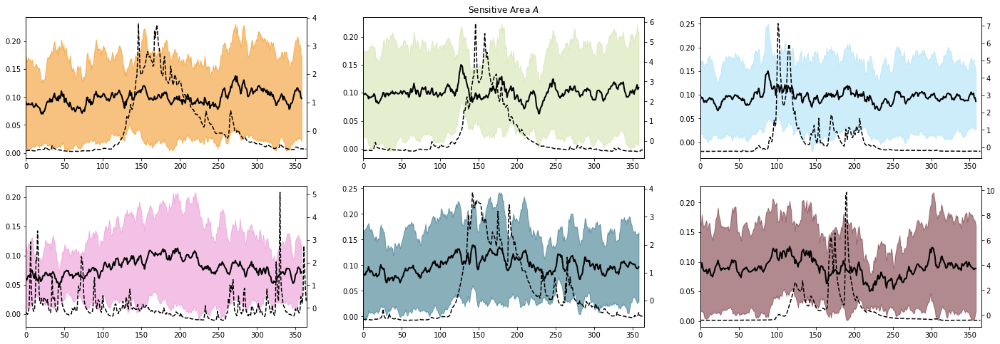

In [ ]:
#visualize sensitive area through time

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = A_daily_cluster_mean[:,cluster] + 2*A_daily_cluster_std[:,cluster]
  y2 = A_daily_cluster_mean[:,cluster] - 2*A_daily_cluster_std[:,cluster]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(A_daily_cluster_mean[:,cluster], 'k', linewidth = 2)
  ax.set_xlim(right = 365, left = 0)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

  if cluster == 1:
    ax.set_title('Sensitive Area $A$')

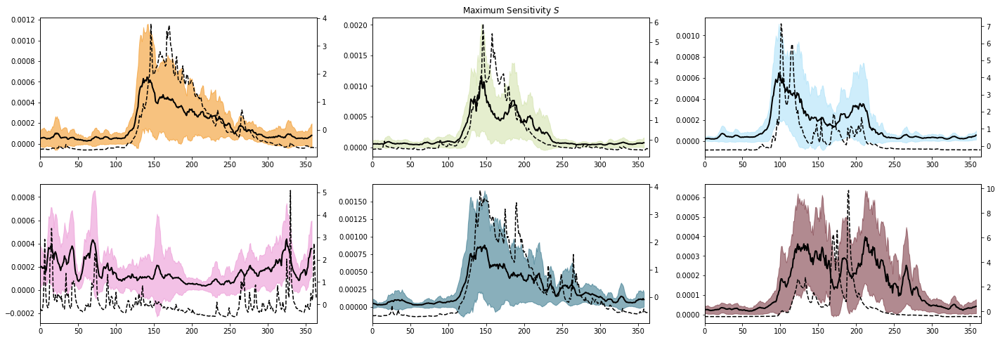

In [ ]:
#visualize max sensitivity

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = S_daily_cluster_mean[:,cluster] + 2*S_daily_cluster_std[:,cluster]
  y2 = S_daily_cluster_mean[:,cluster] - 2*S_daily_cluster_std[:,cluster]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(S_daily_cluster_mean[:,cluster], 'k', linewidth = 2)
  ax.set_xlim(right = 365, left = 0)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

  if cluster == 1:
    ax.set_title('Maximum Sensitivity $S$')

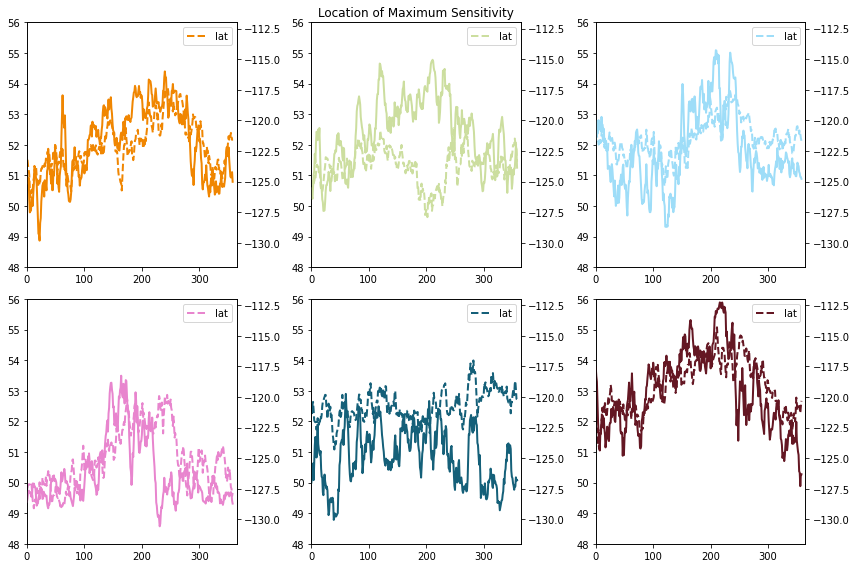

In [ ]:
#visualize lat/lon of max sensitivity point through time

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(lat_daily_cluster_mean[:,cluster], color = rgbas_array[cluster,:], linewidth = 2, label = 'lat', linestyle = '--')
  ax.set_xlim(right = 365, left = 0)
  ax2 = ax.twinx()
  ax2.plot(lon_daily_cluster_mean[:,cluster], color = rgbas_array[cluster,:], linewidth = 2, label = 'lon')
  ax.legend()
  # ax2.legend()

  ax.set_ylim((48,56))
  ax2.set_ylim((-132, -112))

  if cluster == 1:
    ax.set_title('Location of Maximum Sensitivity')

plt.tight_layout()

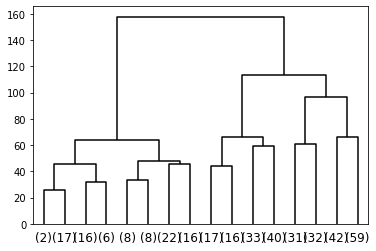

In [ ]:
cluster_seasonal = 0

#input: lat/lon of max sensitivity
cluster_input = np.vstack([lat_daily_cluster_mean[:,cluster_seasonal], lon_daily_cluster_mean[:,cluster_seasonal]]).T
cluster_input = (cluster_input - np.mean(cluster_input, axis = 0)) / np.std(cluster_input, axis = 0)

#input: normalized heat maps
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(-1,Npx)
var = np.double(heat_mean_fine_cluster)
heat_mean_fine_cluster_norm = (heat_mean_fine_cluster - np.expand_dims(np.mean(var, axis = -1), axis = -1)) / np.expand_dims(np.std(var, axis = -1), axis = -1)
cluster_input = np.double(heat_mean_fine_cluster_norm)

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(cluster_input)

# plot the top levels of the dendrogram
d = plot_dendrogram(model, truncate_mode='level', p=3, color_threshold = 0, above_threshold_color = 'k')

In [ ]:
n_clusters = 2
model = AgglomerativeClustering(n_clusters = n_clusters).fit(cluster_input)
labels = model.labels_

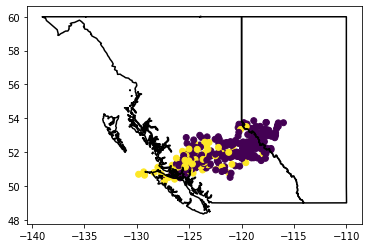

In [ ]:
fig, ax = plt.subplots()
plot_prov_ax(prov, ax)
ax.scatter(lon_daily_cluster_mean[:,cluster_seasonal], lat_daily_cluster_mean[:,cluster_seasonal], c = labels[wedge:-wedge])

In [ ]:
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays,Npx)

cluster_heat = np.zeros((n_clusters, Npx))
for cluster in range(n_clusters):
  days = np.squeeze(np.argwhere(labels==cluster))
  cluster_heat[cluster,:] = np.mean(heat_mean_fine_cluster[days,:], axis = 0)


(0.0, 365.0)

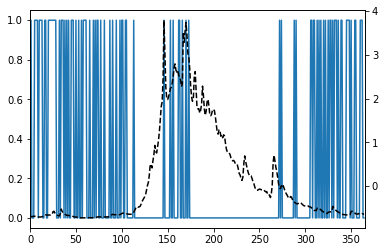

In [ ]:
fig, ax = plt.subplots()
ax.plot(labels)
flow = np.mean(np.array(y_test)[:Ndays,inds], axis = -1)
ax2 = ax.twinx()
ax2.plot(flow,'k--')

ax.set_xlim(left = 0, right = 365)

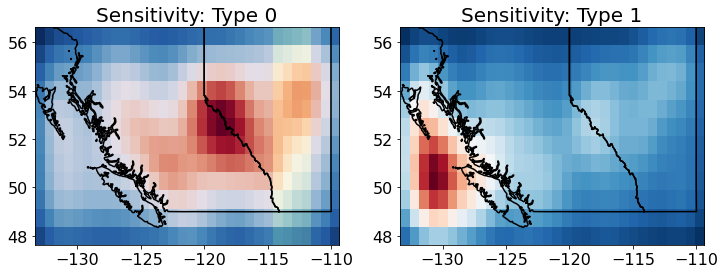

In [ ]:
saveIt = 0

nrows = 1
ncols = n_clusters

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (6*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  vmax = np.max(cluster_heat[cluster])
  vmin = np.min(cluster_heat[cluster])
  # vmax = np.max(cluster_heat)
  # vmin = np.min(cluster_heat)
  ax.imshow(cluster_heat[cluster,:].reshape(Nlat,Nlon), aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax, cmap = 'RdBu_r')

  if cluster == 0:
    ax.imshow(mask, extent = extentERA, alpha = 0.1, aspect = 'auto')

  plot_prov_ax(prov, ax)
  ax.set_xlim(left = extentERA[0], right = extentERA[1])
  ax.set_ylim(bottom = extentERA[2], top = extentERA[3])
  ax.set_title('Sensitivity: Type ' + str(cluster), fontsize = fs)
  ax.tick_params(labelsize = fs-4)

if saveIt: 
  plt.savefig('sensitivity_clusters.png', bbox_inches = 'tight', dpi = 300)

In [ ]:
#compare DJF heat map of meltmask vs normal and see how they compare

cluster = 0

#load normal heatmaps
heat_fine = np.zeros((Npx*Ndays, Nstations, Nmodels), dtype = np.float16)
heat_mean_fine = np.zeros((Npx*Ndays, Nstations), dtype = np.float16)
for ii in range(1):
  print(ii)
  filename = 'heat_mean_fine_series' + str(ii) + '.csv'
  heat_fine[:,:,ii] = pd.read_csv(dir_heat + '/series/' + filename, header = None).values[:Ndays*Npx,:]
heat_mean_fine = np.mean(heat_fine, axis = -1)

#load meltmask heatmaps
heat_fine_meltmask = np.zeros((Npx*Ndays, Nstations, Nmodels), dtype = np.float16)
heat_mean_fine_meltmask = np.zeros((Npx*Ndays, Nstations), dtype = np.float16)
for ii in range(1):
  print(ii)
  filename = 'heat_mean_fine_series_meltmask_' + str(ii) + '.csv'
  # heat_fine[:,:,ii] = pd.read_csv(dir_heat + '/series/' + filename, header = None).values[:Ndays*Npx,:]
  heat_fine_meltmask[:,:,ii] = pd.read_csv(dir_heat + '/' + filename, header = None).values[:Ndays*Npx,:]
heat_mean_fine_meltmask = np.mean(heat_fine_meltmask, axis = -1)

0
0


In [ ]:
cluster = 2
inds_cluster = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
DJF_inds = DJF_inds_test[:90]

heat_mean_DJF = np.double(np.mean(heat_mean_fine[:,inds_cluster], axis = -1))
heat_mean_DJF = np.mean(heat_mean_DJF.reshape((Ndays, Npx))[DJF_inds,:], axis = 0)

heat_mean_meltmask_DJF = np.double(np.mean(heat_mean_fine_meltmask[:,inds_cluster], axis = -1))
heat_mean_meltmask_DJF = np.mean(heat_mean_meltmask_DJF.reshape((Ndays, Npx))[DJF_inds,:], axis = 0)

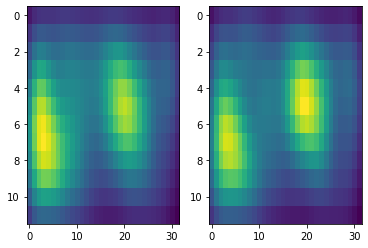

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 2)

vars = [heat_mean_DJF, heat_mean_meltmask_DJF]
vmin = np.min(vars)
vmax = np.max(vars)

axes[0].imshow(vars[0].reshape(Nlat,Nlon), aspect = 'auto')
axes[1].imshow(vars[1].reshape(Nlat,Nlon), aspect = 'auto')

In [ ]:
#loop through all seasonal clusters, then cluster heat maps, then characterize active 
n_clusters_heat_all = [2,2,2,3,3,2]
n_clusters_heat_all = [2,2,2,2,2,2]
# n_clusters_heat_all = [3,3,3,3,3,3]

heat_all = np.zeros((n_clusters_seasonal, np.max(n_clusters_heat_all), Npx))
labels_all = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
heat_mean_active = np.zeros((n_clusters_seasonal, Npx))
heat_mean_dormant = np.zeros((n_clusters_seasonal, Npx))
labels_binary = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
flow_clusters = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))

for cluster_seasonal, n_clusters_heat in enumerate(n_clusters_heat_all):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

  # #cluster input: latitude/longitude of sensitivity maximum
  # cluster_input = np.vstack([lat_daily_cluster_mean[:,cluster_seasonal], lon_daily_cluster_mean[:,cluster_seasonal]]).T
  # cluster_input = (cluster_input - np.mean(cluster_input, axis = 0)) / np.std(cluster_input, axis = 0)

  #input: normalized heat maps
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(-1,Npx)
  var = np.double(heat_mean_fine_cluster)
  heat_mean_fine_cluster_norm = (heat_mean_fine_cluster - np.expand_dims(np.mean(var, axis = -1), axis = -1)) / np.expand_dims(np.std(var, axis = -1), axis = -1)
  cluster_input = heat_mean_fine_cluster_norm

  #cluster by heat maximum location
  model = AgglomerativeClustering(n_clusters = n_clusters_heat).fit(cluster_input)
  labels = model.labels_
  labels_all[cluster_seasonal] = np.copy(labels)

  #calculate mean flow of each location cluster
  flow = np.mean(np.array(y_test)[wedge:Ndays-wedge,inds], axis = -1)
  flow_cluster_mean = np.zeros(n_clusters_heat)
  for cluster_heat in range(n_clusters_heat):
    inds_labels = np.squeeze(np.argwhere(labels == cluster_heat))
    flow_cluster_mean[cluster_heat] = np.mean(flow[inds_labels])
  ind_heat_active = np.argmax(flow_cluster_mean) #index of the heat map / location cluster with the highest average flow
  ind_heat_dormant = np.squeeze(np.argwhere(np.arange(n_clusters_heat) != ind_heat_active))

  #sort labels from low to high flow
  sorted = np.argsort(flow_cluster_mean)
  labels_sorted = np.zeros(np.shape(labels))
  for kk in range(n_clusters_heat):
    labels_sorted[labels==sorted[kk]] = kk 
  labels_all[cluster_seasonal,:] = labels_sorted
  labels = labels_sorted

  #calculate average heat map of each location cluster
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays,Npx)
  cluster_heat = np.zeros((n_clusters_heat, Npx))
  for cluster in range(n_clusters_heat):
    days = np.squeeze(np.argwhere(labels==cluster))
    cluster_heat[cluster,:] = np.mean(heat_mean_fine_cluster[days,:], axis = 0)
    heat_all[cluster_seasonal, cluster,:] = np.copy(cluster_heat[cluster,:])

  heat_mean_active[cluster_seasonal,:] = cluster_heat[ind_heat_active,:]
  if np.size(ind_heat_dormant)>1:
    heat_mean_dormant[cluster_seasonal,:] = np.mean(cluster_heat[ind_heat_dormant,:], axis = 0)
  else:
    heat_mean_dormant[cluster_seasonal,:] = cluster_heat[ind_heat_dormant,:]

  labels_binary[cluster_seasonal, labels == ind_heat_active] = 1 #1: active, 0: dormant
  flow_clusters[cluster_seasonal, :] = flow

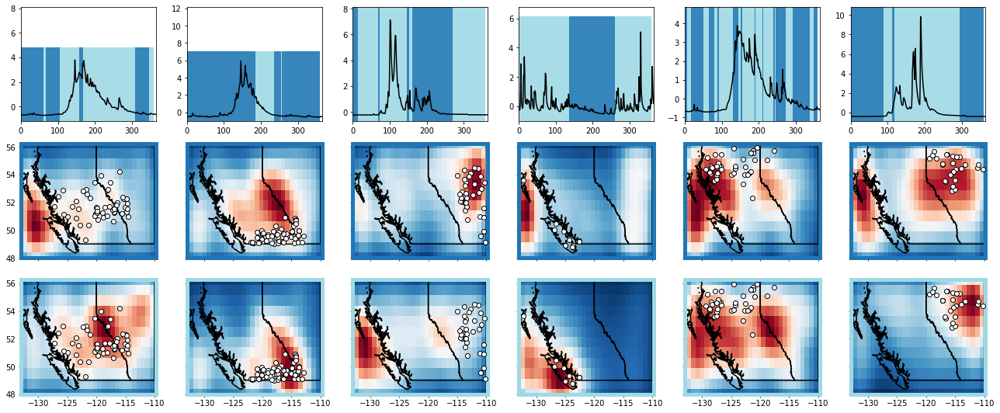

In [ ]:
#figure: row 1: cluster labels through time + flow, other rows: heat clusters; columns are streamflow clusters 
nrows = np.max(n_clusters_heat_all)+1
ncols = n_clusters_seasonal

year = 0

#make discrete colourmap for label imshow
# cmap = colors.ListedColormap(['white', 'red'])
cmap = cm.get_cmap('tab20')
bounds = np.arange(-0.5, np.max(n_clusters_heat_all))
norm = colors.BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster_seasonal in range(n_clusters_seasonal):

  #label
  # ax_label = axes[0,cluster_seasonal].twinx()
  ymax = np.max(flow_clusters[cluster_seasonal,:])+1.0
  ymin = np.min(flow_clusters[cluster_seasonal,:])-0.5
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  axes[0,cluster_seasonal].imshow(np.expand_dims(labels_all[cluster_seasonal,:], axis=0), extent = extent, 
                  aspect = 'auto', alpha = .9, cmap = cmap, norm = norm, zorder = -1)
  axes[0,cluster_seasonal].tick_params(labelright = False, right = False)

  #flow
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  axes[0,cluster_seasonal].plot(np.mean(np.array(y_test)[:,inds], axis = -1), 'k', zorder = 2)
  axes[0,cluster_seasonal].set_xlim(left = year*365, right = (year+1)*365)

  for cluster_heat in range(n_clusters_heat_all[cluster_seasonal]):

    axes[cluster_heat+1,cluster_seasonal].imshow(heat_all[cluster_seasonal, cluster_heat,:].reshape(Nlat,Nlon), cmap = 'RdBu_r', aspect = 'auto', extent = extentERA)
    plot_prov_ax(prov, axes[cluster_heat+1,cluster_seasonal])
    axes[cluster_heat+1,cluster_seasonal].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)
    axes[cluster_heat+1,cluster_seasonal].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[cluster_heat+1,cluster_seasonal].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))
    plt.setp(axes[cluster_heat+1,cluster_seasonal].spines.values(), color = cmap(norm(cluster_heat)), linewidth = 5)

    if cluster_heat < n_clusters_heat_all[cluster_seasonal]-1:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelbottom = False)
  
    if cluster_seasonal > 0:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelleft = False)

plt.tight_layout()

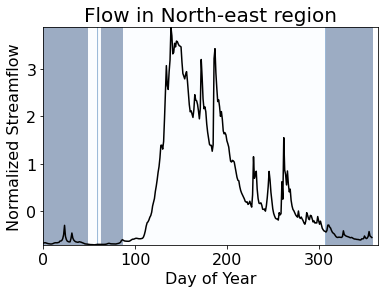

In [ ]:
saveIt = 0

cluster_seasonal = 4

fig, ax = plt.subplots(figsize = (6,4))

inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

ymax = np.max(flow_clusters[cluster_seasonal,:])
ymin = np.min(flow_clusters[cluster_seasonal,:])
xmin = 0
xmax = Ndays-2*wedge
extent = [xmin, xmax, ymin, ymax]
ax.imshow(np.expand_dims(labels, axis=0), extent = extent, aspect = 'auto', alpha = 0.4, cmap = 'Blues_r')
ax.plot(flow_clusters[cluster_seasonal,:], color = 'k')
# ax.plot(flow_cluster_predict, 'k--')
ax.set_xlim(left = 0, right = 365)
ax.set_ylim(bottom = ymin, top = ymax)
ax.set_xlabel('Day of Year', fontsize = fs-4)
ax.set_ylabel('Normalized Streamflow', fontsize = fs-4)
ax.set_title('Flow in North-east region', fontsize = fs)
ax.tick_params(labelsize = fs-4)

if saveIt: 
  plt.savefig('sensitivity_flow_time.png', bbox_inches = 'tight', dpi = 300)

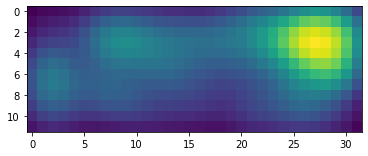

In [ ]:
plt.imshow(heat_mean_active[2].reshape(Nlat,Nlon))

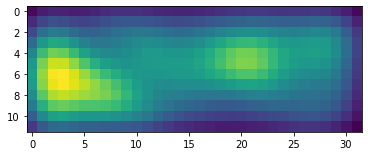

In [ ]:
plt.imshow(heat_mean_dormant[2].reshape(Nlat,Nlon))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


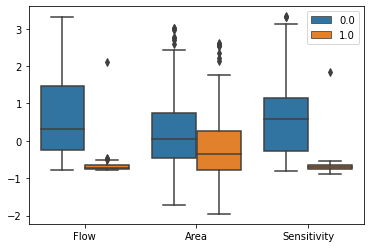

In [ ]:
cluster_seasonal = 0


x = np.hstack([['Flow' for kk in range(Ndays-2*wedge)], 
               ['Area' for kk in range(Ndays-2*wedge)], 
               ['Sensitivity' for kk in range(Ndays-2*wedge)]])

v1 = (flow_clusters[cluster_seasonal,:] - np.mean(flow_clusters[cluster_seasonal,:])) / np.std(flow_clusters[cluster_seasonal,:])
v2 = (A_daily_cluster_mean[:,cluster_seasonal] - np.mean(A_daily_cluster_mean[:,cluster_seasonal])) / np.std(A_daily_cluster_mean[:,cluster_seasonal])
v3 = (S_daily_cluster_mean[:,cluster_seasonal] - np.mean(S_daily_cluster_mean[:,cluster_seasonal])) / np.std(S_daily_cluster_mean[:,cluster_seasonal])

y = np.hstack([v1, v2, v3])
hue = np.tile(labels_binary[cluster_seasonal,:],3)

sns.boxplot(x,y,hue)

NameError: ignored

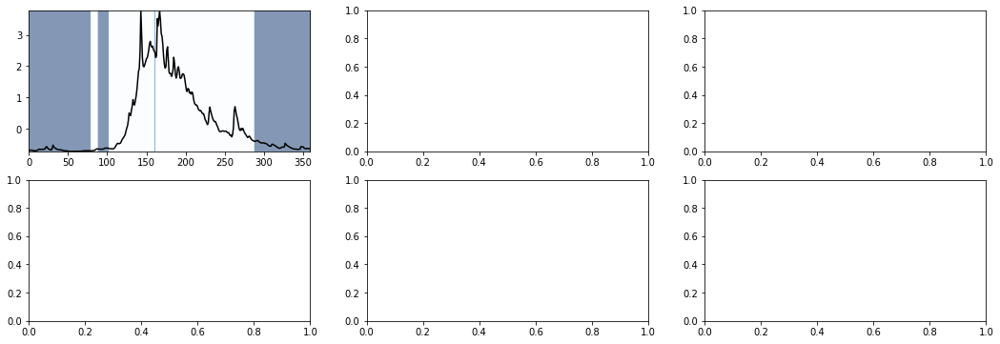

In [ ]:
nrows = 2
ncols = 3

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (6*ncols, 3*nrows))

for cluster_seasonal, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  # flow_cluster_predict = np.mean(y_test_predict[:Ndays,inds], axis = -1)
  ymax = np.max(flow_clusters[cluster_seasonal,:])
  ymin = np.min(flow_clusters[cluster_seasonal,:])
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  ax.imshow(np.expand_dims(labels_binary[cluster_seasonal,:], axis=0), extent = extent, aspect = 'auto', alpha = 0.5, cmap = 'Blues')
  ax.plot(flow_clusters[cluster_seasonal,:], color = 'k')
  ax.plot(flow_cluster_predict, 'k--')

# Output neuron activation: Linear model

In [ ]:
#make predictions
N_linear_models = 10 

y_train_predict_linear_all = np.zeros((Ntrain - 365,Nstations,N_linear_models))
y_val_predict_linear_all = np.zeros((Nval,Nstations,N_linear_models))
y_test_predict_linear_all = np.zeros((Ntest,Nstations,N_linear_models))

# x_train_linear = tf.reshape(x_train,(Ntrain-365,-1))
# x_val_linear = tf.reshape(x_val,(Nval,-1))
x_test_linear = tf.reshape(x_test,(Ntest,-1))

for kk in range(N_linear_models):
  print(kk)
  for cluster in range(n_clusters_seasonal):
    inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
    model_name = 'model_linear_' + str(kk) + '_cluster_' + str(cluster) + '.h5'
    model = tf.keras.models.load_model(dir_models + '/' + model_name)
    # y_train_predict_linear_all[:,inds,kk] = model.predict(x_train_linear, batch_size = 64)
    # y_val_predict_linear_all[:,inds,kk] = model.predict(x_val_linear, batch_size = 64)
    y_test_predict_linear_all[:,inds,kk] = model.predict(x_test_linear, batch_size = 64)

# y_train_predict_linear_fine = np.mean(y_train_predict_linear_all, axis = -1)
# y_val_predict_linear_fine = np.mean(y_val_predict_linear_all, axis = -1)
y_test_predict_linear_fine = np.mean(y_test_predict_linear_all, axis = -1)
# y_all_predict_linear_fine = np.vstack((y_train_predict_linear_fine, y_val_predict_linear_fine, y_test_predict_linear_fine))

0
1
2
3
4
5
6
7
8
9


In [ ]:
#find temp/precip patterns that maximize the one-day-change in activation of output neurons by cluster

Nstations = len(stationInds)

date_str = [str(int(eraDays[kk])) + '-' +  str(int(eraMonths[kk])) + '-' + str(int(eraYears[kk])) for kk in range(len(eraYears))]
eraDate = [datetime.strptime(d_str, '%d-%m-%Y') for d_str in date_str]

test_start = np.min(np.argwhere(eraYears == 2011))
# test_start = np.min(np.argwhere(eraYears == 1980))
test_fin = np.max(np.argwhere(eraYears == 2015))
eraDate_test = eraDate[test_start:test_fin+1]
eraMonths_test = eraMonths[test_start:test_fin+1]

DJF_inds = np.squeeze(np.argwhere( (eraMonths_test == 12) | (eraMonths_test == 1 ) | (eraMonths_test == 2 ) ))[:-1]
MAM_inds = np.squeeze(np.argwhere( (eraMonths_test == 3 ) | (eraMonths_test == 4 ) | (eraMonths_test == 5 ) ))
JJA_inds = np.squeeze(np.argwhere( (eraMonths_test == 6 ) | (eraMonths_test == 7 ) | (eraMonths_test == 8 ) ))
SON_inds = np.squeeze(np.argwhere( (eraMonths_test == 9 ) | (eraMonths_test == 10) | (eraMonths_test == 11) ))

dy_test_predict = y_test_predict_linear_fine[1:,:] - y_test_predict_linear_fine[:-1,:] #1-day-change in output flow (or output neuron activation)
# dy_test_predict = y_all_predict[1:,:] - y_all_predict[:-1,:]

# Ntest = Ntest - Nval - Ntrain - 365

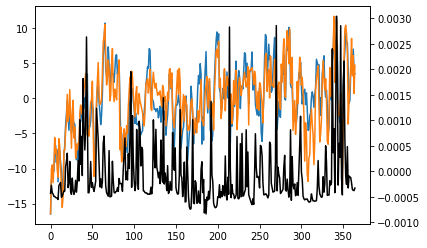

In [ ]:
#remove seasonal cycles of max and min temperatures

Nyears = len(range(int(eraYears[0]),int(eraYears[-1]+1)))
Nlat = len(eraLat)
Nlon = len(eraLon)
Tmax_seasonal = np.zeros((365,Nlat,Nlon))
Tmin_seasonal = np.zeros((365,Nlat,Nlon))
P_seasonal = np.zeros((365,Nlat,Nlon))

#calculate seasonal signal
for year in range(int(eraYears[0]),int(eraYears[-1]+1)):

  start_date = datetime(year,1,1)
  fin_date = start_date + timedelta(days=364)
  start_ind = eraDate.index(start_date)
  fin_ind = eraDate.index(fin_date)

  Tmax_seasonal += Tmax[start_ind:fin_ind+1]
  Tmin_seasonal += Tmin[start_ind:fin_ind+1]
  P_seasonal += P[start_ind:fin_ind+1]

Tmax_seasonal /= Nyears
Tmin_seasonal /= Nyears
P_seasonal /= Nyears

#smooth seasonal signal
window = 7
kernel = np.ones(window) / window
for kk in range(Nlat):
  for jj in range(Nlon):
    Tmax_seasonal[:,kk,jj] = pd.Series(Tmax_seasonal[:,kk,jj]).rolling(window = window, min_periods = 1, center = True).mean()
    Tmin_seasonal[:,kk,jj] = pd.Series(Tmin_seasonal[:,kk,jj]).rolling(window = window, min_periods = 1, center = True).mean()
    P_seasonal[:,kk,jj] = pd.Series(P_seasonal[:,kk,jj]).rolling(window = window, min_periods = 1, center = True).mean()

#remove seasonal signal
Tmax_deseasonal = np.copy(Tmax)
Tmin_deseasonal = np.copy(Tmin)
P_deseasonal = np.copy(P)
for year in range(int(eraYears[0]),int(eraYears[-1]+1)):
  start_date = datetime(year,1,1)
  fin_date = start_date + timedelta(days=364)
  start_ind = eraDate.index(start_date)
  fin_ind = eraDate.index(fin_date)

  Tmax_deseasonal[start_ind:fin_ind+1] = Tmax[start_ind:fin_ind+1] - Tmax_seasonal
  Tmin_deseasonal[start_ind:fin_ind+1] = Tmin[start_ind:fin_ind+1] - Tmin_seasonal
  P_deseasonal[start_ind:fin_ind+1] = P[start_ind:fin_ind+1] - P_seasonal

  if np.mod(year,4)==0: #if leap year
    Tmax_deseasonal[fin_ind+1] -= Tmax_seasonal[-1]
    Tmin_deseasonal[fin_ind+1] -= Tmin_seasonal[-1]
    P_deseasonal[fin_ind+1] -= P_deseasonal[-1]

#visualize
fig, ax = plt.subplots()
ax.plot(Tmax_deseasonal[:365,5,20], label = 'Max Temp Anomaly')
ax.plot(Tmin_deseasonal[:365,5,20], label = 'Min Temp Anomaly')
ax2 = ax.twinx()
ax2.plot(P_deseasonal[:365,5,20], 'k')


In [ ]:
# #ANALYSIS BY STATION: Calculate average field of top-flow-change-days

# N_DJF = len(DJF_inds) #number of DJF days
# N_MAM = len(MAM_inds) #number of MAM days
# N_JJA = len(JJA_inds) #number of JJA days
# N_SON = len(SON_inds) #number of SON days

# N_antecedent = 0
# frac_top = 0.1 #fraction of days to use as 'high flow' (e.g. 0.1 --> top 10% of flow change days)
# N_top = int(frac_top*np.mean([N_DJF, N_MAM, N_JJA, N_SON])) #number of 'top change in flow days' to calculate input patterns for 
# # N_top = 300 

# #normalize climate data

# #PRECIP
# #normalize each grid cell of precip to have mean of zero and unity variance
# #normalized values measure how far (in standard deviations) each day of precip is from that location's mean
# #otherwise, coastal precip is so much more than everywhere else that patterns just highlight a wet coast
# #this way, Pnorm>0 indicates "wetter than usual here", Pnorm<0 indicates "drier than usual here"

# # P_px_norm = (P - np.mean(P, axis = 0)) / np.std(P,axis = 0)
# P_px_norm = np.copy(P_deseasonal) / np.std(P_deseasonal,axis = 0)
# # P_px_norm_test = P_px_norm[-Ntest:]
# P_px_norm_test = P_px_norm[365:]

# #TEMP
# #normalize each grid cell of temperature by removing the seasonal cycle
# #normalized values measure how many degrees warmer/cooler each grid cell is at that day, relative to that grid cell's mean of that day
# #otherwise, we find that JJA flow change is linked to hot temperatures -- only because JJA is hotter than other periods (would just be measuring seasons)
# #this way, Tnorm>0 indicates "hotter than usual for this day and location", Tnorm<0 indicates "colder than usual for this day and location"

# Tmax_px_norm = np.copy(Tmax_deseasonal) / np.std(Tmax_deseasonal,axis = 0)
# # Tmax_px_norm_test = Tmax_px_norm[-Ntest:]
# Tmax_px_norm_test = Tmax_px_norm[365:]

# Tmin_px_norm = np.copy(Tmin_deseasonal) / np.std(Tmin_deseasonal,axis = 0)
# # Tmin_px_norm_test = Tmin_px_norm[-Ntest:]
# Tmin_px_norm_test = Tmin_px_norm[365:]

# Pnorm_dymax_DJF = np.zeros((Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (DJF)
# Pnorm_dymax_MAM = np.zeros((Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (MAM)
# Pnorm_dymax_JJA = np.zeros((Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (JJA)
# Pnorm_dymax_SON = np.zeros((Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (SON)

# Tmaxnorm_dymax_DJF = np.zeros((Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (DJF)
# Tmaxnorm_dymax_MAM = np.zeros((Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (MAM)
# Tmaxnorm_dymax_JJA = np.zeros((Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (JJA)
# Tmaxnorm_dymax_SON = np.zeros((Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (SON)

# Tminnorm_dymax_DJF = np.zeros((Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (DJF)
# Tminnorm_dymax_MAM = np.zeros((Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (MAM)
# Tminnorm_dymax_JJA = np.zeros((Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (JJA)
# Tminnorm_dymax_SON = np.zeros((Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (SON)

# for station in range(Nstations):

#   dy_test_predict_station = dy_test_predict[:,station]

#   dy_DJF = dy_test_predict_station[DJF_inds] #DJF change in flow
#   dy_MAM = dy_test_predict_station[MAM_inds] #MAM change in flow
#   dy_JJA = dy_test_predict_station[JJA_inds] #JJA change in flow
#   dy_SON = dy_test_predict_station[SON_inds] #SON change in flow

#   dy_top_DJF = np.sort(dy_DJF)[-N_top:] #maximum change in flow days (DJF)
#   dy_top_MAM = np.sort(dy_MAM)[-N_top:] #maximum change in flow days (MAM)
#   dy_top_JJA = np.sort(dy_JJA)[-N_top:] #maximum change in flow days (JJA)
#   dy_top_SON = np.sort(dy_SON)[-N_top:] #maximum change in flow days (SON)

#   dy_top_ind_DJF = DJF_inds[np.argsort(dy_DJF)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
#   dy_top_ind_MAM = MAM_inds[np.argsort(dy_MAM)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
#   dy_top_ind_JJA = JJA_inds[np.argsort(dy_JJA)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
#   dy_top_ind_SON = SON_inds[np.argsort(dy_SON)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)

#   # dy_top_ind_DJF = DJF_inds[np.random.randint(0,N_top,N_DJF)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
#   # dy_top_ind_MAM = MAM_inds[np.random.randint(0,N_top,N_MAM)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
#   # dy_top_ind_JJA = JJA_inds[np.random.randint(0,N_top,N_JJA)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
#   # dy_top_ind_SON = SON_inds[np.random.randint(0,N_top,N_SON)] #indices in ERA test dataset of the max-change-in-flow days (DJF)

#   #include few antecedent days
#   dummy = []
#   for kk, ind in enumerate(dy_top_ind_DJF):
#     if ind>=N_antecedent:
#       for jj in range(N_antecedent+1):
#         dummy.append(ind-jj)
#   dy_top_ind_DJF = np.array(dummy,dtype='int')

#   dummy = []
#   for kk, ind in enumerate(dy_top_ind_MAM):
#     if ind>=N_antecedent:
#       for jj in range(N_antecedent+1):
#         dummy.append(ind-jj)
#   dy_top_ind_MAM = np.array(dummy,dtype='int')

#   dummy = []
#   for kk, ind in enumerate(dy_top_ind_JJA):
#     if ind>=N_antecedent:
#       for jj in range(N_antecedent+1):
#         dummy.append(ind-jj)
#   dy_top_ind_JJA = np.array(dummy,dtype='int')

#   dummy = []
#   for kk, ind in enumerate(dy_top_ind_SON):
#     if ind>=N_antecedent:
#       for jj in range(N_antecedent+1):
#         dummy.append(ind-jj)
#   dy_top_ind_SON = np.array(dummy,dtype='int')

#   Pnorm_dymax_DJF[:,:,station] = np.mean(P_px_norm_test[dy_top_ind_DJF], axis = 0) #precip fields for top-flow-change-days (DJF)
#   Pnorm_dymax_MAM[:,:,station] = np.mean(P_px_norm_test[dy_top_ind_MAM], axis = 0) #precip fields for top-flow-change-days (MAM)
#   Pnorm_dymax_JJA[:,:,station] = np.mean(P_px_norm_test[dy_top_ind_JJA], axis = 0) #precip fields for top-flow-change-days (JJA)
#   Pnorm_dymax_SON[:,:,station] = np.mean(P_px_norm_test[dy_top_ind_SON], axis = 0) #precip fields for top-flow-change-days (SON)

#   Tmaxnorm_dymax_DJF[:,:,station] = np.mean(Tmax_px_norm_test[dy_top_ind_DJF], axis = 0) #max temp fields for top-flow-change-days (DJF)
#   Tmaxnorm_dymax_MAM[:,:,station] = np.mean(Tmax_px_norm_test[dy_top_ind_MAM], axis = 0) #max temp fields for top-flow-change-days (MAM)
#   Tmaxnorm_dymax_JJA[:,:,station] = np.mean(Tmax_px_norm_test[dy_top_ind_JJA], axis = 0) #max temp fields for top-flow-change-days (JJA)
#   Tmaxnorm_dymax_SON[:,:,station] = np.mean(Tmax_px_norm_test[dy_top_ind_SON], axis = 0) #max temp fields for top-flow-change-days (SON)

#   Tminnorm_dymax_DJF[:,:,station] = np.mean(Tmin_px_norm_test[dy_top_ind_DJF], axis = 0) #min temp fields for top-flow-change-days (DJF)
#   Tminnorm_dymax_MAM[:,:,station] = np.mean(Tmin_px_norm_test[dy_top_ind_MAM], axis = 0) #min temp fields for top-flow-change-days (MAM)
#   Tminnorm_dymax_JJA[:,:,station] = np.mean(Tmin_px_norm_test[dy_top_ind_JJA], axis = 0) #min temp fields for top-flow-change-days (JJA)
#   Tminnorm_dymax_SON[:,:,station] = np.mean(Tmin_px_norm_test[dy_top_ind_SON], axis = 0) #min temp fields for top-flow-change-days (SON)

In [ ]:
#ANALYSIS BY STATION: Keep all top-flow-change-days, not just mean

N_DJF = len(DJF_inds) #number of DJF days
N_MAM = len(MAM_inds) #number of MAM days
N_JJA = len(JJA_inds) #number of JJA days
N_SON = len(SON_inds) #number of SON days

N_antecedent = 0
frac_top = 0.1 #fraction of days to use as 'high flow' (e.g. 0.1 --> top 10% of flow change days)
N_top = int(frac_top*np.mean([N_DJF, N_MAM, N_JJA, N_SON])) #number of 'top change in flow days' to calculate input patterns for 
# N_top = 300 

#normalize climate data

#PRECIP
#normalize each grid cell of precip to have mean of zero and unity variance
#normalized values measure how far (in standard deviations) each day of precip is from that location's mean
#otherwise, coastal precip is so much more than everywhere else that patterns just highlight a wet coast
#this way, Pnorm>0 indicates "wetter than usual here", Pnorm<0 indicates "drier than usual here"

# P_px_norm = (P - np.mean(P, axis = 0)) / np.std(P,axis = 0)
P_px_norm = np.copy(P_deseasonal) / np.std(P_deseasonal,axis = 0)
# P_px_norm_test = P_px_norm[-Ntest:]
P_px_norm_test = P_px_norm[365:]

#TEMP
#normalize each grid cell of temperature by removing the seasonal cycle
#normalized values measure how many degrees warmer/cooler each grid cell is at that day, relative to that grid cell's mean of that day
#otherwise, we find that JJA flow change is linked to hot temperatures -- only because JJA is hotter than other periods (would just be measuring seasons)
#this way, Tnorm>0 indicates "hotter than usual for this day and location", Tnorm<0 indicates "colder than usual for this day and location"

Tmax_px_norm = np.copy(Tmax_deseasonal) / np.std(Tmax_deseasonal,axis = 0)
# Tmax_px_norm_test = Tmax_px_norm[-Ntest:]
Tmax_px_norm_test = Tmax_px_norm[365:]

Tmin_px_norm = np.copy(Tmin_deseasonal) / np.std(Tmin_deseasonal,axis = 0)
# Tmin_px_norm_test = Tmin_px_norm[-Ntest:]
Tmin_px_norm_test = Tmin_px_norm[365:]

Pnorm_dymax_DJF = np.zeros((N_top,Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (DJF)
Pnorm_dymax_MAM = np.zeros((N_top,Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (MAM)
Pnorm_dymax_JJA = np.zeros((N_top,Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (JJA)
Pnorm_dymax_SON = np.zeros((N_top,Nlat,Nlon,Nstations)) #precip fields for top-flow-change-days (SON)

Tmaxnorm_dymax_DJF = np.zeros((N_top,Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (DJF)
Tmaxnorm_dymax_MAM = np.zeros((N_top,Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (MAM)
Tmaxnorm_dymax_JJA = np.zeros((N_top,Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (JJA)
Tmaxnorm_dymax_SON = np.zeros((N_top,Nlat,Nlon,Nstations)) #max temp fields for top-flow-change-days (SON)

Tminnorm_dymax_DJF = np.zeros((N_top,Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (DJF)
Tminnorm_dymax_MAM = np.zeros((N_top,Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (MAM)
Tminnorm_dymax_JJA = np.zeros((N_top,Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (JJA)
Tminnorm_dymax_SON = np.zeros((N_top,Nlat,Nlon,Nstations)) #min temp fields for top-flow-change-days (SON)

for station in range(Nstations):

  dy_test_predict_station = dy_test_predict[:,station]

  dy_DJF = dy_test_predict_station[DJF_inds] #DJF change in flow
  dy_MAM = dy_test_predict_station[MAM_inds] #MAM change in flow
  dy_JJA = dy_test_predict_station[JJA_inds] #JJA change in flow
  dy_SON = dy_test_predict_station[SON_inds] #SON change in flow

  dy_top_DJF = np.sort(dy_DJF)[-N_top:] #maximum change in flow days (DJF)
  dy_top_MAM = np.sort(dy_MAM)[-N_top:] #maximum change in flow days (MAM)
  dy_top_JJA = np.sort(dy_JJA)[-N_top:] #maximum change in flow days (JJA)
  dy_top_SON = np.sort(dy_SON)[-N_top:] #maximum change in flow days (SON)

  dy_top_ind_DJF = DJF_inds[np.argsort(dy_DJF)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_MAM = MAM_inds[np.argsort(dy_MAM)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_JJA = JJA_inds[np.argsort(dy_JJA)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_SON = SON_inds[np.argsort(dy_SON)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)

  # dy_top_ind_DJF = DJF_inds[np.random.randint(0,N_top,N_DJF)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_MAM = MAM_inds[np.random.randint(0,N_top,N_MAM)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_JJA = JJA_inds[np.random.randint(0,N_top,N_JJA)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_SON = SON_inds[np.random.randint(0,N_top,N_SON)] #indices in ERA test dataset of the max-change-in-flow days (DJF)

  #include few antecedent days
  dummy = []
  for kk, ind in enumerate(dy_top_ind_DJF):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_DJF = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_MAM):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_MAM = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_JJA):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_JJA = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_SON):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_SON = np.array(dummy,dtype='int')

  Pnorm_dymax_DJF[:,:,:,station] = P_px_norm_test[dy_top_ind_DJF] #precip fields for top-flow-change-days (DJF)
  Pnorm_dymax_MAM[:,:,:,station] = P_px_norm_test[dy_top_ind_MAM] #precip fields for top-flow-change-days (MAM)
  Pnorm_dymax_JJA[:,:,:,station] = P_px_norm_test[dy_top_ind_JJA] #precip fields for top-flow-change-days (JJA)
  Pnorm_dymax_SON[:,:,:,station] = P_px_norm_test[dy_top_ind_SON] #precip fields for top-flow-change-days (SON)

  Tmaxnorm_dymax_DJF[:,:,:,station] = Tmax_px_norm_test[dy_top_ind_DJF] #max temp fields for top-flow-change-days (DJF)
  Tmaxnorm_dymax_MAM[:,:,:,station] = Tmax_px_norm_test[dy_top_ind_MAM] #max temp fields for top-flow-change-days (MAM)
  Tmaxnorm_dymax_JJA[:,:,:,station] = Tmax_px_norm_test[dy_top_ind_JJA] #max temp fields for top-flow-change-days (JJA)
  Tmaxnorm_dymax_SON[:,:,:,station] = Tmax_px_norm_test[dy_top_ind_SON] #max temp fields for top-flow-change-days (SON)

  Tminnorm_dymax_DJF[:,:,:,station] = Tmin_px_norm_test[dy_top_ind_DJF] #min temp fields for top-flow-change-days (DJF)
  Tminnorm_dymax_MAM[:,:,:,station] = Tmin_px_norm_test[dy_top_ind_MAM] #min temp fields for top-flow-change-days (MAM)
  Tminnorm_dymax_JJA[:,:,:,station] = Tmin_px_norm_test[dy_top_ind_JJA] #min temp fields for top-flow-change-days (JJA)
  Tminnorm_dymax_SON[:,:,:,station] = Tmin_px_norm_test[dy_top_ind_SON] #min temp fields for top-flow-change-days (SON)

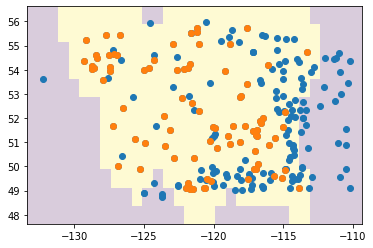

In [ ]:
#initialize

Npx = Nlat*Nlon

binary_in = np.zeros((Npx, Nstations))
inside_all_stations = [None] * len(stationInds)
outside_all_stations = [None] * len(stationInds)
radius = 1.

x = eraLon #rename for readability when making xx and xxv
y = eraLat
xx,yy = np.meshgrid(x,y)
xxv = xx.reshape(-1) #vector (array) where paired elements in xxv and yyv correspond to one pixel in heat map sensitivity space
yyv = yy.reshape(-1)

points = list(zip(xx.flatten(),yy.flatten())) #will loop through each point to see if sensitivity there is in/near or out/far from basins

#loop through each station and determine in/out points/sensitivity
for station in range(len(stationInds)):

  basin = stationBasins[station]
    
  #determine basin outlines  
  if basin is not None: #if basin polygon(s) exist -- some small basins do not have polygons from this source (see elif)
    xb,yb = basin.exterior.xy #lon/lat (x/y) points of watershed/basin boundary
  elif basin is None: #if basin shapefile is missing, use stream gauge location w/ radius buffer to estimate in/near pixels (these are small basins)
    xb = stationLon[stationInds][station] #basin outline taken to be single point at stream gauge
    yb = stationLat[stationInds][station]
    
  #create binary in/near (True) vs out/far (False)
  inside = np.zeros(np.size(Tmax[0])) #initialize inside/outside array
  for ii, point in enumerate(points): #for each point/pixel in ERA5 space
    d = np.sqrt((point[0] - xb)**2 + (point[1] - yb)**2) #distance from point in ERA5 to all points around basin
    if np.min(d) <= radius: #if the nearest basin edge to current point in ERA5 is less than prescribed allowable radius
      inside[ii] = True #then this point in ERA5 is considered 'inside' (or near) this basin

  inside_this_station = np.squeeze(np.argwhere(inside==True)) #array of indices which are inside this station's basin
  outside_this_station = np.squeeze(np.argwhere(inside==False)) #array of indices which are outside this station's basin

  inside_all_stations[station] = inside_this_station #list of arrays of indices which are inside/near each stations' basin
  outside_all_stations[station] = outside_this_station #list of arrays of indices which are outside/far each stations' basin

unique_in_stations = inside_all_stations

#find unique pixels in glacier-fed stations
stations_with_glaciers = np.squeeze(np.argwhere(stationPG>0))
unique_in_glaciers = []
for station in stations_with_glaciers:
  for ind in inside_all_stations[station]:
    unique_in_glaciers.append(ind)
unique_in_glaciers = list(set(unique_in_glaciers))

binary_glaciers = np.zeros(Npx)
binary_glaciers[unique_in_glaciers] = 1
binary_glaciers = binary_glaciers.reshape(Nlat,Nlon)

#make binary mask in/out for each basin
mask_stations = np.zeros((Nlat, Nlon, Nstations))
inds_all = np.arange(Npx).reshape(Nlat,Nlon)
for station in range(Nstations):
  dummy = np.zeros(Npx)
  dummy[unique_in_stations[station]] = 1
  mask_stations[:,:,station] = dummy.reshape(Nlat,Nlon)

fig, ax = plt.subplots()
ax.imshow(binary_glaciers, aspect = 'auto', alpha = 0.2, extent = extentERA)
ax.scatter(stationLon[stationInds], stationLat[stationInds])
ax.scatter(stationLon[stationInds][stations_with_glaciers], stationLat[stationInds][stations_with_glaciers])

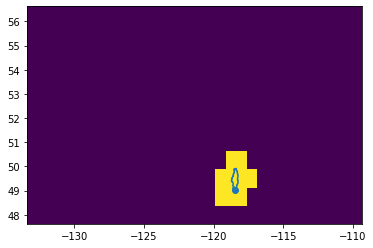

In [ ]:
station = 123

plt.imshow(mask_stations[:,:,station], aspect = 'auto', extent = extentERA)
plt.scatter(stationLon[stationInds][station], stationLat[stationInds][station])
plt.plot(stationBasins[station].exterior.xy[0],stationBasins[station].exterior.xy[1])

In [ ]:
Tmaxnorm_dymax_DJF_station = [None]*Nstations
Tminnorm_dymax_DJF_station = [None]*Nstations
Pnorm_dymax_DJF_station = [None]*Nstations

Tmaxnorm_dymax_MAM_station = [None]*Nstations
Tminnorm_dymax_MAM_station = [None]*Nstations
Pnorm_dymax_MAM_station = [None]*Nstations

Tmaxnorm_dymax_JJA_station = [None]*Nstations
Tminnorm_dymax_JJA_station = [None]*Nstations
Pnorm_dymax_JJA_station = [None]*Nstations

Tmaxnorm_dymax_SON_station = [None]*Nstations
Tminnorm_dymax_SON_station = [None]*Nstations
Pnorm_dymax_SON_station = [None]*Nstations

for station in range(Nstations):

  #DJF
  Tmaxnorm_dymax_DJF_station[station] = Tmaxnorm_dymax_DJF[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Tminnorm_dymax_DJF_station[station] = Tminnorm_dymax_DJF[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Pnorm_dymax_DJF_station[station] = Pnorm_dymax_DJF[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)

  #MAM
  Tmaxnorm_dymax_MAM_station[station] = Tmaxnorm_dymax_MAM[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Tminnorm_dymax_MAM_station[station] = Tminnorm_dymax_MAM[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Pnorm_dymax_MAM_station[station] = Pnorm_dymax_MAM[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)

  #JJA
  Tmaxnorm_dymax_JJA_station[station] = Tmaxnorm_dymax_JJA[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Tminnorm_dymax_JJA_station[station] = Tminnorm_dymax_JJA[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Pnorm_dymax_JJA_station[station] = Pnorm_dymax_JJA[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)

  #SON
  Tmaxnorm_dymax_SON_station[station] = Tmaxnorm_dymax_SON[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Tminnorm_dymax_SON_station[station] = Tminnorm_dymax_SON[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)
  Pnorm_dymax_SON_station[station] = Pnorm_dymax_SON[:,:,:,station][:,mask_stations[:,:,station]==1].mean(axis = 1)

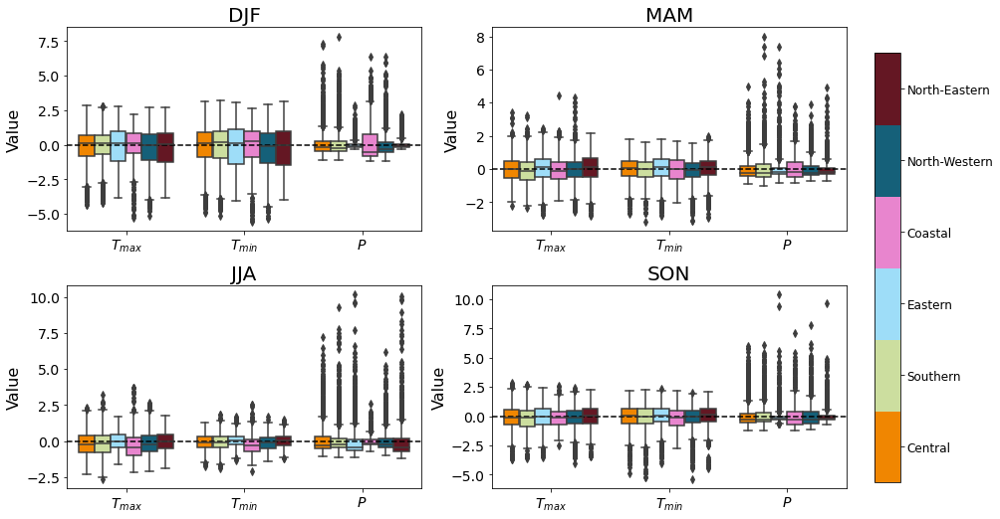

In [ ]:
#boxplot: all seasons + all clusters; all top values for all stations

saveIt = 0

xx = np.concatenate(np.array([kk*np.ones(N_top*Nstations) for kk in range(3)], dtype = 'object'))
hue = np.concatenate(np.array([np.tile(seasonal_clustering.labels_[station], N_top) for station in range(Nstations)], dtype = 'object'))
# hue = np.concatenate(np.array([cluster*np.ones(len(unique_in_clusters[cluster])) for cluster in range(n_clusters_seasonal)], dtype = 'object'))
hue = np.tile(hue,3)
bps = [None]*4 #empty list of boxplots

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (12,8))

#DJF
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_DJF_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_DJF_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_DJF_station[station] for station in range(Nstations)], dtype = 'object'))
    ))
bps[0] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,0])

#MAM
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_MAM_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_MAM_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_MAM_station[station] for station in range(Nstations)], dtype = 'object'))
    ))
bps[1] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,1])


#JJA
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_JJA_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_JJA_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_JJA_station[station] for station in range(Nstations)], dtype = 'object'))
    ))
bps[2] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,0])

#SON
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_SON_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_SON_station[station] for station in range(Nstations)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_SON_station[station] for station in range(Nstations)], dtype = 'object'))
    ))
bps[3] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,1])

titles = ['DJF','MAM','JJA','SON']
for kk, ax in enumerate(axes.flatten()):
  ax.plot([-0.5,2.5],[0,0], 'k--')
  ax.set_xlim(left = -0.5, right = 2.5)
  # ax.set_ylim(bottom = -0.85, top = 2.75)
  ax.set_title(titles[kk], fontsize = fs)
  ax.set_ylabel('Value', fontsize = fs - 4)
  ax.tick_params(labelsize = fs-6)

for bp in bps: #for each boxplot, colour the box according to its streamflow cluster

  bp.get_legend().remove()
  bp.set_xticklabels(labels = ['$T_{max}$', '$T_{min}$', '$P$'])

  kk = 0
  for jj in range(3):
    for cluster in range(n_clusters_seasonal):
      bp.artists[kk].set_facecolor(rgbs_array[cluster])
      kk+=1

fig.tight_layout(rect=[0, 0.03, 1, 0.95])

cmap = matplotlib.colors.ListedColormap(rgbs_array)
bounds = [0,1,2,3,4,5,6]
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
s = plt.scatter([10,11,12,14,15],[0,0,0,0,0], c=[0,1,2,4,5], cmap = cmap, norm = norm) #just for colourmap
cb_ax = fig.add_axes([1.02,0.1,0.03,0.75])
cb = fig.colorbar(s, cax = cb_ax)
cb.set_ticks(np.arange(0.5,6.5,1))
cb.set_ticklabels(['Central', 'Southern', 'Eastern', 'Coastal', 'North-Western', 'North-Eastern'])
cb.ax.tick_params(labelsize = fs-8)

# plt.tight_layout()

if saveIt:
  # plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'top.png', dpi = 300, bbox_inches = 'tight')
  plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'random.png', dpi = 300, bbox_inches = 'tight')

plt.show()

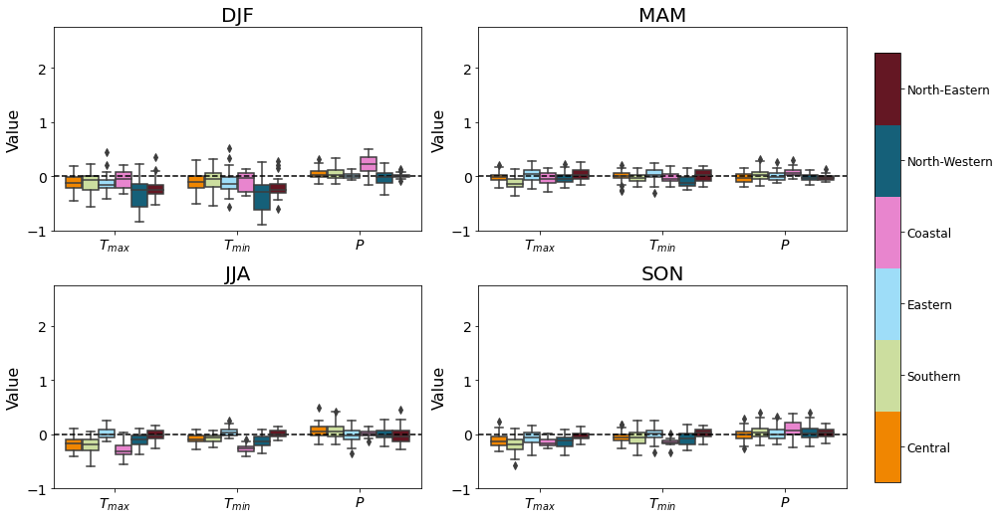

In [ ]:
#boxplot: all seasons + all clusters; mean of top values for all stations

saveIt = 0

xx = np.concatenate(np.array([kk*np.ones(Nstations) for kk in range(3)], dtype = 'object'))
hue = seasonal_clustering.labels_
hue = np.tile(hue,3)
bps = [None]*4 #empty list of boxplots

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (12,8))

#DJF
yy = np.concatenate(
    (np.array([Tmaxnorm_dymax_DJF_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Tminnorm_dymax_DJF_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Pnorm_dymax_DJF_station[station].mean() for station in range(Nstations)], dtype = 'object')
    ))
bps[0] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,0])

#MAM
yy = np.concatenate(
    (np.array([Tmaxnorm_dymax_MAM_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Tminnorm_dymax_MAM_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Pnorm_dymax_MAM_station[station].mean() for station in range(Nstations)], dtype = 'object')
    ))
bps[1] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,1])


#JJA
yy = np.concatenate(
    (np.array([Tmaxnorm_dymax_JJA_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Tminnorm_dymax_JJA_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Pnorm_dymax_JJA_station[station].mean() for station in range(Nstations)], dtype = 'object')
    ))
bps[2] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,0])

#SON
yy = np.concatenate(
    (np.array([Tmaxnorm_dymax_SON_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Tminnorm_dymax_SON_station[station].mean() for station in range(Nstations)], dtype = 'object'),
     np.array([Pnorm_dymax_SON_station[station].mean() for station in range(Nstations)], dtype = 'object')
    ))
bps[3] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,1])

titles = ['DJF','MAM','JJA','SON']
for kk, ax in enumerate(axes.flatten()):
  ax.plot([-0.5,2.5],[0,0], 'k--')
  ax.set_xlim(left = -0.5, right = 2.5)
  ax.set_ylim(bottom = -1, top = 2.75)
  ax.set_title(titles[kk], fontsize = fs)
  ax.set_ylabel('Value', fontsize = fs - 4)
  ax.tick_params(labelsize = fs-6)

for bp in bps: #for each boxplot, colour the box according to its streamflow cluster

  bp.get_legend().remove()
  bp.set_xticklabels(labels = ['$T_{max}$', '$T_{min}$', '$P$'])

  kk = 0
  for jj in range(3):
    for cluster in range(n_clusters_seasonal):
      bp.artists[kk].set_facecolor(rgbs_array[cluster])
      kk+=1

fig.tight_layout(rect=[0, 0.03, 1, 0.95])

cmap = matplotlib.colors.ListedColormap(rgbs_array)
bounds = [0,1,2,3,4,5,6]
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
s = plt.scatter([10,11,12,14,15],[0,0,0,0,0], c=[0,1,2,4,5], cmap = cmap, norm = norm) #just for colourmap
cb_ax = fig.add_axes([1.02,0.1,0.03,0.75])
cb = fig.colorbar(s, cax = cb_ax)
cb.set_ticks(np.arange(0.5,6.5,1))
cb.set_ticklabels(['Central', 'Southern', 'Eastern', 'Coastal', 'North-Western', 'North-Eastern'])
cb.ax.tick_params(labelsize = fs-8)

# plt.tight_layout()

if saveIt:
  # plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'top.png', dpi = 300, bbox_inches = 'tight')
  plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'random.png', dpi = 300, bbox_inches = 'tight')

plt.show()

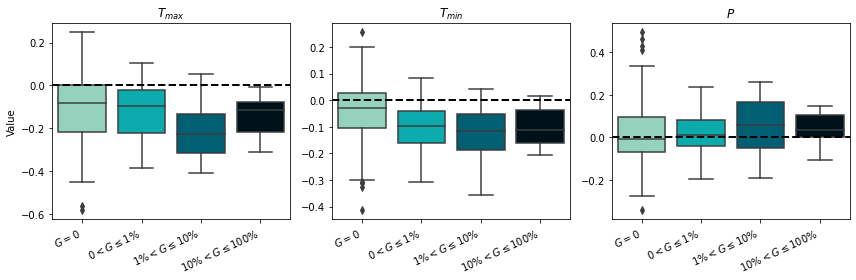

In [ ]:
#boxplot: mean antecedent weather values associated with flow increases as a function of glacier cover

rgbs_glacier = np.array([[148, 210, 189],
                         [11, 170, 173],
                         [0, 95, 115],
                         [0, 18, 25]]) / 255

no_PG = np.squeeze(np.argwhere(stationPG == 0))
low_PG = np.squeeze(np.argwhere((stationPG >     0) &
                     (stationPG <= 1e-2)))
mod_PG = np.squeeze(np.argwhere((stationPG >  1e-2) &
                     (stationPG <= 1e-1)))
high_PG = np.squeeze(np.argwhere((stationPG > 1e-1) &
                     (stationPG <= 1e0)))

N_no_PG = len(no_PG)
N_low_PG = len(low_PG)
N_mod_PG = len(mod_PG)
N_high_PG = len(high_PG)

xx = np.concatenate([['$G=0$']*N_no_PG, ['$0<G\leq1\%$']*N_low_PG, ['$1\%<G\leq10\%$']*N_mod_PG, ['$10\%<G\leq100\%$']*N_high_PG]) 

var = Tminnorm_dymax_JJA_station
var = Pnorm_dymax_JJA_station
vars = [Tmaxnorm_dymax_JJA_station, Tminnorm_dymax_JJA_station, Pnorm_dymax_JJA_station]

titles = ['$T_{max}$', '$T_{min}$', '$P$']

nrows = 1
ncols = 3
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for kk, ax in enumerate(axes):

  yy = np.concatenate(np.array([
                                np.array([vars[kk][station].mean() for station in no_PG]),
                                np.array([vars[kk][station].mean() for station in low_PG]),
                                np.array([vars[kk][station].mean() for station in mod_PG]),
                                np.array([vars[kk][station].mean() for station in high_PG])
  ], dtype = 'object'))

  positions = list(np.linspace(0,5,4))
  bp = sns.boxplot(x = xx, y = yy, ax = ax)

  #dashed line at 0
  ax.plot(np.linspace(-0.5,3.5,10), np.zeros(10), color = 'k', linestyle = '--', linewidth = 2)

  ax.set_title(titles[kk])
  if kk == 0:
    ax.set_ylabel('Value')
  ax.set_xticklabels(labels = ax.get_xticklabels(), rotation = 25, ha = 'right')

  #colour the boxplot faces
  for kk in range(4):
      bp.artists[kk].set_facecolor(rgbs_glacier[kk,:])

plt.tight_layout()

# Heat maps: Through time, Linear Model

In [ ]:
def make_heat_linear(model, x_test, y_test, style_dict, days, iters_total, iters_one_pass, stationInds, verbose, tol):

  """
  model: 
      .h5 keras model (linear ANN)
  x_test:
      tf tensor; test set of ERA data, input to model (shape = Ntest x 365 x height x width x channels --> each observation then flattened w/i the function before being passed through the model)
  y_test:
      tf tensor; test set of streamflow data, target output of model (shape = Ntest x Nstations)
  style_dict:
      dictionary: {'style' : 'RISE' or 'gauss',
                   'params' : [h,w,p_1] or sigma}
          where [h,w,p_1] are the height/width/probability of perturbation of low-res mask (for RISE algorithm); sigma is the gaussian RMS width
  days:
      range of days in test set to perturb (e.g. days = range(0,365) will perturb the first 365 days in the test set)
  iters_total:
      number of total iterations of perturbation to do for each day in days
  iters_one_pass:
      number of iterations to do at one time (typically less than iters_total for memory limits)
  stationInds:
      indices of stations corresponding to the output neurons of the keras model
  verbose:
      0: print nothing
      1: print every 50th day
  tol:
      relative error threshold (when to stop pertubing model)
  """

  #initialize heat map as 3D numpy array: lat x lon x station
  heat_mean = np.zeros((32*12, len(stationInds)))

  n_channels = 3#np.shape(x_test)[-1] #number of channels of input video
  H = 12#np.shape(x_test)[2] #height of input video, in pixels (latitude)
  W = 32#np.shape(x_test)[3] #width of input video, in pixels (longitude)

  heat_prev = np.zeros((H*W,len(stationInds))) #initially, the previous heat map is 0's (for first pass)
  heat_curr = np.zeros((H*W,len(stationInds))) #also initialize the current heat map as 0's (will fill once calculated at end of first pass)
  kk = 0
  err = tol+1 #just to enter while loop
  while err > tol:
    
    # print(kk)
    #loop through specified days to generate mean sensitivity
    for day in days: #for each day that we will perturb

      #state progress
      if verbose:
        if np.mod(day,50)==0:
          print(' Day ' + str(day) + '/' + str(len(days))) 

      #number of iterations of perturbations for one forward pass through model
      iters = iters_one_pass 

      #define perturbation: rectangular as from RISE, or gaussian 
      if style_dict['style'] == 'RISE':
    
        h = style_dict['params'][0]
        w = style_dict['params'][1]
        p_1 = style_dict['params'][2]

        x_int = np.linspace(0,W,w) #low-res x indices
        y_int = np.linspace(0,H,h) #low-res y indices

        xnew = np.arange(W)
        ynew = np.arange(H) 

        perturb_small = np.random.choice([0,1],size = (iters,1,h,w), p = [1-p_1,p_1]) #binary perturbation on coarse grid
        perturb = np.half([interpolate.interp2d(x_int,y_int,perturb_small[iter][0])(xnew,ynew) for iter in range(iters)]) #perturbation is interpolated to finer grid

      elif style_dict['style'] == 'gauss':

        sigma = style_dict['params']

        x_int = np.arange(W)
        y_int = np.arange(H)
        x_mesh, y_mesh = np.meshgrid(x_int, y_int)

        #define gaussian perturbation for each iteration being passed
        perturb = np.half([np.exp( - ( (x_mesh - np.random.randint(0,W))**2 + (y_mesh - np.random.randint(0,H))**2 ) / (2*sigma**2) ) for iter in range(iters)])

      #copy/expand dimensions of the perturbation to be added to weather video

      perturb_2D = np.copy(perturb) #the 2D perturbation for each iteration of this pass
      perturb = tf.repeat(tf.expand_dims(tf.convert_to_tensor(perturb),3),nchannels, axis = 3) #expand along channels in one image
      perturb = tf.repeat(tf.expand_dims(tf.convert_to_tensor(perturb),1),365, axis = 1) #expand along images in one video

      xday = x_test[day] #current day in test set
      xday_iters = [xday for val in range(iters)] #repeat for each iteration (e.g. make copy for each perturbation)

      factor = np.random.choice([-1,1],p = [0.5,0.5]).astype('float16') #whether to add or subtract perturbation from input video, 50-50 chance of each
      perturb = factor*perturb

      x1 = perturb
      x2 = tf.convert_to_tensor(xday_iters)
      xday_iters_perturb = tf.math.add(x1,x2)

      x_all = tf.squeeze(tf.concat((tf.expand_dims(xday, axis = 0),xday_iters_perturb), axis = 0)) #'all' refers to original (xday) and perturbed (xday_iters_perturb)
      
      n_obs = tf.shape(x_all)[0]
      n_dims = tf.size(x_all[0])
      x_all_flat = np.zeros((n_obs, n_dims))
      for ob in range(n_obs):
        x_all_flat[ob,:] = tf.convert_to_tensor(np.array(x_all[ob]).flatten())
      
      x_all_ds = tf.data.Dataset.from_tensor_slices(x_all_flat).batch(batch_size = 64)
      y_all = model.predict(x_all_ds)

      yday = y_all[0] #first element is unperturbed model prediction
      yday_perturb = y_all[1:] #all others are perturbed model predictions for each iteration of perturbation

      for station in range(np.shape(y_all)[1]): #for each station, calculate heat map of sensitivity from sensitivty = |deltaQ| * perturbation

        yday_station = yday[station] #original unperturbed model prediction
        yday_station_perturb = yday_perturb[:,station]

        ydiffs = np.abs(np.reshape(yday_station - yday_station_perturb[:iters],(-1,1))) #magnitude difference between perturbed and unperturbed streamflow
        delta = np.ones((len(ydiffs),H,W)) * ydiffs[:,None] #get dimensions to match so delta can be multiplied by perturbation

        heat_iters = np.asarray(delta[:iters]) * np.asarray(perturb_2D)
        heat = np.mean(heat_iters[:iters], axis=0) 

        heat_mean[:,station] += heat.flatten() 

      del heat, heat_iters, delta, ydiffs, x_all, xday_iters #delete for memory

    n_iters = iters_one_pass*(kk+1)
    heat_curr = np.copy(heat_mean) / n_iters
    err = np.mean(np.abs(heat_curr - heat_prev)) / np.mean(heat_prev)

    heat_prev = np.copy(heat_curr)

    kk += 1

  heat_mean = heat_mean /(iters_total * len(days))

  return heat_mean

In [ ]:
print('hi')

hi


In [ ]:
load_heat = 0
load_heat_runs = 0

#set of random seeds to use for reproducability
seeds = [00, 11, 22, 33, 44, 55, 66, 77, 88, 99]
Nmodels = 10

#parameters for heat maps
sigma = 1.5 #radius of perturbation
style_dict = {'style' : 'gauss', #style of perturbation: gaussian (not RISE/rectangular)
              'params' : sigma}
days_heat = np.arange(Ntest)#range(Ntest) #days in test set to perturb
days_heat = np.arange(365)
iters_total = 200 #total iterations of perturbation
iters_one_pass = 20 #number of iterations to pass through model at one time (too high --> RAM issues)
tol = 1e-1

Nlat = 12#np.shape(Tmax)[1]
Nlon = 32#np.shape(Tmax)[2]
Npx = Nlat*Nlon
Ndays = len(days_heat)
Nstations = len(stationInds)

heat_fine = np.zeros((Npx*Ndays-1, Nstations, Nmodels), dtype = np.float16)
heat_fine = np.zeros((Npx*Ndays, Nstations, Nmodels), dtype = np.float16)

if not load_heat:

  #for each random seed (one seed = one bulk / set of fine-tuned models; 10 seeds --> 10 model ensemble)
  for ii, s in enumerate(seeds[:Nmodels]):

    if ii > -1:

    ##### FINE-TUNING

      print('Model ' + str(ii+1))

      #prep fine-tune target output
      y_test_predict_fine_all = np.empty_like(y_test)

      #for each streamflow cluster, make/train/save fine-tuned model/output/heatmaps  

      for cluster in range(n_clusters_seasonal):

        print(' Cluster ' + str(cluster+1) + ' / ' + str(n_clusters_seasonal))

        #load model 
        model_name = 'model_linear_' + str(ii) + '_cluster_' + str(cluster) + '.h5'
        model_fine = tf.keras.models.load_model(dir_models + '/' + model_name)

        stations_fine = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster
        N_stations = len(stations_fine) #number of stations in this cluster
        
        #create target datasets (note: x is the same, y is different (same spatial input, different station targets))
        y_test_fine_current = tf.convert_to_tensor(y_test.numpy()[:,stations_fine])

        #for each day to perturb
        # print(' Making heat maps')
        for day in range(Ndays):

          #generate fine-tuned heat maps
          # print('   Day: ' + str(day+1) + ' / ' + str(Ndays))
          # xx = tf.convert_to_tensor(np.array(x_test[day]).flatten())
          xx = x_test[day]
          heat_mean_cluster = make_heat_linear(
              model = model_fine, 
              x_test = tf.expand_dims(xx, axis = 0), 
              y_test = tf.expand_dims(y_test[day], axis = 0), 
              style_dict = style_dict, 
              days = np.array([0]), 
              iters_total = iters_total, 
              iters_one_pass = iters_one_pass, 
              stationInds = stations_fine,
              verbose = 0,
              tol = tol
              )
          
          for zz,station in enumerate(stations_fine): #reorganize heatmaps into array that matches the bulk heatmap order (e.g. heat_mean_fine[:,0] and heat_mean_bulk[:,0] are the same station)
            heat_fine[Npx*day:Npx*(day+1),station,ii] = heat_mean_cluster[:,zz]

      #save fine-tuned heatmaps
      fileName = 'heat_mean_fine_series_linear' + str(ii) + '.csv'
      np.savetxt(dir_heat + '/series/' + fileName, heat_fine[:,:,ii], delimiter = ',')

    heat_mean_fine = np.mean(heat_fine, axis = -1)

else:

  if not load_heat_runs:
    filename = 'heat_mean_fine_series_linear.csv'
    heat_mean_fine = pd.read_csv(dir_heat + '/series/' + filename, header = None).values

if load_heat_runs:

  for ii in range(10):
    print(ii)
    filename = 'heat_mean_fine_series_linear' + str(ii) + '.csv'
    heat_fine[:,:,ii] = pd.read_csv(dir_heat + '/series/' + filename, header = None).values[:Ndays*Npx,:]
  heat_mean_fine = np.mean(heat_fine, axis = -1)


Model 1
 Cluster 1 / 6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:128: RuntimeWarning: divide by zero encountered in double_scalars


 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 2
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 3
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 4
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 5
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 6
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 7
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 8
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 9
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6
Model 10
 Cluster 1 / 6
 Cluster 2 / 6
 Cluster 3 / 6
 Cluster 4 / 6
 Cluster 5 / 6
 Cluster 6 / 6


In [ ]:
saveIt = 0
if saveIt:
  fileName = 'heat_mean_fine_series.csv'
  np.savetxt(dir_heat + '/' + fileName, heat_mean_fine, delimiter = ',')

In [ ]:
#calculate sensitive area A, max sensitivity S, and location (lat/lon) of maximum sensitivity

lonn, latt = np.meshgrid(eraLon,eraLat)
lat_flat = latt.flatten()
lon_flat = lonn.flatten()

A_daily = np.zeros((Ndays, Nstations))
S_daily = np.zeros((Ndays, Nstations))
lat_daily  = np.zeros((Ndays, Nstations))
lon_daily  = np.zeros((Ndays, Nstations))
for day in range(Ndays):
  for station in range(Nstations):
    heat = heat_mean_fine[Npx*day:Npx*(day+1), station]
    A_daily[day,station] = get_A(heat)
    S_daily[day,station] = np.max(heat)
    max_ind = np.argmax(heat)
    lat_daily[day,station] = lat_flat[max_ind]
    lon_daily[day,station] = lon_flat[max_ind]

A_daily_cluster_mean = np.zeros((Ndays, n_clusters_seasonal))
A_daily_cluster_std = np.zeros((Ndays, n_clusters_seasonal))
S_daily_cluster_mean = np.zeros((Ndays, n_clusters_seasonal))
S_daily_cluster_std = np.zeros((Ndays, n_clusters_seasonal))
lat_daily_cluster_mean  = np.zeros((Ndays, n_clusters_seasonal))
lon_daily_cluster_mean  = np.zeros((Ndays, n_clusters_seasonal))
for cluster in range(n_clusters_seasonal):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  A_daily_cluster_mean[:,cluster] = np.mean(A_daily[:,inds], axis = -1)
  A_daily_cluster_std[:,cluster] = np.std(A_daily[:,inds], axis = -1)
  S_daily_cluster_mean[:,cluster] = np.mean(S_daily[:,inds], axis = -1)
  S_daily_cluster_std[:,cluster] = np.std(S_daily[:,inds], axis = -1)
  lat_daily_cluster_mean[:,cluster] = np.mean(lat_daily[:,inds], axis = -1)
  lon_daily_cluster_mean[:,cluster] = np.mean(lon_daily[:,inds], axis = -1)

In [ ]:
#smooth

window = 7
kernel = np.ones(window) / window

for station in range(Nstations):

  A_daily[:,station] = np.convolve(A_daily[:,station], kernel, mode = 'same')
  S_daily[:,station] = np.convolve(S_daily[:,station], kernel, mode = 'same')
  lat_daily[:,station] = np.convolve(lat_daily[:,station], kernel, mode = 'same')
  lon_daily[:,station] = np.convolve(lon_daily[:,station], kernel, mode = 'same')

for cluster in range(n_clusters_seasonal):

  A_daily_cluster_mean[:,cluster] = np.convolve(A_daily_cluster_mean[:,cluster], kernel, mode = 'same')
  S_daily_cluster_mean[:,cluster] = np.convolve(S_daily_cluster_mean[:,cluster], kernel, mode = 'same')

  A_daily_cluster_std[:,cluster] = np.convolve(A_daily_cluster_std[:,cluster], kernel, mode = 'same')
  S_daily_cluster_std[:,cluster] = np.convolve(S_daily_cluster_std[:,cluster], kernel, mode = 'same')

  lat_daily_cluster_mean[:,cluster] = np.convolve(lat_daily_cluster_mean[:,cluster], kernel, mode = 'same')
  lon_daily_cluster_mean[:,cluster] = np.convolve(lon_daily_cluster_mean[:,cluster], kernel, mode = 'same')

wedge = int((window - 1)/2)

A_daily = A_daily[wedge:-wedge]
S_daily = S_daily[wedge:-wedge]

A_daily_cluster_mean = A_daily_cluster_mean[wedge:-wedge]
S_daily_cluster_mean = S_daily_cluster_mean[wedge:-wedge]

A_daily_cluster_std = A_daily_cluster_std[wedge:-wedge]
S_daily_cluster_std = S_daily_cluster_std[wedge:-wedge]

lat_daily_cluster_mean = lat_daily_cluster_mean[wedge:-wedge]
lon_daily_cluster_mean = lon_daily_cluster_mean[wedge:-wedge]


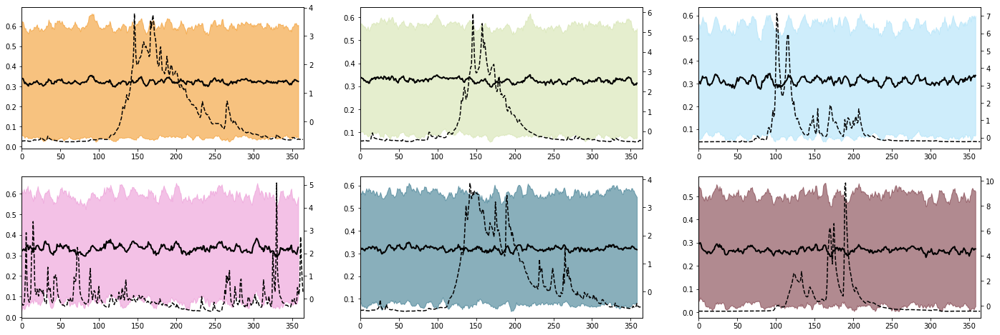

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = A_daily_cluster_mean[:,cluster] + 2*A_daily_cluster_std[:,cluster]
  y2 = A_daily_cluster_mean[:,cluster] - 2*A_daily_cluster_std[:,cluster]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(A_daily_cluster_mean[:,cluster], 'k', linewidth = 2)
  ax.set_xlim(right = 365, left = 0)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

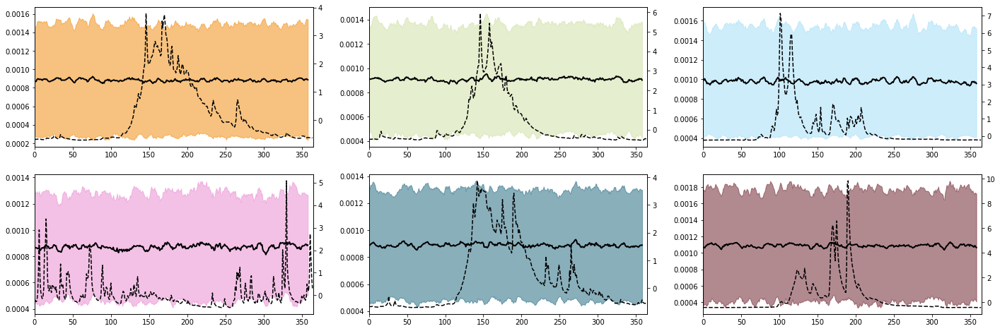

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = S_daily_cluster_mean[:,cluster] + 2*S_daily_cluster_std[:,cluster]
  y2 = S_daily_cluster_mean[:,cluster] - 2*S_daily_cluster_std[:,cluster]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(S_daily_cluster_mean[:,cluster], 'k', linewidth = 2)
  ax.set_xlim(right = 365, left = 0)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

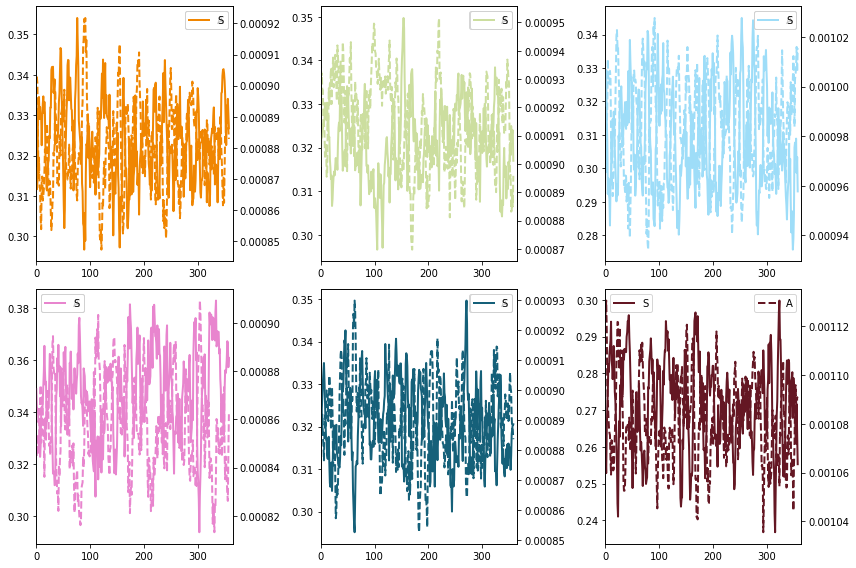

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(A_daily_cluster_mean[:,cluster], color = rgbas_array[cluster,:], linewidth = 2, label = 'A', linestyle = '--')
  ax.set_xlim(right = 365, left = 0)
  ax2 = ax.twinx()
  ax2.plot(S_daily_cluster_mean[:,cluster], color = rgbas_array[cluster,:], linewidth = 2, label = 'S')
  ax.legend()
  ax2.legend()

plt.tight_layout()

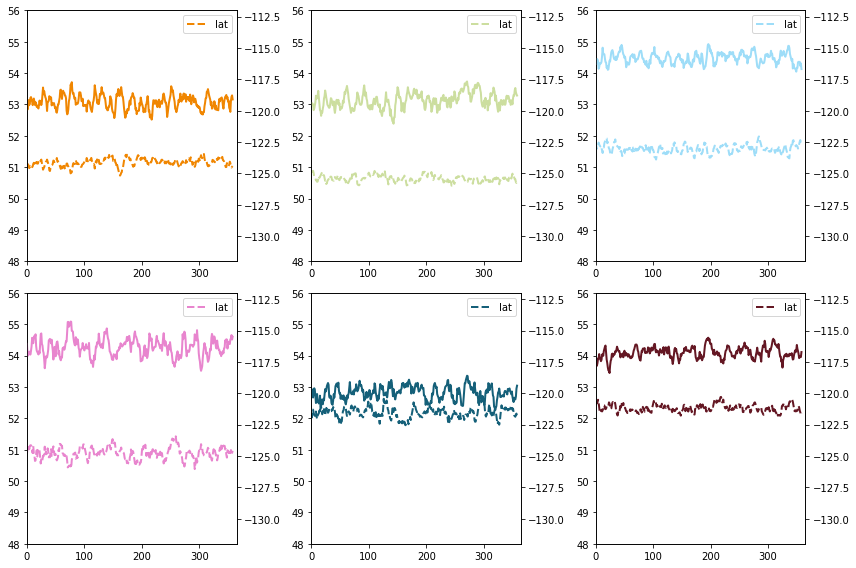

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(lat_daily_cluster_mean[:,cluster], color = rgbas_array[cluster,:], linewidth = 2, label = 'lat', linestyle = '--')
  ax.set_xlim(right = 365, left = 0)
  ax2 = ax.twinx()
  ax2.plot(lon_daily_cluster_mean[:,cluster], color = rgbas_array[cluster,:], linewidth = 2, label = 'lon')
  ax.legend()
  # ax2.legend()

  ax.set_ylim((48,56))
  ax2.set_ylim((-132, -112))

plt.tight_layout()

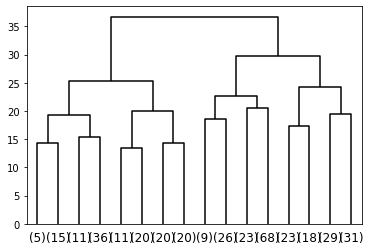

In [ ]:
cluster_seasonal = 0

#input: lat/lon of max sensitivity
cluster_input = np.vstack([lat_daily_cluster_mean[:,cluster_seasonal], lon_daily_cluster_mean[:,cluster_seasonal]]).T
cluster_input = (cluster_input - np.mean(cluster_input, axis = 0)) / np.std(cluster_input, axis = 0)

#input: normalized heat maps
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(-1,Npx)
var = np.double(heat_mean_fine_cluster)
heat_mean_fine_cluster_norm = (heat_mean_fine_cluster - np.expand_dims(np.mean(var, axis = -1), axis = -1)) / np.expand_dims(np.std(var, axis = -1), axis = -1)
cluster_input = np.double(heat_mean_fine_cluster_norm)

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(cluster_input)

# plot the top levels of the dendrogram
d = plot_dendrogram(model, truncate_mode='level', p=3, color_threshold = 0, above_threshold_color = 'k')

In [ ]:
n_clusters = 2
model = AgglomerativeClustering(n_clusters = n_clusters).fit(cluster_input)
labels = model.labels_

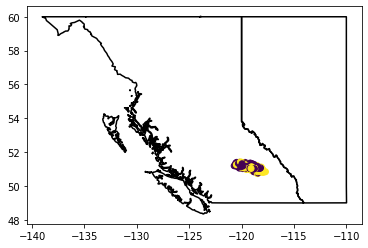

In [ ]:
fig, ax = plt.subplots()
plot_prov_ax(prov, ax)
ax.scatter(lon_daily_cluster_mean[:,cluster_seasonal], lat_daily_cluster_mean[:,cluster_seasonal], c = labels[wedge:-wedge])

In [ ]:
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays,Npx)

cluster_heat = np.zeros((n_clusters, Npx))
for cluster in range(n_clusters):
  days = np.squeeze(np.argwhere(labels==cluster))
  cluster_heat[cluster,:] = np.mean(heat_mean_fine_cluster[days,:], axis = 0)


(0.0, 365.0)

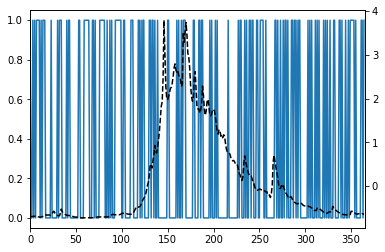

In [ ]:
fig, ax = plt.subplots()
ax.plot(labels)
flow = np.mean(np.array(y_test)[:Ndays,inds], axis = -1)
ax2 = ax.twinx()
ax2.plot(flow,'k--')

ax.set_xlim(left = 0, right = 365)

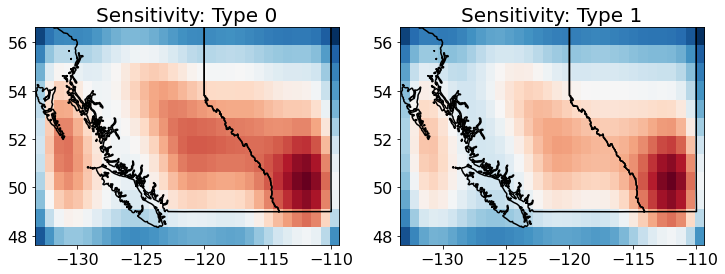

In [ ]:
saveIt = 0

nrows = 1
ncols = n_clusters

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (6*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  vmax = np.max(cluster_heat[cluster])
  vmin = np.min(cluster_heat[cluster])
  # vmax = np.max(cluster_heat)
  # vmin = np.min(cluster_heat)
  ax.imshow(cluster_heat[cluster,:].reshape(Nlat,Nlon), aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax, cmap = 'RdBu_r')
  plot_prov_ax(prov, ax)
  ax.set_xlim(left = extentERA[0], right = extentERA[1])
  ax.set_ylim(bottom = extentERA[2], top = extentERA[3])
  ax.set_title('Sensitivity: Type ' + str(cluster), fontsize = fs)
  ax.tick_params(labelsize = fs-4)

if saveIt: 
  plt.savefig('sensitivity_clusters.png', bbox_inches = 'tight', dpi = 300)

In [ ]:
#loop through all seasonal clusters, then cluster heat maps, then characterize active 
n_clusters_heat_all = [2,2,2,3,3,2]
n_clusters_heat_all = [2,2,2,2,2,2]
# n_clusters_heat_all = [3,3,3,3,3,3]

heat_all = np.zeros((n_clusters_seasonal, np.max(n_clusters_heat_all), Npx))
labels_all = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
heat_mean_active = np.zeros((n_clusters_seasonal, Npx))
heat_mean_dormant = np.zeros((n_clusters_seasonal, Npx))
labels_binary = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
flow_clusters = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))

for cluster_seasonal, n_clusters_heat in enumerate(n_clusters_heat_all):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

  # #cluster input: latitude/longitude of sensitivity maximum
  # cluster_input = np.vstack([lat_daily_cluster_mean[:,cluster_seasonal], lon_daily_cluster_mean[:,cluster_seasonal]]).T
  # cluster_input = (cluster_input - np.mean(cluster_input, axis = 0)) / np.std(cluster_input, axis = 0)

  #input: normalized heat maps
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(-1,Npx)
  var = np.double(heat_mean_fine_cluster)
  heat_mean_fine_cluster_norm = (heat_mean_fine_cluster - np.expand_dims(np.mean(var, axis = -1), axis = -1)) / np.expand_dims(np.std(var, axis = -1), axis = -1)
  cluster_input = heat_mean_fine_cluster_norm

  #cluster by heat maximum location
  model = AgglomerativeClustering(n_clusters = n_clusters_heat).fit(cluster_input)
  labels = model.labels_
  labels_all[cluster_seasonal] = np.copy(labels)

  #calculate mean flow of each location cluster
  flow = np.mean(np.array(y_test)[wedge:Ndays-wedge,inds], axis = -1)
  flow_cluster_mean = np.zeros(n_clusters_heat)
  for cluster_heat in range(n_clusters_heat):
    inds_labels = np.squeeze(np.argwhere(labels == cluster_heat))
    flow_cluster_mean[cluster_heat] = np.mean(flow[inds_labels])
  ind_heat_active = np.argmax(flow_cluster_mean) #index of the heat map / location cluster with the highest average flow
  ind_heat_dormant = np.squeeze(np.argwhere(np.arange(n_clusters_heat) != ind_heat_active))

  #sort labels from low to high flow
  sorted = np.argsort(flow_cluster_mean)
  labels_sorted = np.zeros(np.shape(labels))
  for kk in range(n_clusters_heat):
    labels_sorted[labels==sorted[kk]] = kk 
  labels_all[cluster_seasonal,:] = labels_sorted
  labels = labels_sorted

  #calculate average heat map of each location cluster
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays,Npx)
  cluster_heat = np.zeros((n_clusters_heat, Npx))
  for cluster in range(n_clusters_heat):
    days = np.squeeze(np.argwhere(labels==cluster))
    cluster_heat[cluster,:] = np.mean(heat_mean_fine_cluster[days,:], axis = 0)
    heat_all[cluster_seasonal, cluster,:] = np.copy(cluster_heat[cluster,:])

  heat_mean_active[cluster_seasonal,:] = cluster_heat[ind_heat_active,:]
  if np.size(ind_heat_dormant)>1:
    heat_mean_dormant[cluster_seasonal,:] = np.mean(cluster_heat[ind_heat_dormant,:], axis = 0)
  else:
    heat_mean_dormant[cluster_seasonal,:] = cluster_heat[ind_heat_dormant,:]

  labels_binary[cluster_seasonal, labels == ind_heat_active] = 1 #1: active, 0: dormant
  flow_clusters[cluster_seasonal, :] = flow

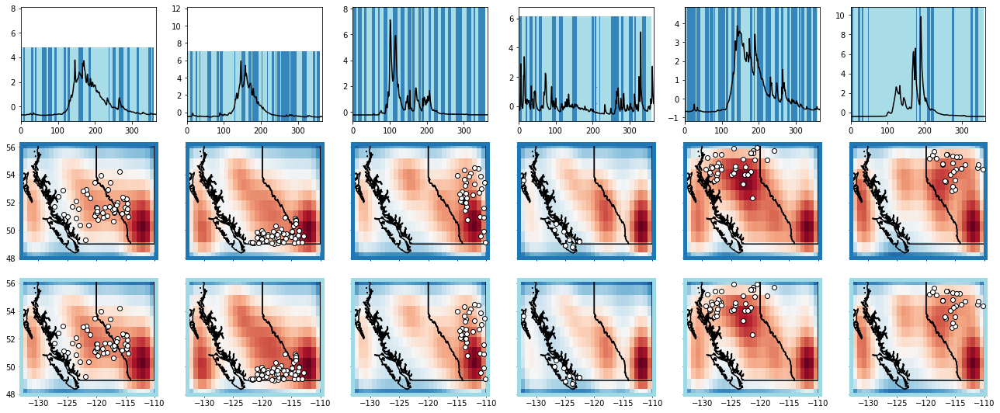

In [ ]:
#figure: row 1: cluster labels through time + flow, other rows: heat clusters; columns are streamflow clusters 
nrows = np.max(n_clusters_heat_all)+1
ncols = n_clusters_seasonal

year = 0

#make discrete colourmap for label imshow
# cmap = colors.ListedColormap(['white', 'red'])
cmap = cm.get_cmap('tab20')
bounds = np.arange(-0.5, np.max(n_clusters_heat_all))
norm = colors.BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster_seasonal in range(n_clusters_seasonal):

  #label
  # ax_label = axes[0,cluster_seasonal].twinx()
  ymax = np.max(flow_clusters[cluster_seasonal,:])+1.0
  ymin = np.min(flow_clusters[cluster_seasonal,:])-0.5
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  axes[0,cluster_seasonal].imshow(np.expand_dims(labels_all[cluster_seasonal,:], axis=0), extent = extent, 
                  aspect = 'auto', alpha = .9, cmap = cmap, norm = norm, zorder = -1)
  axes[0,cluster_seasonal].tick_params(labelright = False, right = False)

  #flow
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  axes[0,cluster_seasonal].plot(np.mean(np.array(y_test)[:,inds], axis = -1), 'k', zorder = 2)
  axes[0,cluster_seasonal].set_xlim(left = year*365, right = (year+1)*365)

  for cluster_heat in range(n_clusters_heat_all[cluster_seasonal]):

    axes[cluster_heat+1,cluster_seasonal].imshow(heat_all[cluster_seasonal, cluster_heat,:].reshape(Nlat,Nlon), cmap = 'RdBu_r', aspect = 'auto', extent = extentERA)
    plot_prov_ax(prov, axes[cluster_heat+1,cluster_seasonal])
    axes[cluster_heat+1,cluster_seasonal].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)
    axes[cluster_heat+1,cluster_seasonal].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[cluster_heat+1,cluster_seasonal].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))
    plt.setp(axes[cluster_heat+1,cluster_seasonal].spines.values(), color = cmap(norm(cluster_heat)), linewidth = 5)

    if cluster_heat < n_clusters_heat_all[cluster_seasonal]-1:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelbottom = False)
  
    if cluster_seasonal > 0:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelleft = False)

plt.tight_layout()

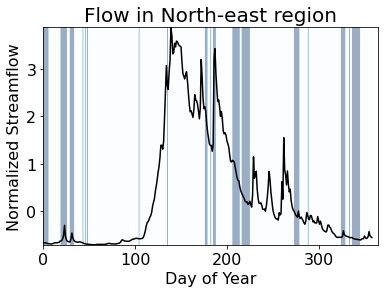

In [ ]:
saveIt = 0

cluster_seasonal = 4

fig, ax = plt.subplots(figsize = (6,4))

inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

ymax = np.max(flow_clusters[cluster_seasonal,:])
ymin = np.min(flow_clusters[cluster_seasonal,:])
xmin = 0
xmax = Ndays-2*wedge
extent = [xmin, xmax, ymin, ymax]
ax.imshow(np.expand_dims(labels, axis=0), extent = extent, aspect = 'auto', alpha = 0.4, cmap = 'Blues_r')
ax.plot(flow_clusters[cluster_seasonal,:], color = 'k')
# ax.plot(flow_cluster_predict, 'k--')
ax.set_xlim(left = 0, right = 365)
ax.set_ylim(bottom = ymin, top = ymax)
ax.set_xlabel('Day of Year', fontsize = fs-4)
ax.set_ylabel('Normalized Streamflow', fontsize = fs-4)
ax.set_title('Flow in North-east region', fontsize = fs)
ax.tick_params(labelsize = fs-4)

if saveIt: 
  plt.savefig('sensitivity_flow_time.png', bbox_inches = 'tight', dpi = 300)

In [ ]:
#calculate for fine-tuned ensemble mean heat map
data = heat_mean_active
data_mean = data.mean(axis=0)
data_std = data.std(axis=0)
data_norm = np.asarray([(data[:,kk] - data_mean[kk]) / data_std[kk] for kk in range(len(stationInds))]).T

In [ ]:
#initialize
heat_in_clusters_active = [None] * n_clusters_seasonal
heat_out_clusters_active = [None] * n_clusters_seasonal
heat_in_clusters_dormant = [None] * n_clusters_seasonal
heat_out_clusters_dormant = [None] * n_clusters_seasonal
inside_all_stations = [None] * len(stationInds)
outside_all_stations = [None] * len(stationInds)
radius = 1.

x = eraLon #rename for readability when making xx and xxv
y = eraLat
xx,yy = np.meshgrid(x,y)
xxv = xx.reshape(-1) #vector (array) where paired elements in xxv and yyv correspond to one pixel in heat map sensitivity space
yyv = yy.reshape(-1)

points = list(zip(xx.flatten(),yy.flatten())) #will loop through each point to see if sensitivity there is in/near or out/far from basins

#loop through each station and determine in/out points/sensitivity
for station in range(len(stationInds)):

  basin = stationBasins[station]
    
  #determine basin outlines  
  if basin is not None: #if basin polygon(s) exist -- some small basins do not have polygons from this source (see elif)
    
    xb,yb = basin.exterior.xy #lon/lat (x/y) points of watershed/basin boundary

  elif basin is None: #if basin shapefile is missing, use stream gauge location w/ radius buffer to estimate in/near pixels (these are small basins)

    xb = stationLon[stationInds][station] #basin outline taken to be single point at stream gauge
    yb = stationLat[stationInds][station]
    
  #create binary in/near (True) vs out/far (False)
  inside = np.zeros(np.size(Tmax[0])) #initialize inside/outside array
  for ii, point in enumerate(points): #for each point/pixel in ERA5 space
    d = np.sqrt((point[0] - xb)**2 + (point[1] - yb)**2) #distance from point in ERA5 to all points around basin
    if np.min(d) <= radius: #if the nearest basin edge to current point in ERA5 is less than prescribed allowable radius
      inside[ii] = True #then this point in ERA5 is considered 'inside' (or near) this basin

  inside_this_station = np.squeeze(np.argwhere(inside==True)) #array of indices which are inside this station's basin
  outside_this_station = np.squeeze(np.argwhere(inside==False)) #array of indices which are outside this station's basin

  inside_all_stations[station] = inside_this_station #list of arrays of indices which are inside/near each stations' basin
  outside_all_stations[station] = outside_this_station #list of arrays of indices which are outside/far each stations' basin

#find unique pixels in each clusters' set of basins; some basins in same cluster can share pixels, but here we want unique indices for visualization
unique_in_clusters = [None] * n_clusters_seasonal
unique_out_clusters = [None] * n_clusters_seasonal

for cluster in range(n_clusters_seasonal): #for each cluster

  unique_in_this_cluster = [] #initialize
  stations_this_cluster = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster

  for station in stations_this_cluster: #for each station
    for ind in inside_all_stations[station]: #for each index within/near this stations' basin
      unique_in_this_cluster.append(ind) #append the index
  unique_in_clusters[cluster] = list(set(unique_in_this_cluster)) #since some stations in the same cluster have the same index, take only unique indices

#find the sensitivity ('heat') of inside/near and outisde/far of all stations belonging to each cluster
for cluster in range(n_clusters_seasonal):

  binary_in = np.zeros(Npx)
  binary_in[unique_in_clusters[cluster]] = 1
  unique_out_clusters[cluster] = np.squeeze(np.argwhere(binary_in == 0))

  #initialize
  heat_in_this_cluster = []
  heat_out_this_cluster = []
  
  for ind in unique_in_clusters[cluster]:
    heat_in_this_cluster.append(heat_mean_active[cluster,ind])
  for ind in unique_out_clusters[cluster]:
    heat_out_this_cluster.append(heat_mean_active[cluster,ind])

  heat_in_clusters_active[cluster] = heat_in_this_cluster
  heat_out_clusters_active[cluster] = heat_out_this_cluster

  #initialize
  heat_in_this_cluster = []
  heat_out_this_cluster = []
  
  for ind in unique_in_clusters[cluster]:
    heat_in_this_cluster.append(heat_mean_dormant[cluster,ind])
  for ind in unique_out_clusters[cluster]:
    heat_out_this_cluster.append(heat_mean_dormant[cluster,ind])

  heat_in_clusters_dormant[cluster] = heat_in_this_cluster
  heat_out_clusters_dormant[cluster] = heat_out_this_cluster

#now, calculate Kolmogorov-Smirnov D-Statistic as evaluated between inside/outside heat distributions for each cluster
ks_active = np.empty(n_clusters_seasonal)
ks_dormant = np.empty(n_clusters_seasonal)
p = np.empty(n_clusters_seasonal)
for cluster in range(n_clusters_seasonal):
  ks_active[cluster],p[cluster] = ks_2samp(heat_in_clusters_active[cluster], heat_out_clusters_active[cluster])
  ks_dormant[cluster],p[cluster] = ks_2samp(heat_in_clusters_dormant[cluster], heat_out_clusters_dormant[cluster])


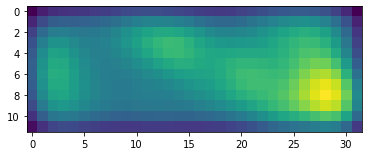

In [ ]:
plt.imshow(heat_mean_active[2].reshape(Nlat,Nlon))

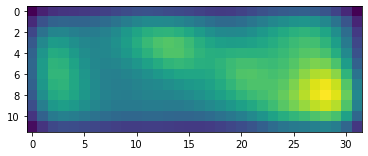

In [ ]:
plt.imshow(heat_mean_dormant[2].reshape(Nlat,Nlon))

In [ ]:
ks_active, ks_dormant

(array([0.49808844, 0.41666667, 0.51500697, 0.48174048, 0.26427437,
        0.3352381 ]),
 array([0.49528482, 0.41975309, 0.47594834, 0.46179746, 0.28969255,
        0.33190476]))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


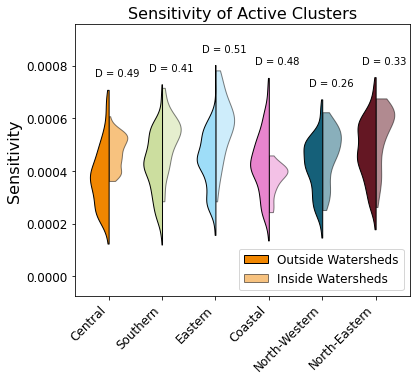

In [ ]:
#inside/outside sensitivity distributions w/ D -- fine ensemble
#help from: https://stackoverflow.com/questions/29776114/half-violin-plot

saveIt = 0

fs = 16

fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

parts_in = ax.violinplot(dataset = heat_in_clusters_active, showextrema = False, widths = 0.7, positions = range(6))
parts_out = ax.violinplot(dataset = heat_out_clusters_active, showextrema = False, widths = 0.7, positions = range(6))

for cluster in range(n_clusters_seasonal):

  part_in = parts_in['bodies'][cluster]
  part_out = parts_out['bodies'][cluster]

  part_out.set_facecolor(rgbas_array[cluster])
  part_out.set_edgecolor('k')
  part_out.set_alpha(1)

  part_in.set_facecolor(rgbas_array[cluster])
  part_in.set_edgecolor('k')
  part_in.set_alpha(0.5)

  m = np.mean(part_out.get_paths()[0].vertices[:, 0])
  part_out.get_paths()[0].vertices[:, 0] = np.clip(part_out.get_paths()[0].vertices[:, 0], -np.inf, m)

  m = np.mean(part_in.get_paths()[0].vertices[:, 0])
  part_in.get_paths()[0].vertices[:, 0] = np.clip(part_in.get_paths()[0].vertices[:, 0], m, np.inf)

  textx = cluster - 0.25
  texty = np.max([part_in.get_paths()[0].vertices[:, 1], part_out.get_paths()[0].vertices[:, 1]]) + 0.00005
  ax.text(x = textx, y = texty, s = 'D = ' + str(ks_active[cluster])[:4])

ax.set_ylabel('Sensitivity', fontsize = fs)
ax.set_title('Sensitivity of Active Clusters', fontsize = fs)
ax.set_xticklabels([''] + cluster_names, rotation = 45, ha = 'right')
ax.tick_params(labelsize = fs-4)

ymin = np.min(np.min(np.asarray(heat_out_clusters_active))) - 0.0002
ymax = np.max(np.max(np.asarray(heat_out_clusters_active))) + 0.0002

ax.set_ylim((ymin,ymax))
ax.legend([parts_out['bodies'][0], parts_in['bodies'][0]], ['Outside Watersheds', 'Inside Watersheds'], fontsize = fs-4, loc = 'lower right')

if saveIt:
  plt.savefig('heat_in_out_dist_active.png', bbox_inches = 'tight', dpi = 300)

plt.show()

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


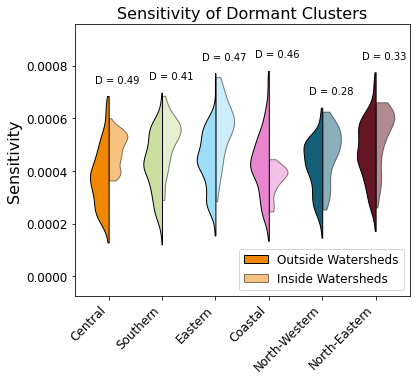

In [ ]:
#inside/outside sensitivity distributions w/ D -- fine ensemble
#help from: https://stackoverflow.com/questions/29776114/half-violin-plot

saveIt = 0

fs = 16

fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

parts_in = ax.violinplot(dataset = heat_in_clusters_dormant, showextrema = False, widths = 0.7, positions = range(6))
parts_out = ax.violinplot(dataset = heat_out_clusters_dormant, showextrema = False, widths = 0.7, positions = range(6))

for cluster in range(n_clusters_seasonal):

  part_in = parts_in['bodies'][cluster]
  part_out = parts_out['bodies'][cluster]

  part_out.set_facecolor(rgbas_array[cluster])
  part_out.set_edgecolor('k')
  part_out.set_alpha(1)

  part_in.set_facecolor(rgbas_array[cluster])
  part_in.set_edgecolor('k')
  part_in.set_alpha(0.5)

  m = np.mean(part_out.get_paths()[0].vertices[:, 0])
  part_out.get_paths()[0].vertices[:, 0] = np.clip(part_out.get_paths()[0].vertices[:, 0], -np.inf, m)

  m = np.mean(part_in.get_paths()[0].vertices[:, 0])
  part_in.get_paths()[0].vertices[:, 0] = np.clip(part_in.get_paths()[0].vertices[:, 0], m, np.inf)

  textx = cluster - 0.25
  texty = np.max([part_in.get_paths()[0].vertices[:, 1], part_out.get_paths()[0].vertices[:, 1]]) + 0.00005
  ax.text(x = textx, y = texty, s = 'D = ' + str(ks_dormant[cluster])[:4])

ax.set_ylabel('Sensitivity', fontsize = fs)
ax.set_title('Sensitivity of Dormant Clusters', fontsize = fs)
ax.set_xticklabels([''] + cluster_names, rotation = 45, ha = 'right')
ax.tick_params(labelsize = fs-4)

ymin = np.min(np.min(np.asarray(heat_out_clusters_active))) - 0.0002
ymax = np.max(np.max(np.asarray(heat_out_clusters_active))) + 0.0002

ax.set_ylim((ymin,ymax))
ax.legend([parts_out['bodies'][0], parts_in['bodies'][0]], ['Outside Watersheds', 'Inside Watersheds'], fontsize = fs-4, loc = 'lower right')

if saveIt:
  plt.savefig('heat_in_out_dist_dormant.png', bbox_inches = 'tight', dpi = 300)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


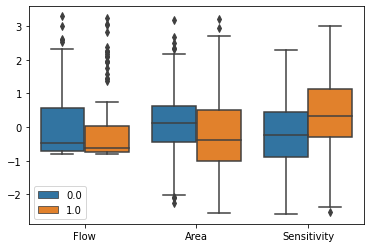

In [ ]:
cluster_seasonal = 0


x = np.hstack([['Flow' for kk in range(Ndays-2*wedge)], 
               ['Area' for kk in range(Ndays-2*wedge)], 
               ['Sensitivity' for kk in range(Ndays-2*wedge)]])

v1 = (flow_clusters[cluster_seasonal,:] - np.mean(flow_clusters[cluster_seasonal,:])) / np.std(flow_clusters[cluster_seasonal,:])
v2 = (A_daily_cluster_mean[:,cluster_seasonal] - np.mean(A_daily_cluster_mean[:,cluster_seasonal])) / np.std(A_daily_cluster_mean[:,cluster_seasonal])
v3 = (S_daily_cluster_mean[:,cluster_seasonal] - np.mean(S_daily_cluster_mean[:,cluster_seasonal])) / np.std(S_daily_cluster_mean[:,cluster_seasonal])

y = np.hstack([v1, v2, v3])
hue = np.tile(labels_binary[cluster_seasonal,:],3)

sns.boxplot(x,y,hue)

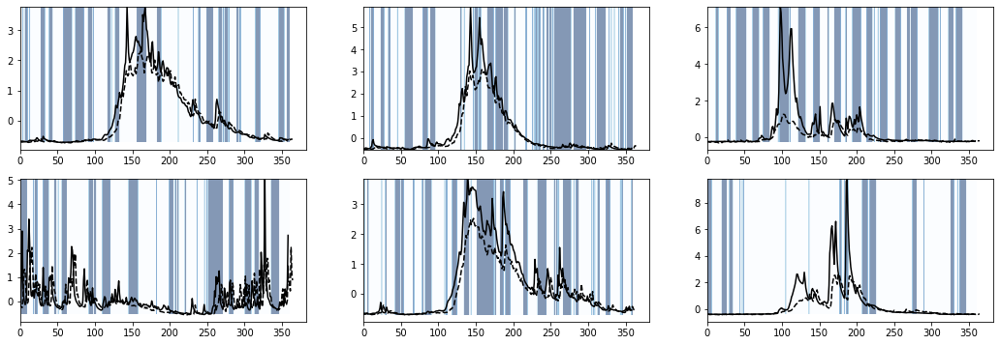

In [ ]:
nrows = 2
ncols = 3

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (6*ncols, 3*nrows))

for cluster_seasonal, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  flow_cluster_predict = np.mean(y_test_predict[:Ndays,inds], axis = -1)
  ymax = np.max(flow_clusters[cluster_seasonal,:])
  ymin = np.min(flow_clusters[cluster_seasonal,:])
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  ax.imshow(np.expand_dims(labels_binary[cluster_seasonal,:], axis=0), extent = extent, aspect = 'auto', alpha = 0.5, cmap = 'Blues')
  ax.plot(flow_clusters[cluster_seasonal,:], color = 'k')
  ax.plot(flow_cluster_predict, 'k--')

# Heat maps by channel: Linear Model

In [ ]:
#this one is good for precip, fucked for temp
def make_heat_channel_linear(model, x_test, channels, style_dict, days, iters_total, iters_one_pass, stationInds, verbose, tol, random_factor):

  """
  model: 
      .h5 keras model
  x_test:
      tf tensor; test set of ERA data, input to model (shape = Ntest x 365 x height x width x channels)
  channels:
      list of ints; indices of channels in input video to perturb
  style_dict:
      dictionary: {'style' : 'RISE' or 'gauss',
                   'params' : [h,w,p_1] or sigma}
          where [h,w,p_1] are the height/width/probability of perturbation of low-res mask (for RISE algorithm); sigma is the gaussian RMS width
  days:
      range of days in test set to perturb (e.g. days = range(0,365) will perturb the first 365 days in the test set)
  iters_total:
      number of total iterations of perturbation to do for each day in days
  iters_one_pass:
      number of iterations to do at one time (typically less than iters_total for memory limits)
  stationInds:
      indices of stations corresponding to the output neurons of the keras model
  verbose:
      0: print nothing
      1: print every 50th day
  tol:
      relative error threshold (when to stop pertubing model)
  random_factor:
      bool; True if the perturbation should be randomly added/subtracted (e.g. for temperature), False if the perturbation should only be added (e.g. for precip)
  """

  #initialize heat map as 3D numpy array: lat x lon x station
  heat_mean = np.zeros((np.size(x_test[0,0,:,:,0]), len(stationInds)))

  n_channels = np.shape(x_test)[-1] #number of channels of input video
  H = np.shape(x_test)[2] #height of input video, in pixels (latitude)
  W = np.shape(x_test)[3] #width of input video, in pixels (longitude)

  heat_prev = np.zeros((H*W,len(stationInds))) #initially, the previous heat map is 0's (for first pass)
  heat_curr = np.zeros((H*W,len(stationInds))) #also initialize the current heat map as 0's (will fill once calculated at end of first pass)
  kk = 0
  err = tol+1 #just to enter while loop
  while err > tol:
    
    # print(kk)
    #loop through specified days to generate mean sensitivity
    for day in days: #for each day that we will perturb

      #state progress
      if verbose:
        if np.mod(day,50)==0:
          print(' Day ' + str(day) + '/' + str(len(days))) 

      #number of iterations of perturbations for one forward pass through model
      iters = iters_one_pass 

      sigma = style_dict['params']

      x_int = np.arange(W)
      y_int = np.arange(H)
      x_mesh, y_mesh = np.meshgrid(x_int, y_int)

      #define gaussian perturbation for each iteration being passed
      perturb = np.half([np.exp( - ( (x_mesh - np.random.randint(0,W))**2 + (y_mesh - np.random.randint(0,H))**2 ) / (2*sigma**2) ) for iter in range(iters)])
      
      #scale perturbation by +1 or -1 randomly, or not
      if random_factor:
        factor = np.random.choice([-1,1],p = [0.5,0.5]) #whether to add or subtract perturbation from input video, 50-50 chance of each
      else:
        factor = 1.
      perturb = factor*perturb

      #create image the same size as one set of iterations, with only desired channels in the image have perturbations
      perturb_image = np.zeros((iters,H,W,nchannels))
      for channel in channels:
        perturb_image[:,:,:,channel] = perturb #this only perturbs the channel of interest -- all other pixels have 0s added to them

      #copy/expand dimensions of the perturbation to be added to weather video
      perturb_2D = np.copy(perturb) #the 2D perturbation for each iteration of this pass
      perturb = tf.repeat(tf.expand_dims(tf.convert_to_tensor(perturb_image, dtype = tf.float16),1),365, axis = 1) #expand along images in one video

      xday = x_test[day] #current day in test set
      xday_iters = [xday for val in range(iters)] #repeat for each iteration (e.g. make copy for each perturbation)

      # factor = np.random.choice([-1,1],p = [0.5,0.5])#.astype('float16') #whether to add or subtract perturbation from input video, 50-50 chance of each
      # perturb = factor*perturb

      x1 = perturb
      x2 = tf.convert_to_tensor(xday_iters)
      xday_iters_perturb = tf.math.add(x1,x2)

      x_all = tf.squeeze(tf.concat((tf.expand_dims(xday, axis = 0),xday_iters_perturb), axis = 0)) #'all' refers to original (xday) and perturbed (xday_iters_perturb)

      n_obs = tf.shape(x_all)[0]
      n_dims = tf.size(x_all[0])
      x_all_flat = np.zeros((n_obs, n_dims))
      for ob in range(n_obs):
        x_all_flat[ob,:] = tf.convert_to_tensor(np.array(x_all[ob]).flatten())

      x_all_ds = tf.data.Dataset.from_tensor_slices(x_all_flat).batch(batch_size = 64)
      y_all = model.predict(x_all_ds)

      yday = y_all[0] #first element is unperturbed model prediction
      yday_perturb = y_all[1:] #all others are perturbed model predictions for each iteration of perturbation

      for station in range(np.shape(y_all)[1]): #for each station, calculate heat map of sensitivity from sensitivty = |deltaQ| * perturbation

        yday_station = yday[station] #original unperturbed model prediction
        yday_station_perturb = yday_perturb[:,station]

        ydiffs = np.abs(np.reshape(yday_station - yday_station_perturb[:iters],(-1,1))) #magnitude difference between perturbed and unperturbed streamflow
        delta = np.ones((len(ydiffs),H,W)) * ydiffs[:,None] #get dimensions to match so delta can be multiplied by perturbation

        heat_iters = np.asarray(delta[:iters]) * np.abs(np.asarray(perturb_2D))
        heat = np.mean(heat_iters[:iters], axis=0) 

        heat_mean[:,station] += heat.flatten() 

      del heat, heat_iters, delta, ydiffs, x_all, xday_iters #delete for memory

    n_iters = iters_one_pass*(kk+1)
    heat_curr = np.copy(heat_mean) / n_iters
    err = np.mean(np.abs(heat_curr - heat_prev)) / np.mean(heat_prev)

    heat_prev = np.copy(heat_curr)

    kk += 1

  heat_mean = heat_mean /(iters_total * len(days))

  return heat_mean

In [ ]:
load_heat = 1
load_heat_runs = 1

#set of random seeds to use for reproducability
seeds = [00, 11, 22, 33, 44, 55, 66, 77, 88, 99]
Nmodels = 1

#parameters for heat maps
sigma = 1.5 #radius of perturbation
style_dict = {'style' : 'gauss', #style of perturbation: gaussian (not RISE/rectangular)
              'params' : sigma}
days_heat = np.arange(365)#range(Ntest) #days in test set to perturb
iters_total = 200 #total iterations of perturbation
iters_one_pass = 50 #number of iterations to pass through model at one time (too high --> RAM issues)
tol = 1e0
channels = [0,1]
channels = [2]
# channels = [0]
# channel = 0
channel_str = ''
for cc in channels:
  channel_str += str(cc) + '_'
if channels == [2]:
  random_factor = False
else:
  random_factor = True

Nlat = np.shape(Tmax)[1]
Nlon = np.shape(Tmax)[2]
Npx = Nlat*Nlon
Ndays = len(days_heat)
Nstations = len(stationInds)

heat_fine = np.zeros((Npx*Ndays, Nstations, Nmodels), dtype = np.float16)

if not load_heat:

  #for each random seed (one seed = one bulk / set of fine-tuned models; 10 seeds --> 10 model ensemble)
  for ii, s in enumerate(seeds[:Nmodels]):

  ##### FINE-TUNING

    print('Model ' + str(ii+1))

    #prep fine-tune target output
    y_test_predict_fine_all = np.empty_like(y_test)

    #for each streamflow cluster, make/train/save fine-tuned model/output/heatmaps  

    for cluster in range(n_clusters_seasonal):

      print(' Cluster ' + str(cluster+1) + ' / ' + str(n_clusters_seasonal))

      #load model 
      model_name = 'model_linear_' + str(ii) + '_cluster_' + str(cluster) + '.h5'
      model_fine = tf.keras.models.load_model(dir_models + '/' + model_name)

      stations_fine = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster
      N_stations = len(stations_fine) #number of stations in this cluster
      
      # #create target datasets (note: x is the same, y is different (same spatial input, different station targets))
      # y_test_fine_current = tf.convert_to_tensor(y_test.numpy()[:,stations_fine])

      #for each day to perturb
      for day in range(Ndays):

        #generate fine-tuned heat maps
        if np.mod(day,10)==0:
          print('   Day: ' + str(day+1) + ' / ' + str(Ndays))
        heat_mean_cluster = make_heat_channel_linear(
            model = model_fine, 
            x_test = tf.expand_dims(x_test[day], axis = 0), 
            channels = channels, 
            style_dict = style_dict, 
            days = np.array([0]), 
            iters_total = iters_total, 
            iters_one_pass = iters_one_pass, 
            stationInds = stations_fine,
            verbose = 0,
            tol = tol,
            random_factor = random_factor
            )
        # heat_mean_cluster = make_heat_channel(
        #     model = model_fine, 
        #     x_test = tf.expand_dims(x_test[day], axis = 0), 
        #     channel = channel, 
        #     style_dict = style_dict, 
        #     days = np.array([0]), 
        #     iters_total = iters_total, 
        #     iters_one_pass = iters_one_pass, 
        #     stationInds = stations_fine,
        #     verbose = 0,
        #     tol = tol
        #     )
        
        for zz,station in enumerate(stations_fine): #reorganize heatmaps into array that matches the bulk heatmap order (e.g. heat_mean_fine[:,0] and heat_mean_bulk[:,0] are the same station)
          heat_fine[Npx*day:Npx*(day+1),station,ii] = heat_mean_cluster[:,zz]

    # #save fine-tuned heatmaps
    fileName = 'heat_mean_linear_series_channel_' + str(channel_str) + 'model_' + str(ii) + '.csv'
    np.savetxt(dir_heat + '/series/' + fileName, heat_fine[:,:,ii], delimiter = ',')

  heat_mean_fine = np.mean(heat_fine, axis = -1)

else:

  if not load_heat_runs:
    filename = 'heat_mean_linear_series_channel_' + str(channel_str) + '.csv'
    heat_mean_fine = pd.read_csv(dir_heat + '/series/' + filename, header = None).values

if load_heat_runs:

  for ii in range(1):
    print(ii)
    filename = 'heat_mean_linear_series_channel_' + str(channel_str) + 'model_' + str(ii) + '.csv'
    heat_fine[:,:,ii] = pd.read_csv(dir_heat + '/series/' + filename, header = None).values
  heat_mean_fine = np.mean(heat_fine, axis = -1)

0


In [ ]:
#load in data

channel_sets = [[0,1],[2]]
# channel_sets = [[0],[2]]
models = [0]
Nchannels = 2#len(channels)
Nchannel_types = 2 #types: temperature (max and min as one) and precipitation
Nmodels = len(models)
Ndays = 365

heat_mean_channels = np.zeros((Npx*Ndays, Nstations, Nchannels))
heat_channels = np.zeros((Npx*Ndays, Nstations, Nchannels, Nmodels))

for channel_set, channels in enumerate(channel_sets):

  channel_str = ''
  for channel in channels:
    channel_str += str(channel) + '_'

  for model in models:
    filename = 'heat_mean_linear_series_channel_' + str(channel_str) + 'model_' + str(model) + '.csv'
    heat_channels[:,:,channel_set,model] = pd.read_csv(dir_heat + '/series/' + filename, header = None).values

heat_mean_channels = np.mean(heat_channels, axis = -1)

In [ ]:
#calculate sensitive area A, max sensitivity S, and location (lat/lon) of maximum sensitivity

lonn, latt = np.meshgrid(eraLon,eraLat)
lat_flat = latt.flatten()
lon_flat = lonn.flatten()

A_daily = np.zeros((Ndays, Nstations, Nchannels))
S_daily = np.zeros((Ndays, Nstations, Nchannels))
lat_daily  = np.zeros((Ndays, Nstations, Nchannels))
lon_daily  = np.zeros((Ndays, Nstations, Nchannels))

A_daily_cluster_mean = np.zeros((Ndays, n_clusters_seasonal, Nchannels))
A_daily_cluster_std = np.zeros((Ndays, n_clusters_seasonal, Nchannels))
S_daily_cluster_mean = np.zeros((Ndays, n_clusters_seasonal, Nchannels))
S_daily_cluster_std = np.zeros((Ndays, n_clusters_seasonal, Nchannels))
lat_daily_cluster_mean  = np.zeros((Ndays, n_clusters_seasonal, Nchannels))
lon_daily_cluster_mean  = np.zeros((Ndays, n_clusters_seasonal, Nchannels))

for channel in range(Nchannels):

  for day in range(Ndays):
    for station in range(Nstations):
      heat = heat_mean_channels[Npx*day:Npx*(day+1), station, channel]
      A_daily[day,station,channel] = get_A(heat)
      S_daily[day,station,channel] = np.max(heat)
      max_ind = np.argmax(heat)
      lat_daily[day,station,channel] = lat_flat[max_ind]
      lon_daily[day,station,channel] = lon_flat[max_ind]

  for cluster in range(n_clusters_seasonal):
    inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
    A_daily_cluster_mean[:,cluster,channel] = np.mean(A_daily[:,inds,channel], axis = 1)
    A_daily_cluster_std[:,cluster,channel] = np.std(A_daily[:,inds,channel], axis = 1)
    S_daily_cluster_mean[:,cluster,channel] = np.mean(S_daily[:,inds,channel], axis = 1)
    S_daily_cluster_std[:,cluster,channel] = np.std(S_daily[:,inds,channel], axis = 1)
    lat_daily_cluster_mean[:,cluster,channel] = np.mean(lat_daily[:,inds,channel], axis = 1)
    lon_daily_cluster_mean[:,cluster,channel] = np.mean(lon_daily[:,inds,channel], axis = 1)

In [ ]:
#smooth

window = 7
kernel = np.ones(window) / window

for channel in range(Nchannels):

  for station in range(Nstations):

    A_daily[:,station,channel] = np.convolve(A_daily[:,station,channel], kernel, mode = 'same')
    S_daily[:,station,channel] = np.convolve(S_daily[:,station,channel], kernel, mode = 'same')
    lat_daily[:,station,channel] = np.convolve(lat_daily[:,station,channel], kernel, mode = 'same')
    lon_daily[:,station,channel] = np.convolve(lon_daily[:,station,channel], kernel, mode = 'same')

  for cluster in range(n_clusters_seasonal):

    A_daily_cluster_mean[:,cluster,channel] = np.convolve(A_daily_cluster_mean[:,cluster,channel], kernel, mode = 'same')
    S_daily_cluster_mean[:,cluster,channel] = np.convolve(S_daily_cluster_mean[:,cluster,channel], kernel, mode = 'same')

    A_daily_cluster_std[:,cluster,channel] = np.convolve(A_daily_cluster_std[:,cluster,channel], kernel, mode = 'same')
    S_daily_cluster_std[:,cluster,channel] = np.convolve(S_daily_cluster_std[:,cluster,channel], kernel, mode = 'same')

    lat_daily_cluster_mean[:,cluster,channel] = np.convolve(lat_daily_cluster_mean[:,cluster,channel], kernel, mode = 'same')
    lon_daily_cluster_mean[:,cluster,channel] = np.convolve(lon_daily_cluster_mean[:,cluster,channel], kernel, mode = 'same')

wedge = int((window - 1)/2)

A_daily = A_daily[wedge:-wedge]
S_daily = S_daily[wedge:-wedge]

A_daily_cluster_mean = A_daily_cluster_mean[wedge:-wedge]
S_daily_cluster_mean = S_daily_cluster_mean[wedge:-wedge]

A_daily_cluster_std = A_daily_cluster_std[wedge:-wedge]
S_daily_cluster_std = S_daily_cluster_std[wedge:-wedge]

lat_daily_cluster_mean = lat_daily_cluster_mean[wedge:-wedge]
lon_daily_cluster_mean = lon_daily_cluster_mean[wedge:-wedge]


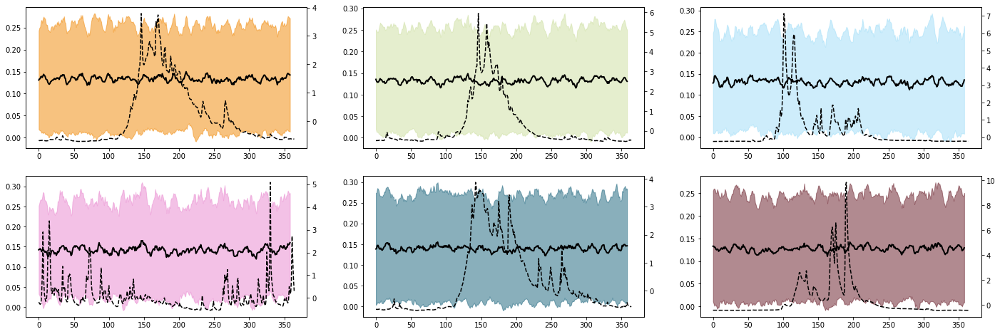

In [ ]:
channel = 0

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = A_daily_cluster_mean[:,cluster,channel] + 2*A_daily_cluster_std[:,cluster,channel]
  y2 = A_daily_cluster_mean[:,cluster,channel] - 2*A_daily_cluster_std[:,cluster,channel]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(A_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

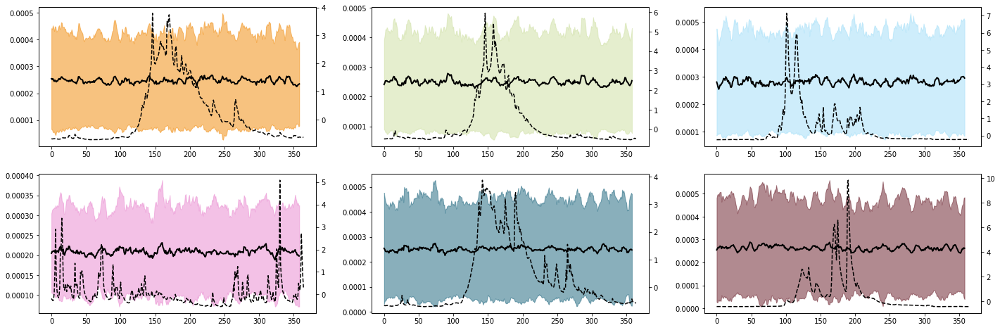

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  y1 = S_daily_cluster_mean[:,cluster,channel] + 2*S_daily_cluster_std[:,cluster,channel]
  y2 = S_daily_cluster_mean[:,cluster,channel] - 2*S_daily_cluster_std[:,cluster,channel]
  x = np.arange(len(y1))
  ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
  ax.plot(S_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2)

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

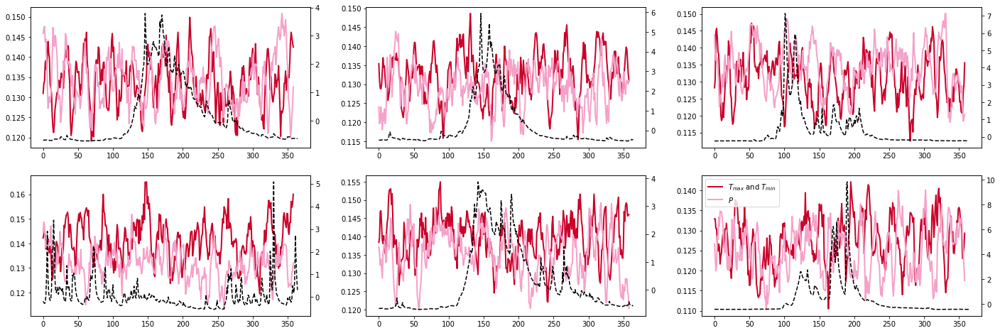

In [ ]:
#sensitive areas through time, all channels

c_channels = np.array([[204, 0, 41],
                       [246, 162, 201],
                       [116, 92, 151]]) / 256
channel_names = ['$T_{max}$ and $T_{min}$', '$P$']

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  for channel in range(Nchannels):
    inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
    y1 = A_daily_cluster_mean[:,cluster,channel] + 2*A_daily_cluster_std[:,cluster,channel]
    y2 = A_daily_cluster_mean[:,cluster,channel] - 2*A_daily_cluster_std[:,cluster,channel]
    x = np.arange(len(y1))
    # ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
    ax.plot(A_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2, color = c_channels[channel,:], label = channel_names[channel])

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--', label = 'flow')

ax.legend()

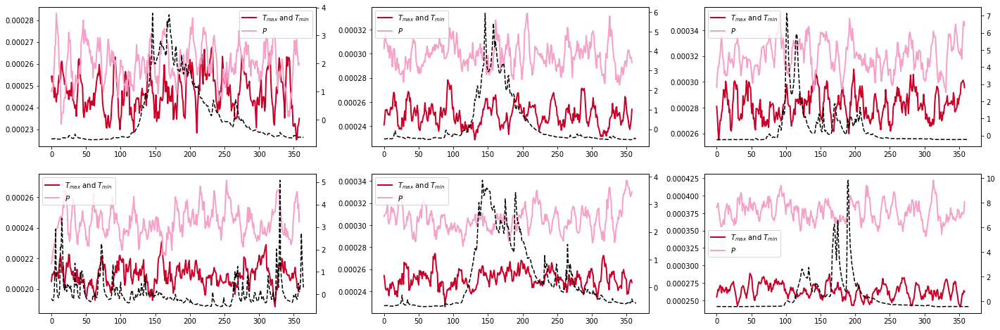

In [ ]:
#maximum sensitivity through time, all channels

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (8*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):
  for channel in range(Nchannels):
    inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
    y1 = S_daily_cluster_mean[:,cluster,channel] + 2*S_daily_cluster_std[:,cluster,channel]
    y2 = S_daily_cluster_mean[:,cluster,channel] - 2*S_daily_cluster_std[:,cluster,channel]
    x = np.arange(len(y1))
    # ax.fill_between(x, y1, y2, color = rgbas_array[cluster,:], alpha = 0.5)
    ax.plot(S_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2, color = c_channels[channel,:], label = channel_names[channel])

  flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
  ax2 = ax.twinx()
  ax2.plot(flow,'k--')

  ax.legend()

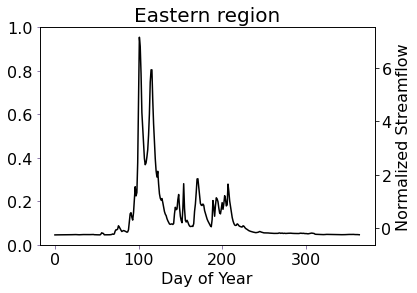

In [ ]:
saveIt = 0

cluster = 2
channel = 2

nrows = 1
ncols = 1
fig, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize = (6*ncols, 4*nrows))

# ax.plot(100*S_daily_cluster_mean[:,cluster,channel], 'k', linewidth = 2, color = c_channels[channel,:], label = channel_names[channel])

inds = np.squeeze(np.argwhere(seasonal_clustering.labels_==cluster))
flow = np.mean(np.array(y_test)[:365,inds], axis = -1)
ax2 = ax.twinx()
ax2.plot(flow,'k')

# ax.legend(fontsize = fs-4)
ax.tick_params(labelsize = fs-4, color = c_channels[channel,:])
ax.set_xlabel('Day of Year', fontsize = fs-4)
# ax.set_ylabel('Variable Importance', fontsize = fs-4, color = c_channels[channel,:])
ax.set_title('Eastern region', fontsize = fs)
ax2.tick_params(labelsize = fs-4)
ax2.set_ylabel('Normalized Streamflow', fontsize = fs-4)

if saveIt:
  plt.savefig('just_flow_importance_eastern.png', bbox_inches = 'tight', dpi = 300)

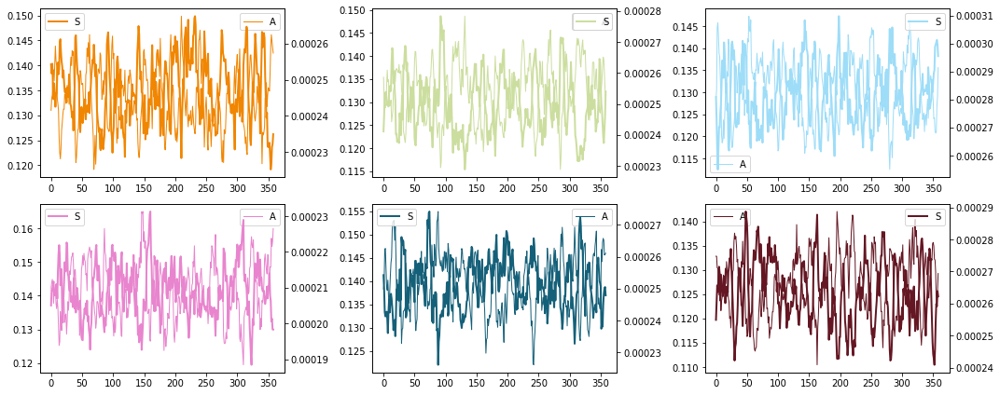

In [ ]:
channel = 0

nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (5*ncols, 3*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(A_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 1, label = 'A')#, linestyle = '--')
  ax2 = ax.twinx()
  ax2.plot(S_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 2, label = 'S')
  ax.legend()
  ax2.legend()

plt.tight_layout()

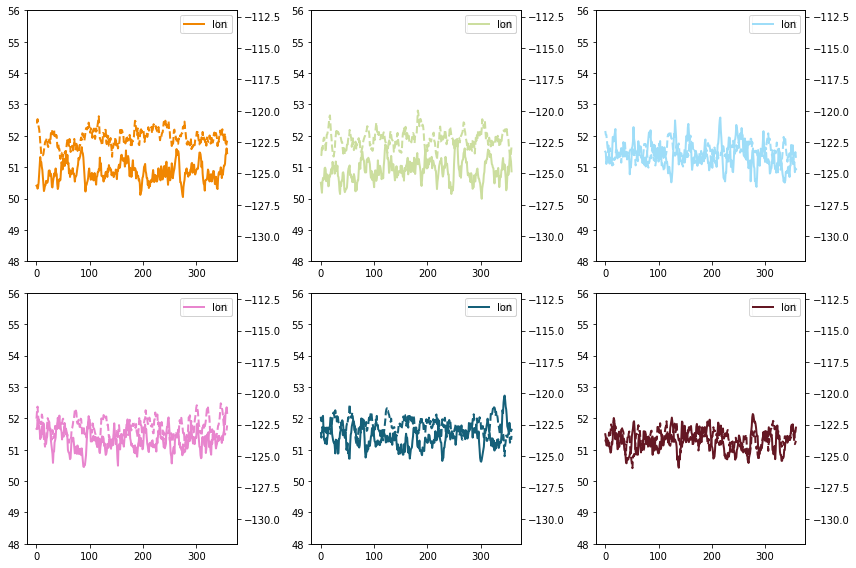

In [ ]:
nrows = 2
ncols = 3#np.ceil(n_clusters_seasonal / nrows, dtype = 'int')

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  ax.plot(lat_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 2, label = 'lat', linestyle = '--')
  ax2 = ax.twinx()
  ax2.plot(lon_daily_cluster_mean[:,cluster,channel], color = rgbas_array[cluster,:], linewidth = 2, label = 'lon')
  ax.legend()
  ax2.legend()

  ax.set_ylim((48,56))
  ax2.set_ylim((-132, -112))

plt.tight_layout()

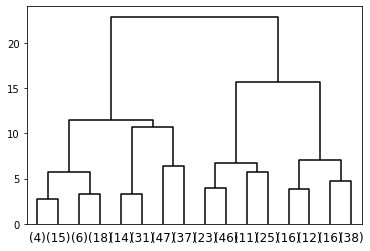

In [ ]:
cluster_seasonal = 3

channel = 1

cluster_input = np.vstack([lat_daily_cluster_mean[:,cluster_seasonal,channel], lon_daily_cluster_mean[:,cluster_seasonal,channel]]).T
cluster_input = (cluster_input - np.mean(cluster_input, axis = 0)) / np.std(cluster_input, axis = 0)

# setting distance_threshold=0 ensures we compute the full tree
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(cluster_input)

# plot the top levels of the dendrogram
d = plot_dendrogram(model, truncate_mode='level', p=3, color_threshold = 0, above_threshold_color = 'k')

In [ ]:
n_clusters = 2
model = AgglomerativeClustering(n_clusters = n_clusters).fit(cluster_input)
labels = model.labels_

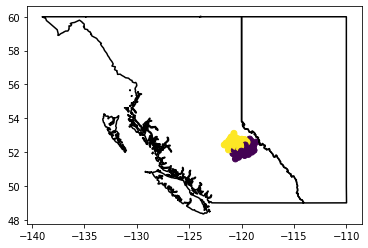

In [ ]:
fig, ax = plt.subplots()
plot_prov_ax(prov, ax)
ax.scatter(lon_daily_cluster_mean[:,cluster_seasonal,channel], lat_daily_cluster_mean[:,cluster_seasonal,channel], c = labels)

In [ ]:
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
heat_mean_channels_cluster = np.mean(heat_mean_channels[:,inds,channel], axis = 1).reshape(Ndays,Npx)

cluster_heat = np.zeros((n_clusters, Npx))
for cluster in range(n_clusters):
  days = np.squeeze(np.argwhere(labels==cluster))
  cluster_heat[cluster,:] = np.mean(heat_mean_channels_cluster[days,:], axis = 0)


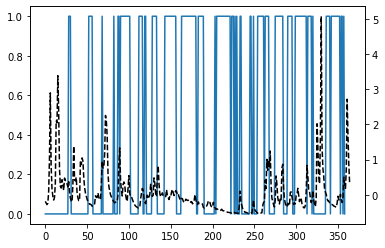

In [ ]:
fig, ax = plt.subplots()
ax.plot(labels)
flow = np.mean(np.array(y_test)[:Ndays,inds], axis = -1)
ax2 = ax.twinx()
ax2.plot(flow,'k--')

Text(0.5, 1.0, 'Active Cluster: 0')

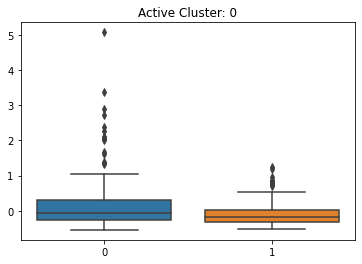

In [ ]:
inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
flow = np.mean(np.array(y_test)[wedge:Ndays-wedge,inds], axis = -1)
flow_cluster_mean = np.zeros(n_clusters)
for cluster in range(n_clusters):
  inds = np.squeeze(np.argwhere(labels == cluster))
  flow_cluster_mean[cluster] = np.mean(flow[inds])
sns.boxplot(x = labels, y = flow)
plt.title('Active Cluster: ' + str(np.argmax(flow_cluster_mean)))

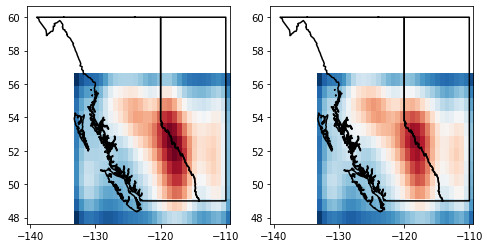

In [ ]:
nrows = 1
ncols = n_clusters

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 4*nrows))

for cluster, ax in enumerate(axes.flatten()):

  vmax = np.max(cluster_heat[cluster])
  vmin = np.min(cluster_heat[cluster])
  vmax = np.max(cluster_heat)
  vmin = np.min(cluster_heat)
  ax.imshow(cluster_heat[cluster,:].reshape(Nlat,Nlon), aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax, cmap = 'RdBu_r')
  plot_prov_ax(prov, ax)
  ax.set_xlim(left = extentERA[0], right = extentERA[1])
  ax.set_ylim(bottom = extentERA[2], top = extentERA[3])

In [ ]:
#loop through all seasonal clusters, then cluster heat maps, then characterize active 

channel_set = 0

n_clusters_heat_all = [2,2,2,3,3,2]
n_clusters_heat_all = [2,2,2,2,2,2]
# n_clusters_heat_all = [3,3,3,3,3,3]

heat_all = np.zeros((n_clusters_seasonal, np.max(n_clusters_heat_all), Npx))
labels_all = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
heat_mean_active = np.zeros((n_clusters_seasonal, Npx))
heat_mean_dormant = np.zeros((n_clusters_seasonal, Npx))
labels_binary = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))
flow_clusters = np.zeros((n_clusters_seasonal, Ndays - 2*wedge))

for cluster_seasonal, n_clusters_heat in enumerate(n_clusters_heat_all):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))

  # #cluster input: latitude/longitude of sensitivity maximum
  # var = lat_daily_cluster_mean[:, cluster_seasonal, channel_set]
  # latnorm = (var - np.mean(var)) / np.std(var)
  # var = lon_daily_cluster_mean[:, cluster_seasonal, channel_set]
  # lonnorm = (var - np.mean(var)) / np.std(var)
  # cluster_input = np.vstack([latnorm, lonnorm]).T

  #input: normalized heat maps
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(-1,Npx)
  var = np.double(heat_mean_fine_cluster)
  heat_mean_fine_cluster_norm = (heat_mean_fine_cluster - np.expand_dims(np.mean(var, axis = -1), axis = -1)) / np.expand_dims(np.std(var, axis = -1), axis = -1)
  cluster_input = heat_mean_fine_cluster_norm

  #cluster by heat maximum location
  model = AgglomerativeClustering(n_clusters = n_clusters_heat).fit(cluster_input)
  labels = model.labels_
  labels_all[cluster_seasonal] = np.copy(labels)

  #calculate mean flow of each location cluster
  flow = np.mean(np.array(y_test)[wedge:Ndays-wedge,inds], axis = -1)
  flow_cluster_mean = np.zeros(n_clusters_heat)
  for cluster_heat in range(n_clusters_heat):
    inds_labels = np.squeeze(np.argwhere(labels == cluster_heat))
    flow_cluster_mean[cluster_heat] = np.mean(flow[inds_labels])
  ind_heat_active = np.argmax(flow_cluster_mean) #index of the heat map / location cluster with the highest average flow
  ind_heat_dormant = np.squeeze(np.argwhere(np.arange(n_clusters_heat) != ind_heat_active))

  #sort labels from low to high flow
  sorted = np.argsort(flow_cluster_mean)
  labels_sorted = np.zeros(np.shape(labels))
  for kk in range(n_clusters_heat):
    labels_sorted[labels==sorted[kk]] = kk 
  labels_all[cluster_seasonal,:] = labels_sorted
  labels = labels_sorted

  #calculate average heat map of each location cluster
  heat_mean_fine_cluster = np.mean(heat_mean_fine[:,inds], axis = -1).reshape(Ndays,Npx)
  cluster_heat = np.zeros((n_clusters_heat, Npx))
  for cluster in range(n_clusters_heat):
    days = np.squeeze(np.argwhere(labels==cluster))
    cluster_heat[cluster,:] = np.mean(heat_mean_fine_cluster[days,:], axis = 0)
    heat_all[cluster_seasonal, cluster,:] = np.copy(cluster_heat[cluster,:])

  heat_mean_active[cluster_seasonal,:] = cluster_heat[ind_heat_active,:]
  if np.size(ind_heat_dormant)>1:
    heat_mean_dormant[cluster_seasonal,:] = np.mean(cluster_heat[ind_heat_dormant,:], axis = 0)
  else:
    heat_mean_dormant[cluster_seasonal,:] = cluster_heat[ind_heat_dormant,:]

  labels_binary[cluster_seasonal, labels == ind_heat_active] = 1 #1: active, 0: dormant
  flow_clusters[cluster_seasonal, :] = flow

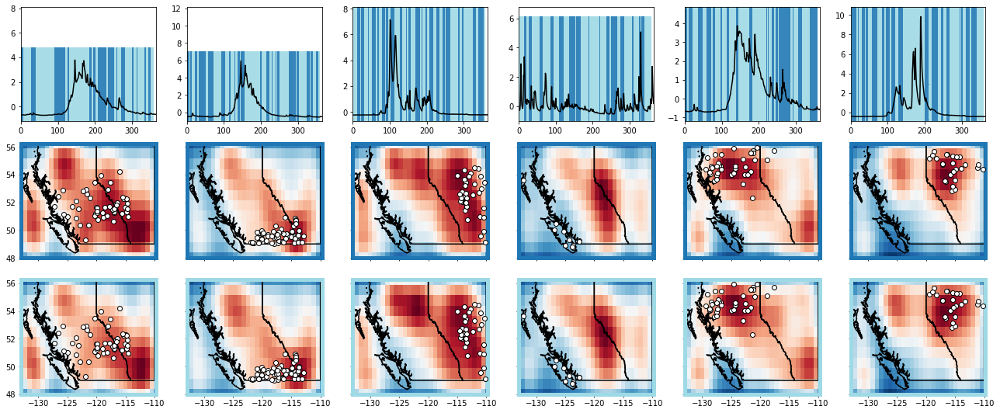

In [ ]:
#figure: row 1: cluster labels through time + flow, other rows: heat clusters; columns are streamflow clusters 

n_clusters_heat_all  

nrows = np.max(n_clusters_heat_all)+1
ncols = n_clusters_seasonal

year = 0

#make discrete colourmap for label imshow
# cmap = colors.ListedColormap(['white', 'red'])
cmap = cm.get_cmap('tab20')
bounds = np.arange(-0.5, np.max(n_clusters_heat_all))
norm = colors.BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster_seasonal in range(n_clusters_seasonal):

  #label
  # ax_label = axes[0,cluster_seasonal].twinx()
  ymax = np.max(flow_clusters[cluster_seasonal,:])+1.0
  ymin = np.min(flow_clusters[cluster_seasonal,:])-0.5
  xmin = 0
  xmax = Ndays-2*wedge
  extent = [xmin, xmax, ymin, ymax]
  axes[0,cluster_seasonal].imshow(np.expand_dims(labels_all[cluster_seasonal,:], axis=0), extent = extent, 
                  aspect = 'auto', alpha = .9, cmap = cmap, norm = norm, zorder = -1)
  axes[0,cluster_seasonal].tick_params(labelright = False, right = False)

  #flow
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster_seasonal))
  axes[0,cluster_seasonal].plot(np.mean(np.array(y_test)[:,inds], axis = -1), 'k', zorder = 2)
  axes[0,cluster_seasonal].set_xlim(left = year*365, right = (year+1)*365)

  for cluster_heat in range(n_clusters_heat_all[cluster_seasonal]):

    axes[cluster_heat+1,cluster_seasonal].imshow(heat_all[cluster_seasonal, cluster_heat,:].reshape(Nlat,Nlon), cmap = 'RdBu_r', aspect = 'auto', extent = extentERA)
    plot_prov_ax(prov, axes[cluster_heat+1,cluster_seasonal])
    axes[cluster_heat+1,cluster_seasonal].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)
    axes[cluster_heat+1,cluster_seasonal].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[cluster_heat+1,cluster_seasonal].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))
    plt.setp(axes[cluster_heat+1,cluster_seasonal].spines.values(), color = cmap(norm(cluster_heat)), linewidth = 5)

    if cluster_heat < n_clusters_heat_all[cluster_seasonal]-1:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelbottom = False)
  
    if cluster_seasonal > 0:
      axes[cluster_heat+1,cluster_seasonal].tick_params(labelleft = False)

plt.tight_layout()

# Extra: Neuron activation by cluster, CNN-LSTM

In [ ]:
#ANALYSIS BY CLUSTER

seed = 0
np.random.seed(seed)

dy_test_predict = y_test_predict[1:,:] - y_test_predict[:-1,:]
dy_test_predict = y_all_predict[1:,:] - y_all_predict[:-1,:]
N_DJF = len(DJF_inds) #number of DJF days
N_MAM = len(MAM_inds) #number of MAM days
N_JJA = len(JJA_inds) #number of JJA days
N_SON = len(SON_inds) #number of SON days

N_antecedent = 0
frac_top = 0.1 #fraction of days to use as 'high flow' (e.g. 0.1 --> top 10% of flow change days)
N_top = int(frac_top*np.mean([N_DJF, N_MAM, N_JJA, N_SON])) #number of 'top change in flow days' to calculate input patterns for 
# N_top = 300 

#normalize climate data

#PRECIP
#normalize each grid cell of precip to have mean of zero and unity variance
#normalized values measure how far (in standard deviations) each day of precip is from that location's mean
#otherwise, coastal precip is so much more than everywhere else that patterns just highlight a wet coast
#this way, Pnorm>0 indicates "wetter than usual here", Pnorm<0 indicates "drier than usual here"

# P_px_norm = (P - np.mean(P, axis = 0)) / np.std(P,axis = 0)
P_px_norm = np.copy(P_deseasonal) / np.std(P_deseasonal,axis = 0)
# P_px_norm_test = P_px_norm[-Ntest:]
P_px_norm_test = P_px_norm[365:]

#TEMP
#normalize each grid cell of temperature by removing the seasonal cycle
#normalized values measure how many degrees warmer/cooler each grid cell is at that day, relative to that grid cell's mean of that day
#otherwise, we find that JJA flow change is linked to hot temperatures -- only because JJA is hotter than other periods (would just be measuring seasons)
#this way, Tnorm>0 indicates "hotter than usual for this day and location", Tnorm<0 indicates "colder than usual for this day and location"

Tmax_px_norm = np.copy(Tmax_deseasonal) / np.std(Tmax_deseasonal,axis = 0)
# Tmax_px_norm_test = Tmax_px_norm[-Ntest:]
Tmax_px_norm_test = Tmax_px_norm[365:]

Tmin_px_norm = np.copy(Tmin_deseasonal) / np.std(Tmin_deseasonal,axis = 0)
# Tmin_px_norm_test = Tmin_px_norm[-Ntest:]
Tmin_px_norm_test = Tmin_px_norm[365:]

Pnorm_dymax_DJF = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (DJF)
Pnorm_dymax_MAM = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (MAM)
Pnorm_dymax_JJA = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (JJA)
Pnorm_dymax_SON = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (SON)

Tmaxnorm_dymax_DJF = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (DJF)
Tmaxnorm_dymax_MAM = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (MAM)
Tmaxnorm_dymax_JJA = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (JJA)
Tmaxnorm_dymax_SON = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (SON)

Tminnorm_dymax_DJF = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (DJF)
Tminnorm_dymax_MAM = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (MAM)
Tminnorm_dymax_JJA = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (JJA)
Tminnorm_dymax_SON = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (SON)

for cluster in range(n_clusters_seasonal):

  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  dy_test_predict_cluster = np.mean(dy_test_predict[:,inds], axis = -1)

  dy_DJF = dy_test_predict_cluster[DJF_inds] #DJF change in flow
  dy_MAM = dy_test_predict_cluster[MAM_inds] #MAM change in flow
  dy_JJA = dy_test_predict_cluster[JJA_inds] #JJA change in flow
  dy_SON = dy_test_predict_cluster[SON_inds] #SON change in flow

  dy_top_DJF = np.sort(dy_DJF)[-N_top:] #maximum change in flow days (DJF)
  dy_top_MAM = np.sort(dy_MAM)[-N_top:] #maximum change in flow days (MAM)
  dy_top_JJA = np.sort(dy_JJA)[-N_top:] #maximum change in flow days (JJA)
  dy_top_SON = np.sort(dy_SON)[-N_top:] #maximum change in flow days (SON)

  dy_top_ind_DJF = DJF_inds[np.argsort(dy_DJF)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_MAM = MAM_inds[np.argsort(dy_MAM)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_JJA = JJA_inds[np.argsort(dy_JJA)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_SON = SON_inds[np.argsort(dy_SON)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)

  # dy_top_ind_DJF = DJF_inds[np.random.randint(0,N_top,N_DJF)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_MAM = MAM_inds[np.random.randint(0,N_top,N_MAM)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_JJA = JJA_inds[np.random.randint(0,N_top,N_JJA)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_SON = SON_inds[np.random.randint(0,N_top,N_SON)] #indices in ERA test dataset of the max-change-in-flow days (DJF)

  #include few antecedent days
  dummy = []
  for kk, ind in enumerate(dy_top_ind_DJF):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_DJF = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_MAM):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_MAM = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_JJA):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_JJA = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_SON):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_SON = np.array(dummy,dtype='int')

  Pnorm_dymax_DJF[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_DJF], axis = 0) #precip fields for top-flow-change-days (DJF)
  Pnorm_dymax_MAM[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_MAM], axis = 0) #precip fields for top-flow-change-days (MAM)
  Pnorm_dymax_JJA[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_JJA], axis = 0) #precip fields for top-flow-change-days (JJA)
  Pnorm_dymax_SON[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_SON], axis = 0) #precip fields for top-flow-change-days (SON)

  Tmaxnorm_dymax_DJF[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_DJF], axis = 0) #max temp fields for top-flow-change-days (DJF)
  Tmaxnorm_dymax_MAM[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_MAM], axis = 0) #max temp fields for top-flow-change-days (MAM)
  Tmaxnorm_dymax_JJA[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_JJA], axis = 0) #max temp fields for top-flow-change-days (JJA)
  Tmaxnorm_dymax_SON[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_SON], axis = 0) #max temp fields for top-flow-change-days (SON)

  Tminnorm_dymax_DJF[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_DJF], axis = 0) #min temp fields for top-flow-change-days (DJF)
  Tminnorm_dymax_MAM[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_MAM], axis = 0) #min temp fields for top-flow-change-days (MAM)
  Tminnorm_dymax_JJA[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_JJA], axis = 0) #min temp fields for top-flow-change-days (JJA)
  Tminnorm_dymax_SON[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_SON], axis = 0) #min temp fields for top-flow-change-days (SON)

In [ ]:
#initialize

Npx = Nlat*Nlon

binary_in = np.zeros((Npx, n_clusters_seasonal))
inside_all_stations = [None] * len(stationInds)
outside_all_stations = [None] * len(stationInds)
radius = 1.

x = eraLon #rename for readability when making xx and xxv
y = eraLat
xx,yy = np.meshgrid(x,y)
xxv = xx.reshape(-1) #vector (array) where paired elements in xxv and yyv correspond to one pixel in heat map sensitivity space
yyv = yy.reshape(-1)

points = list(zip(xx.flatten(),yy.flatten())) #will loop through each point to see if sensitivity there is in/near or out/far from basins

#loop through each station and determine in/out points/sensitivity
for station in range(len(stationInds)):

  basin = stationBasins[station]
    
  #determine basin outlines  
  if basin is not None: #if basin polygon(s) exist -- some small basins do not have polygons from this source (see elif)
    xb,yb = basin.exterior.xy #lon/lat (x/y) points of watershed/basin boundary
  elif basin is None: #if basin shapefile is missing, use stream gauge location w/ radius buffer to estimate in/near pixels (these are small basins)
    xb = stationLon[stationInds][station] #basin outline taken to be single point at stream gauge
    yb = stationLat[stationInds][station]
    
  #create binary in/near (True) vs out/far (False)
  inside = np.zeros(np.size(Tmax[0])) #initialize inside/outside array
  for ii, point in enumerate(points): #for each point/pixel in ERA5 space
    d = np.sqrt((point[0] - xb)**2 + (point[1] - yb)**2) #distance from point in ERA5 to all points around basin
    if np.min(d) <= radius: #if the nearest basin edge to current point in ERA5 is less than prescribed allowable radius
      inside[ii] = True #then this point in ERA5 is considered 'inside' (or near) this basin

  inside_this_station = np.squeeze(np.argwhere(inside==True)) #array of indices which are inside this station's basin
  outside_this_station = np.squeeze(np.argwhere(inside==False)) #array of indices which are outside this station's basin

  inside_all_stations[station] = inside_this_station #list of arrays of indices which are inside/near each stations' basin
  outside_all_stations[station] = outside_this_station #list of arrays of indices which are outside/far each stations' basin

#find unique pixels in each clusters' set of basins; some basins in same cluster can share pixels, but here we want unique indices for visualization
unique_in_clusters = [None] * n_clusters_seasonal
unique_out_clusters = [None] * n_clusters_seasonal

for cluster in range(n_clusters_seasonal): #for each cluster

  unique_in_this_cluster = [] #initialize
  stations_this_cluster = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster

  for station in stations_this_cluster: #for each station
    for ind in inside_all_stations[station]: #for each index within/near this stations' basin
      unique_in_this_cluster.append(ind) #append the index
  unique_in_clusters[cluster] = list(set(unique_in_this_cluster)) #since some stations in the same cluster have the same index, take only unique indices

#find the sensitivity ('heat') of inside/near and outisde/far of all stations belonging to each cluster
for cluster in range(n_clusters_seasonal):
  binary_in[unique_in_clusters[cluster], cluster] = 1

Nunique_in_clusters = len(np.concatenate([unique_in_clusters[cluster] for cluster in range(n_clusters_seasonal)]))

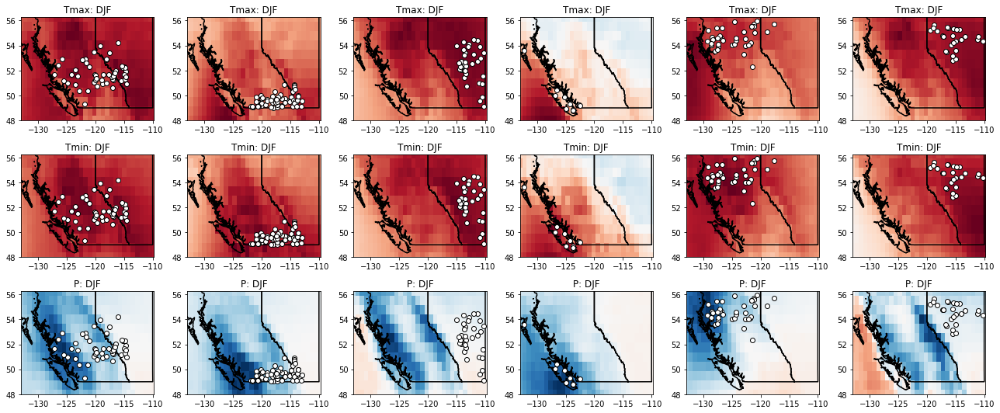

In [ ]:
#DJF: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_DJF[:,:,cluster],
          Tminnorm_dymax_DJF[:,:,cluster],
          Pnorm_dymax_DJF[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': DJF')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

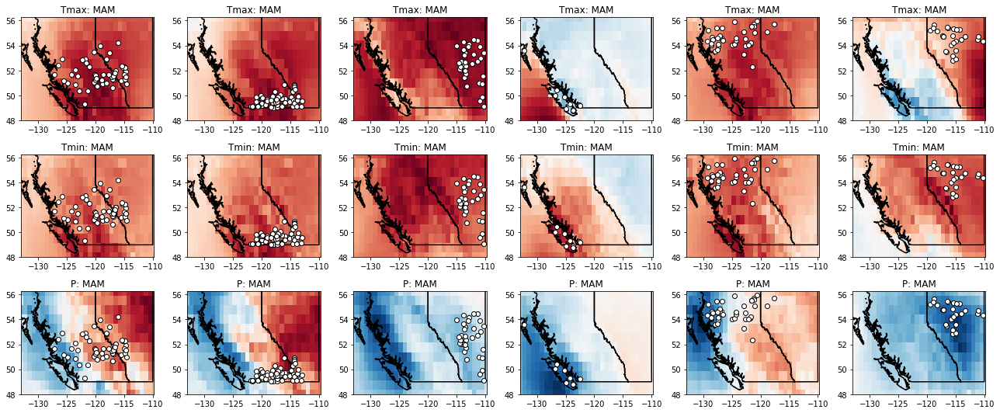

In [ ]:
#MAM: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_MAM[:,:,cluster],
          Tminnorm_dymax_MAM[:,:,cluster],
          Pnorm_dymax_MAM[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': MAM')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

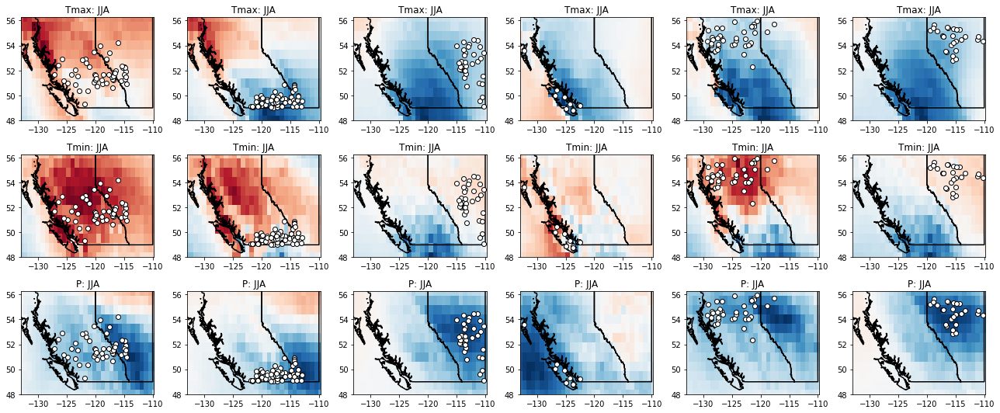

In [ ]:
#JJA: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_JJA[:,:,cluster],
          Tminnorm_dymax_JJA[:,:,cluster],
          Pnorm_dymax_JJA[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': JJA')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

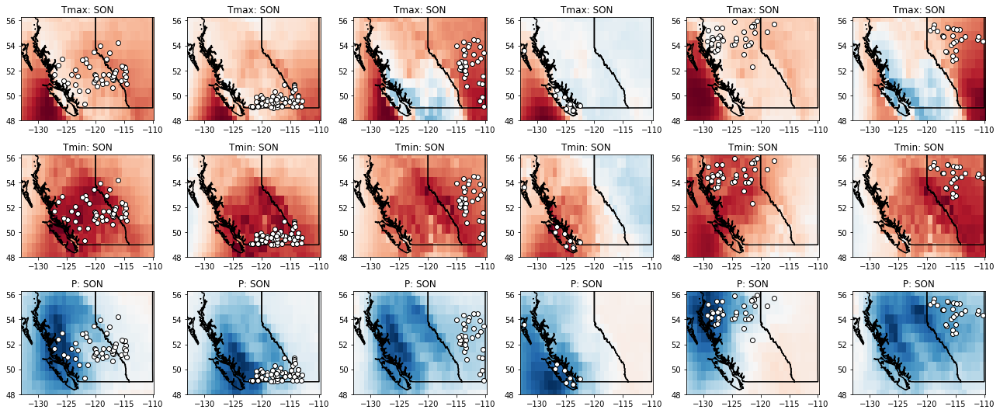

In [ ]:
#SON: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_SON[:,:,cluster],
          Tminnorm_dymax_SON[:,:,cluster],
          Pnorm_dymax_SON[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': SON')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

In [ ]:
Tmaxnorm_dymax_DJF_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_DJF_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_DJF_cluster = [None]*n_clusters_seasonal

Tmaxnorm_dymax_MAM_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_MAM_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_MAM_cluster = [None]*n_clusters_seasonal

Tmaxnorm_dymax_JJA_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_JJA_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_JJA_cluster = [None]*n_clusters_seasonal

Tmaxnorm_dymax_SON_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_SON_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_SON_cluster = [None]*n_clusters_seasonal

for cluster in range(n_clusters_seasonal):

  #DJF
  Tmaxnorm_dymax_DJF_cluster[cluster] = Tmaxnorm_dymax_DJF[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_DJF_cluster[cluster] = Tminnorm_dymax_DJF[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_DJF_cluster[cluster] = Pnorm_dymax_DJF[:,:,cluster].flatten()[unique_in_clusters[cluster]]

  #MAM
  Tmaxnorm_dymax_MAM_cluster[cluster] = Tmaxnorm_dymax_MAM[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_MAM_cluster[cluster] = Tminnorm_dymax_MAM[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_MAM_cluster[cluster] = Pnorm_dymax_MAM[:,:,cluster].flatten()[unique_in_clusters[cluster]]

  #JJA
  Tmaxnorm_dymax_JJA_cluster[cluster] = Tmaxnorm_dymax_JJA[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_JJA_cluster[cluster] = Tminnorm_dymax_JJA[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_JJA_cluster[cluster] = Pnorm_dymax_JJA[:,:,cluster].flatten()[unique_in_clusters[cluster]]

  #SON
  Tmaxnorm_dymax_SON_cluster[cluster] = Tmaxnorm_dymax_SON[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_SON_cluster[cluster] = Tminnorm_dymax_SON[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_SON_cluster[cluster] = Pnorm_dymax_SON[:,:,cluster].flatten()[unique_in_clusters[cluster]]

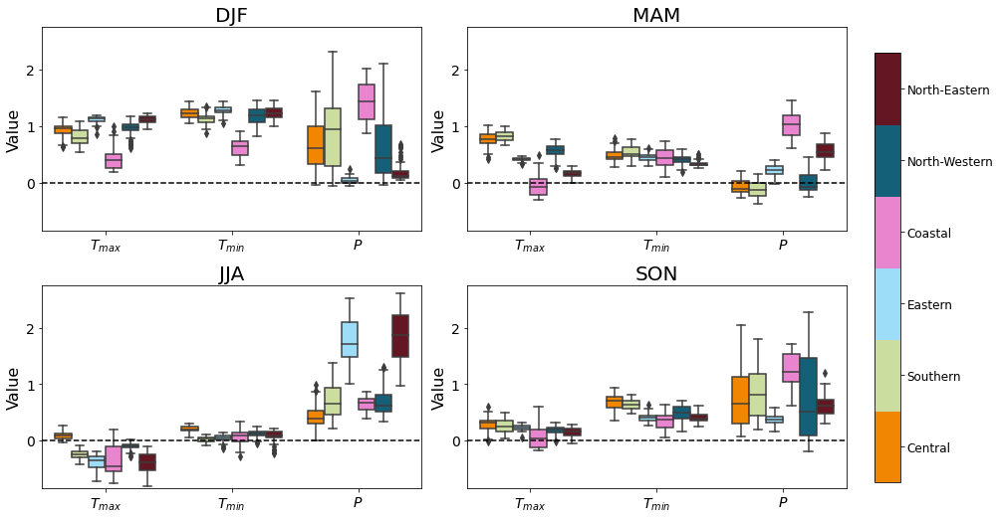

In [ ]:
#boxplot: all seasons + all clusters 

saveIt = 0

xx = np.concatenate(np.array([kk*np.ones(Nunique_in_clusters) for kk in range(3)], dtype = 'object'))
hue = np.concatenate(np.array([cluster*np.ones(len(unique_in_clusters[cluster])) for cluster in range(n_clusters_seasonal)], dtype = 'object'))
hue = np.tile(hue,3)
bps = [None]*4 #empty list of boxplots

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (12,8))

#DJF
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_DJF_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_DJF_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_DJF_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[0] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,0])

#MAM
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_MAM_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_MAM_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_MAM_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[1] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,1])


#JJA
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_JJA_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_JJA_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_JJA_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[2] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,0])

#SON
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_SON_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_SON_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_SON_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[3] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,1])

titles = ['DJF','MAM','JJA','SON']
for kk, ax in enumerate(axes.flatten()):
  ax.plot([-0.5,2.5],[0,0], 'k--')
  ax.set_xlim(left = -0.5, right = 2.5)
  ax.set_ylim(bottom = -0.85, top = 2.75)
  ax.set_title(titles[kk], fontsize = fs)
  ax.set_ylabel('Value', fontsize = fs - 4)
  ax.tick_params(labelsize = fs-6)

for bp in bps: #for each boxplot, colour the box according to its streamflow cluster

  bp.get_legend().remove()
  bp.set_xticklabels(labels = ['$T_{max}$', '$T_{min}$', '$P$'])

  kk = 0
  for jj in range(3):
    for cluster in range(n_clusters_seasonal):
      bp.artists[kk].set_facecolor(rgbs_array[cluster])
      kk+=1

fig.tight_layout(rect=[0, 0.03, 1, 0.95])

cmap = matplotlib.colors.ListedColormap(rgbs_array)
bounds = [0,1,2,3,4,5,6]
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
s = plt.scatter([10,11,12,14,15],[0,0,0,0,0], c=[0,1,2,4,5], cmap = cmap, norm = norm) #just for colourmap
cb_ax = fig.add_axes([1.02,0.1,0.03,0.75])
cb = fig.colorbar(s, cax = cb_ax)
cb.set_ticks(np.arange(0.5,6.5,1))
cb.set_ticklabels(['Central', 'Southern', 'Eastern', 'Coastal', 'North-Western', 'North-Eastern'])
cb.ax.tick_params(labelsize = fs-8)

# plt.tight_layout()

if saveIt:
  # plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'top.png', dpi = 300, bbox_inches = 'tight')
  plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'random.png', dpi = 300, bbox_inches = 'tight')

plt.show()

# Extra code: Neuron activation by cluster, Linear

In [ ]:
#ANALYSIS BY CLUSTER

seed = 0
np.random.seed(seed)

dy_test_predict = y_test_predict_linear_fine[1:,:] - y_test_predict_linear_fine[:-1,:] #1-day-change in output flow (or output neuron activation)
# dy_test_predict = y_all_predict[1:,:] - y_all_predict[:-1,:]
N_DJF = len(DJF_inds) #number of DJF days
N_MAM = len(MAM_inds) #number of MAM days
N_JJA = len(JJA_inds) #number of JJA days
N_SON = len(SON_inds) #number of SON days

N_antecedent = 0
frac_top = 0.1 #fraction of days to use as 'high flow' (e.g. 0.1 --> top 10% of flow change days)
N_top = int(frac_top*np.mean([N_DJF, N_MAM, N_JJA, N_SON])) #number of 'top change in flow days' to calculate input patterns for 
# N_top = 300 

#normalize climate data

#PRECIP
#normalize each grid cell of precip to have mean of zero and unity variance
#normalized values measure how far (in standard deviations) each day of precip is from that location's mean
#otherwise, coastal precip is so much more than everywhere else that patterns just highlight a wet coast
#this way, Pnorm>0 indicates "wetter than usual here", Pnorm<0 indicates "drier than usual here"

# P_px_norm = (P - np.mean(P, axis = 0)) / np.std(P,axis = 0)
P_px_norm = np.copy(P_deseasonal) / np.std(P_deseasonal,axis = 0)
# P_px_norm_test = P_px_norm[-Ntest:]
P_px_norm_test = P_px_norm[365:]

#TEMP
#normalize each grid cell of temperature by removing the seasonal cycle
#normalized values measure how many degrees warmer/cooler each grid cell is at that day, relative to that grid cell's mean of that day
#otherwise, we find that JJA flow change is linked to hot temperatures -- only because JJA is hotter than other periods (would just be measuring seasons)
#this way, Tnorm>0 indicates "hotter than usual for this day and location", Tnorm<0 indicates "colder than usual for this day and location"

Tmax_px_norm = np.copy(Tmax_deseasonal) / np.std(Tmax_deseasonal,axis = 0)
# Tmax_px_norm_test = Tmax_px_norm[-Ntest:]
Tmax_px_norm_test = Tmax_px_norm[365:]

Tmin_px_norm = np.copy(Tmin_deseasonal) / np.std(Tmin_deseasonal,axis = 0)
# Tmin_px_norm_test = Tmin_px_norm[-Ntest:]
Tmin_px_norm_test = Tmin_px_norm[365:]

Pnorm_dymax_DJF = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (DJF)
Pnorm_dymax_MAM = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (MAM)
Pnorm_dymax_JJA = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (JJA)
Pnorm_dymax_SON = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #precip fields for top-flow-change-days (SON)

Tmaxnorm_dymax_DJF = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (DJF)
Tmaxnorm_dymax_MAM = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (MAM)
Tmaxnorm_dymax_JJA = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (JJA)
Tmaxnorm_dymax_SON = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #max temp fields for top-flow-change-days (SON)

Tminnorm_dymax_DJF = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (DJF)
Tminnorm_dymax_MAM = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (MAM)
Tminnorm_dymax_JJA = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (JJA)
Tminnorm_dymax_SON = np.zeros((Nlat,Nlon,n_clusters_seasonal)) #min temp fields for top-flow-change-days (SON)

for cluster in range(n_clusters_seasonal):

  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  dy_test_predict_cluster = np.mean(dy_test_predict[:,inds], axis = -1)

  dy_DJF = dy_test_predict_cluster[DJF_inds] #DJF change in flow
  dy_MAM = dy_test_predict_cluster[MAM_inds] #MAM change in flow
  dy_JJA = dy_test_predict_cluster[JJA_inds] #JJA change in flow
  dy_SON = dy_test_predict_cluster[SON_inds] #SON change in flow

  dy_top_DJF = np.sort(dy_DJF)[-N_top:] #maximum change in flow days (DJF)
  dy_top_MAM = np.sort(dy_MAM)[-N_top:] #maximum change in flow days (MAM)
  dy_top_JJA = np.sort(dy_JJA)[-N_top:] #maximum change in flow days (JJA)
  dy_top_SON = np.sort(dy_SON)[-N_top:] #maximum change in flow days (SON)

  dy_top_ind_DJF = DJF_inds[np.argsort(dy_DJF)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_MAM = MAM_inds[np.argsort(dy_MAM)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_JJA = JJA_inds[np.argsort(dy_JJA)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  dy_top_ind_SON = SON_inds[np.argsort(dy_SON)[-N_top:]] #indices in ERA test dataset of the max-change-in-flow days (DJF)

  # dy_top_ind_DJF = DJF_inds[np.random.randint(0,N_top,N_DJF)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_MAM = MAM_inds[np.random.randint(0,N_top,N_MAM)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_JJA = JJA_inds[np.random.randint(0,N_top,N_JJA)] #indices in ERA test dataset of the max-change-in-flow days (DJF)
  # dy_top_ind_SON = SON_inds[np.random.randint(0,N_top,N_SON)] #indices in ERA test dataset of the max-change-in-flow days (DJF)

  #include few antecedent days
  dummy = []
  for kk, ind in enumerate(dy_top_ind_DJF):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_DJF = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_MAM):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_MAM = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_JJA):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_JJA = np.array(dummy,dtype='int')

  dummy = []
  for kk, ind in enumerate(dy_top_ind_SON):
    if ind>=N_antecedent:
      for jj in range(N_antecedent+1):
        dummy.append(ind-jj)
  dy_top_ind_SON = np.array(dummy,dtype='int')

  Pnorm_dymax_DJF[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_DJF], axis = 0) #precip fields for top-flow-change-days (DJF)
  Pnorm_dymax_MAM[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_MAM], axis = 0) #precip fields for top-flow-change-days (MAM)
  Pnorm_dymax_JJA[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_JJA], axis = 0) #precip fields for top-flow-change-days (JJA)
  Pnorm_dymax_SON[:,:,cluster] = np.mean(P_px_norm_test[dy_top_ind_SON], axis = 0) #precip fields for top-flow-change-days (SON)

  Tmaxnorm_dymax_DJF[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_DJF], axis = 0) #max temp fields for top-flow-change-days (DJF)
  Tmaxnorm_dymax_MAM[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_MAM], axis = 0) #max temp fields for top-flow-change-days (MAM)
  Tmaxnorm_dymax_JJA[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_JJA], axis = 0) #max temp fields for top-flow-change-days (JJA)
  Tmaxnorm_dymax_SON[:,:,cluster] = np.mean(Tmax_px_norm_test[dy_top_ind_SON], axis = 0) #max temp fields for top-flow-change-days (SON)

  Tminnorm_dymax_DJF[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_DJF], axis = 0) #min temp fields for top-flow-change-days (DJF)
  Tminnorm_dymax_MAM[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_MAM], axis = 0) #min temp fields for top-flow-change-days (MAM)
  Tminnorm_dymax_JJA[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_JJA], axis = 0) #min temp fields for top-flow-change-days (JJA)
  Tminnorm_dymax_SON[:,:,cluster] = np.mean(Tmin_px_norm_test[dy_top_ind_SON], axis = 0) #min temp fields for top-flow-change-days (SON)

In [ ]:
#initialize

Npx = Nlat*Nlon

binary_in = np.zeros((Npx, n_clusters_seasonal))
inside_all_stations = [None] * len(stationInds)
outside_all_stations = [None] * len(stationInds)
radius = 1.

x = eraLon #rename for readability when making xx and xxv
y = eraLat
xx,yy = np.meshgrid(x,y)
xxv = xx.reshape(-1) #vector (array) where paired elements in xxv and yyv correspond to one pixel in heat map sensitivity space
yyv = yy.reshape(-1)

points = list(zip(xx.flatten(),yy.flatten())) #will loop through each point to see if sensitivity there is in/near or out/far from basins

#loop through each station and determine in/out points/sensitivity
for station in range(len(stationInds)):

  basin = stationBasins[station]
    
  #determine basin outlines  
  if basin is not None: #if basin polygon(s) exist -- some small basins do not have polygons from this source (see elif)
    xb,yb = basin.exterior.xy #lon/lat (x/y) points of watershed/basin boundary
  elif basin is None: #if basin shapefile is missing, use stream gauge location w/ radius buffer to estimate in/near pixels (these are small basins)
    xb = stationLon[stationInds][station] #basin outline taken to be single point at stream gauge
    yb = stationLat[stationInds][station]
    
  #create binary in/near (True) vs out/far (False)
  inside = np.zeros(np.size(Tmax[0])) #initialize inside/outside array
  for ii, point in enumerate(points): #for each point/pixel in ERA5 space
    d = np.sqrt((point[0] - xb)**2 + (point[1] - yb)**2) #distance from point in ERA5 to all points around basin
    if np.min(d) <= radius: #if the nearest basin edge to current point in ERA5 is less than prescribed allowable radius
      inside[ii] = True #then this point in ERA5 is considered 'inside' (or near) this basin

  inside_this_station = np.squeeze(np.argwhere(inside==True)) #array of indices which are inside this station's basin
  outside_this_station = np.squeeze(np.argwhere(inside==False)) #array of indices which are outside this station's basin

  inside_all_stations[station] = inside_this_station #list of arrays of indices which are inside/near each stations' basin
  outside_all_stations[station] = outside_this_station #list of arrays of indices which are outside/far each stations' basin

#find unique pixels in each clusters' set of basins; some basins in same cluster can share pixels, but here we want unique indices for visualization
unique_in_clusters = [None] * n_clusters_seasonal
unique_out_clusters = [None] * n_clusters_seasonal

for cluster in range(n_clusters_seasonal): #for each cluster

  unique_in_this_cluster = [] #initialize
  stations_this_cluster = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster)) #stations in this cluster

  for station in stations_this_cluster: #for each station
    for ind in inside_all_stations[station]: #for each index within/near this stations' basin
      unique_in_this_cluster.append(ind) #append the index
  unique_in_clusters[cluster] = list(set(unique_in_this_cluster)) #since some stations in the same cluster have the same index, take only unique indices

#find the sensitivity ('heat') of inside/near and outisde/far of all stations belonging to each cluster
for cluster in range(n_clusters_seasonal):
  binary_in[unique_in_clusters[cluster], cluster] = 1

Nunique_in_clusters = len(np.concatenate([unique_in_clusters[cluster] for cluster in range(n_clusters_seasonal)]))

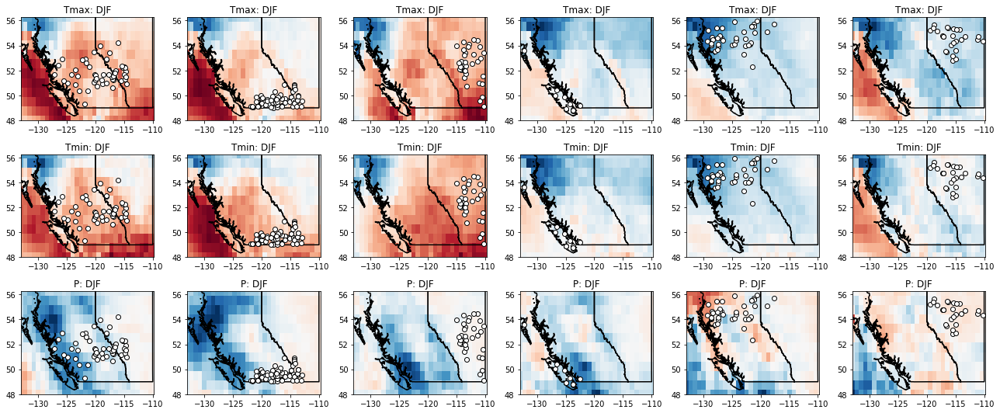

In [ ]:
#DJF: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_DJF[:,:,cluster],
          Tminnorm_dymax_DJF[:,:,cluster],
          Pnorm_dymax_DJF[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': DJF')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

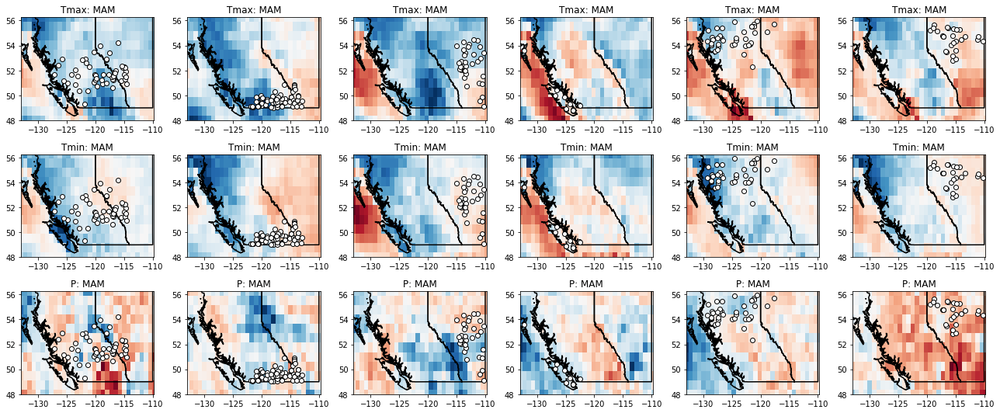

In [ ]:
#MAM: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_MAM[:,:,cluster],
          Tminnorm_dymax_MAM[:,:,cluster],
          Pnorm_dymax_MAM[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': MAM')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

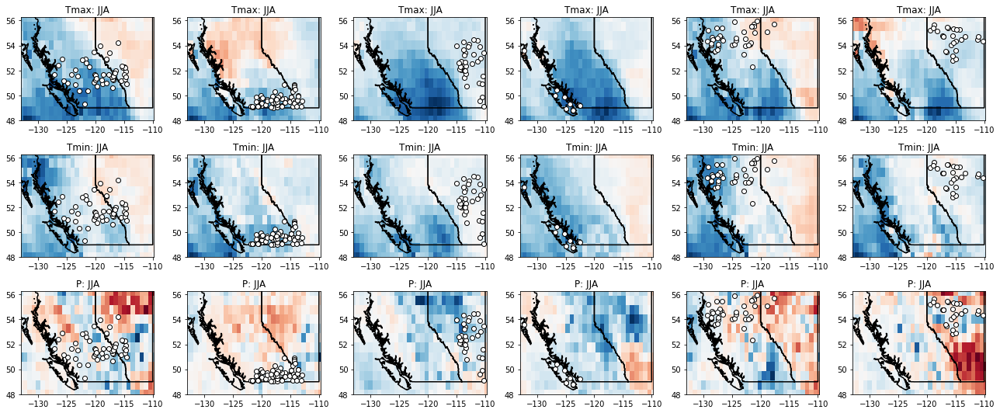

In [ ]:
#JJA: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_JJA[:,:,cluster],
          Tminnorm_dymax_JJA[:,:,cluster],
          Pnorm_dymax_JJA[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': JJA')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

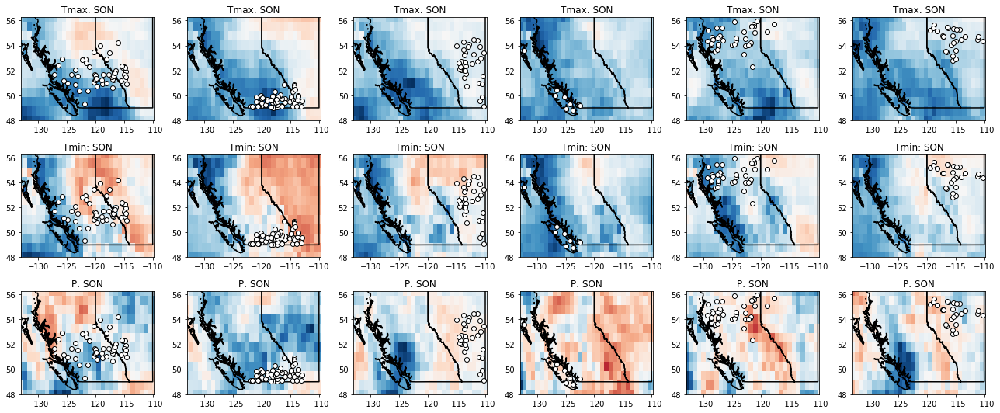

In [ ]:
#SON: rows = variables, columns = clusters

nrows = 3
ncols = n_clusters_seasonal

cmaps = ['RdBu_r', 'RdBu_r', 'RdBu']
varnames = ['Tmax', 'Tmin', 'P']

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (3*ncols, 2.5*nrows))

for cluster in range(n_clusters_seasonal):
  
  inds = np.squeeze(np.argwhere(seasonal_clustering.labels_ == cluster))
  vars = [Tmaxnorm_dymax_SON[:,:,cluster],
          Tminnorm_dymax_SON[:,:,cluster],
          Pnorm_dymax_SON[:,:,cluster]]
  
  for kk, var in enumerate(vars):

    vmax = np.max(np.abs(var))
    vmin = -vmax
    axes[kk,cluster].imshow(var, cmap = cmaps[kk], aspect = 'auto', extent = extentERA, vmin = vmin, vmax = vmax)

    plot_prov_ax(prov = prov, ax = axes[kk,cluster])
    axes[kk,cluster].scatter(stationLon[stationInds][inds], stationLat[stationInds][inds], facecolor = 'w', edgecolor = 'k', zorder = 5)

    axes[kk,cluster].set_title(varnames[kk] + ': SON')
    axes[kk,cluster].set_xlim(left = np.min(eraLon), right = np.max(eraLon))
    axes[kk,cluster].set_ylim(bottom = np.min(eraLat), top = np.max(eraLat))

plt.tight_layout()

In [ ]:
Tmaxnorm_dymax_DJF_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_DJF_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_DJF_cluster = [None]*n_clusters_seasonal

Tmaxnorm_dymax_MAM_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_MAM_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_MAM_cluster = [None]*n_clusters_seasonal

Tmaxnorm_dymax_JJA_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_JJA_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_JJA_cluster = [None]*n_clusters_seasonal

Tmaxnorm_dymax_SON_cluster = [None]*n_clusters_seasonal
Tminnorm_dymax_SON_cluster = [None]*n_clusters_seasonal
Pnorm_dymax_SON_cluster = [None]*n_clusters_seasonal

for cluster in range(n_clusters_seasonal):

  #DJF
  Tmaxnorm_dymax_DJF_cluster[cluster] = Tmaxnorm_dymax_DJF[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_DJF_cluster[cluster] = Tminnorm_dymax_DJF[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_DJF_cluster[cluster] = Pnorm_dymax_DJF[:,:,cluster].flatten()[unique_in_clusters[cluster]]

  #MAM
  Tmaxnorm_dymax_MAM_cluster[cluster] = Tmaxnorm_dymax_MAM[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_MAM_cluster[cluster] = Tminnorm_dymax_MAM[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_MAM_cluster[cluster] = Pnorm_dymax_MAM[:,:,cluster].flatten()[unique_in_clusters[cluster]]

  #JJA
  Tmaxnorm_dymax_JJA_cluster[cluster] = Tmaxnorm_dymax_JJA[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_JJA_cluster[cluster] = Tminnorm_dymax_JJA[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_JJA_cluster[cluster] = Pnorm_dymax_JJA[:,:,cluster].flatten()[unique_in_clusters[cluster]]

  #SON
  Tmaxnorm_dymax_SON_cluster[cluster] = Tmaxnorm_dymax_SON[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Tminnorm_dymax_SON_cluster[cluster] = Tminnorm_dymax_SON[:,:,cluster].flatten()[unique_in_clusters[cluster]]
  Pnorm_dymax_SON_cluster[cluster] = Pnorm_dymax_SON[:,:,cluster].flatten()[unique_in_clusters[cluster]]

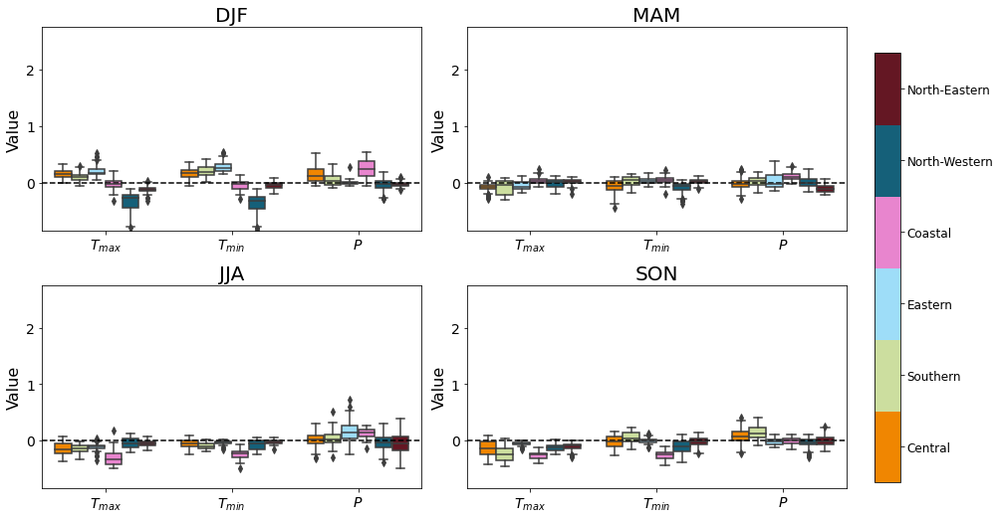

In [ ]:
#boxplot: all seasons + all clusters 

saveIt = 0

xx = np.concatenate(np.array([kk*np.ones(Nunique_in_clusters) for kk in range(3)], dtype = 'object'))
hue = np.concatenate(np.array([cluster*np.ones(len(unique_in_clusters[cluster])) for cluster in range(n_clusters_seasonal)], dtype = 'object'))
hue = np.tile(hue,3)
bps = [None]*4 #empty list of boxplots

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (12,8))

#DJF
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_DJF_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_DJF_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_DJF_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[0] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,0])

#MAM
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_MAM_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_MAM_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_MAM_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[1] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[0,1])


#JJA
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_JJA_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_JJA_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_JJA_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[2] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,0])

#SON
yy = np.concatenate(
    (np.concatenate(np.array([Tmaxnorm_dymax_SON_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Tminnorm_dymax_SON_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object')),
     np.concatenate(np.array([Pnorm_dymax_SON_cluster[cluster] for cluster in range(n_clusters_seasonal)], dtype = 'object'))
    ))
bps[3] = sns.boxplot(x = xx, y = yy, hue = hue, ax = axes[1,1])

titles = ['DJF','MAM','JJA','SON']
for kk, ax in enumerate(axes.flatten()):
  ax.plot([-0.5,2.5],[0,0], 'k--')
  ax.set_xlim(left = -0.5, right = 2.5)
  ax.set_ylim(bottom = -0.85, top = 2.75)
  ax.set_title(titles[kk], fontsize = fs)
  ax.set_ylabel('Value', fontsize = fs - 4)
  ax.tick_params(labelsize = fs-6)

for bp in bps: #for each boxplot, colour the box according to its streamflow cluster

  bp.get_legend().remove()
  bp.set_xticklabels(labels = ['$T_{max}$', '$T_{min}$', '$P$'])

  kk = 0
  for jj in range(3):
    for cluster in range(n_clusters_seasonal):
      bp.artists[kk].set_facecolor(rgbs_array[cluster])
      kk+=1

fig.tight_layout(rect=[0, 0.03, 1, 0.95])

cmap = matplotlib.colors.ListedColormap(rgbs_array)
bounds = [0,1,2,3,4,5,6]
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
s = plt.scatter([10,11,12,14,15],[0,0,0,0,0], c=[0,1,2,4,5], cmap = cmap, norm = norm) #just for colourmap
cb_ax = fig.add_axes([1.02,0.1,0.03,0.75])
cb = fig.colorbar(s, cax = cb_ax)
cb.set_ticks(np.arange(0.5,6.5,1))
cb.set_ticklabels(['Central', 'Southern', 'Eastern', 'Coastal', 'North-Western', 'North-Eastern'])
cb.ax.tick_params(labelsize = fs-8)

# plt.tight_layout()

if saveIt:
  # plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'top.png', dpi = 300, bbox_inches = 'tight')
  plt.savefig(str(N_antecedent) + 'antecedent_' + str(N_top) + 'random.png', dpi = 300, bbox_inches = 'tight')

plt.show()